##Import all the packages


In [ ]:
import os
from google.colab import drive
from pathlib import Path
from datetime import datetime

drive.mount('/content/gdrive')
home_path = Path("/content/gdrive/MyDrive/CPP_data")
os.chdir(home_path)

print(home_path)
print(os.getcwd())

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/MyDrive/CPP_data
/content/gdrive/MyDrive/CPP_data


In [ ]:
import numpy as np
import pandas as pd
import pyarrow 
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from sklearn.decomposition import PCA
#from sklearn.preprocessing import StandardScaler
import re

#import boto3
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
from torch.autograd import Variable

from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from pathlib import Path
import plotly.express as px
# from learn.dataset import TabularDataset
# from learn.model import CiteAutoencoder
# from learn.train import train_model, get_encodings

!pip install umap-learn
!pip install umap-learn[parametric_umap]
!pip install umap-learn[plot]
import umap


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


##UNIVERSAL FUNCTIONS

###Markers

In [ ]:
#MARKERS
markers_all = dict()
markers_all = {'immune' : ["PTPRC"],
'stroma' : ["FAP","HTRA1","FBN1"],
'epithel' : ["KRT2","KRT7","KRT8","VIL1","KRT19","KRT20","CLDN7","EPCAM","MUC1","KRT18","CLDN4"],
'melanocyte': ["MIA","SLC45A2","PMEL","MLANA"],
'keratinocyte': ["KRT1","KRT2","KRT5","KRT10","KRT14","KRT15"],
'tcell': ["CD3E","CD3D","CD3G"],
'bcell': ["FCRL1","FCRLA","PAX5","MS4A1","CD19","CD79B","CLEC17A","CD22","CD79A"],
'myeloid': ["CCR1","CD68","CD14","CSF1R","CD163","IGSF6","C5AR1","LILRA5"],
'neutrophil': ["CXCR2","TMEM252","ALPL","KRT23","FCGR3B","FCGR3A","MGAM","CXCR1","HIST2H2AA4"],
'm2': ["MSR1","CD38","HLA-DRA","HLA-DRB1","HLA-DRB5","MRC1","C1QA"],
'natural_killer': ["NCAM1","NCR1","KLRB1","FCGR3A","FGFBP2","GZMB"],
'plasma': ["DERL3","SDC1","PRDX4","SSR4","JCHAIN","FKBP11"],
'cd4': ["CD4"],
'cd8': ["CD8A","CD8B"],
'treg': ["IL2RA","FOXP3","CCR8"],
'naive': ["TCF7","IL7R","CCR7","SELL","LEF1","LTB"],
'early': ["GZMK","SH2D1A","EOMES","DTHD1","SLAMF7","FCRL3","CD28","CXCR5"],
'exhausted': ["HAVCR2","ENTPD1","GZMB","LAYN","CD38","VCAM1","TOX","LAG3"],
'cycling': ["MKI67","TOP2A"],
'tismem': ["ITGAE","ZNF683","ITGA1"],
'eff': ["FCGR3A","FGFBP2","CX3CR1","SORL1","S1PR1","KLF2","KLRG1","LILRB1"],
'caf': ["S100A4","CD248","PDPN","THY1","COL1A1","COL1A2","COL6A1","COL6A2","COL6A3","DCN"],
'pericyte': ["CSPG4","RGS5","ACTA2","DES","PDGFRB"],
'endothel': ["PECAM1","FLT4","STAB1","FLT1","ICAM1","ICAM2","SELE","SELP","VWF","CD34","CDH5"]}


In [ ]:
markers_four = dict()
markers_four = {'Naive': ["TCF7","IL7R","CCR7","SELL","LEF1","LTB"],
'EarlyMemory': ["GZMK","SH2D1A","EOMES","DTHD1","SLAMF7","FCRL3","CD28","CXCR5"],
'Exhausted': ["HAVCR2","ENTPD1","GZMB","LAYN","CD38","VCAM1","TOX","LAG3"],
'TissueResidentMemory': ["ITGAE","ZNF683","ITGA1"],
'AbundantGenes':["GAPDH","RPL19","ACTB","PTPRC","CD3D","CD3E","CD3G","CD8A","CD8B"],
'CheckPoints':["CTLA4","PDCD1","TIGIT","PVRIG","CD96","CD226"]
}

In [ ]:
markers_last = dict()
markers_last = {
    'Naive': ["TCF7","IL7R","CCR7","SELL","LEF1","LTB"],
    'EarlyMemory': ["GZMK","SH2D1A","EOMES","DTHD1","SLAMF7","FCRL3","CXCR5"],
    'Exhausted': ["HAVCR2","ENTPD1","LAYN","CD38","VCAM1","TOX","LAG3"],
    'TissueResidentMemory': ["ITGAE","ZNF683","ITGA1"],
    'TEM':["FCGR3A","FGFBP2","CX3CR1","LILRB1","SORL1"],
    'Cycling':["TOP2A","MKI67"],
    'CirculatingMemory':["NR4A1","NR4A2","NR4A3","KLF2"],
    'AbundantGenes':["GAPDH","RPL19","ACTB","PTPRC","CD3D","CD3E","CD3G","CD8A","CD8B"],
    'CheckPoints':["CTLA4","PDCD1","TIGIT","PVRIG","CD96","CD226"]
    }

'''
EarlyMemory <- c("CXCR5","GZMK","SH2D1A","EOMES","DTHD1","SLAMF7","FCRL3")  "CD28"
Exhausted <- c("HAVCR2","ENTPD1","LAYN","CD38","LAG3","VCAM1","TOX")   "GZMB"

TEM <- c("FCGR3A","FGFBP2","CX3CR1","LILRB1","SORL1")
CirculatingMemory <- c("NR4A1","NR4A2","NR4A3","KLF2")

# last addition from Yossef (dark gray)
AbundantGenes <- c("GAPDH","RPL19","ACTB","PTPRC","CD3D","CD3E","CD3G","CD8A","CD8B")

Last confirmation from Yossef:
EarlyMemory <- c("CXCR5","GZMK","SH2D1A","EOMES","DTHD1","SLAMF7","FCRL3")

Exhausted <- c("HAVCR2","ENTPD1","LAYN","CD38","LAG3","VCAM1","TOX")

Naive <- c("TCF7","CCR7","IL7R","LEF1","SELL","LTB")

TissueResidentMemory <- c("ITGAE","ITGA1","ZNF683")

TEM <- c("FCGR3A","FGFBP2","CX3CR1","LILRB1","SORL1")

Cycling <- c("TOP2A","MKI67")

CirculatingMemory <- c("NR4A1","NR4A2","NR4A3","KLF2")
The abundant genes are just to make sure there is no bias related to gene expression.

AbundantGenes <- c("GAPDH","RPL19","ACTB","PTPRC","CD3D","CD3E","CD3G","CD8A","CD8B")


The Check Point genes are what we currently studying. They are not a set of cell state specific markers
''' 

'\nEarlyMemory <- c("CXCR5","GZMK","SH2D1A","EOMES","DTHD1","SLAMF7","FCRL3")  "CD28"\nExhausted <- c("HAVCR2","ENTPD1","LAYN","CD38","LAG3","VCAM1","TOX")   "GZMB"\n\nTEM <- c("FCGR3A","FGFBP2","CX3CR1","LILRB1","SORL1")\nCirculatingMemory <- c("NR4A1","NR4A2","NR4A3","KLF2")\n\n# last addition from Yossef (dark gray)\nAbundantGenes <- c("GAPDH","RPL19","ACTB","PTPRC","CD3D","CD3E","CD3G","CD8A","CD8B")\n\nLast confirmation from Yossef:\nEarlyMemory <- c("CXCR5","GZMK","SH2D1A","EOMES","DTHD1","SLAMF7","FCRL3")\n\nExhausted <- c("HAVCR2","ENTPD1","LAYN","CD38","LAG3","VCAM1","TOX")\n\nNaive <- c("TCF7","CCR7","IL7R","LEF1","SELL","LTB")\n\nTissueResidentMemory <- c("ITGAE","ITGA1","ZNF683")\n\nTEM <- c("FCGR3A","FGFBP2","CX3CR1","LILRB1","SORL1")\n\nCycling <- c("TOP2A","MKI67")\n\nCirculatingMemory <- c("NR4A1","NR4A2","NR4A3","KLF2")\nThe abundant genes are just to make sure there is no bias related to gene expression.\n\nAbundantGenes <- c("GAPDH","RPL19","ACTB","PTPRC","CD3D","CD3

###Upload dataset, filter by cells needed, add markers

In [ ]:
def check_markers(dataset, markers):
    count=0
    dataset['marker'] = 'none'
    print('************************************************')
    for key in markers.keys():
      count_key=0
      #print('Checking markers from set', key)
      for each in markers[key]:
        if len(dataset.loc[(dataset['gene'] == each)]) >0:
          dataset.loc[(dataset['gene'] == each), 'marker'] = key
          #print('Found', each)
          count+=1
          count_key+=1
        else:
          print('Not found', each)
      print(f'Total markers for key {key} is: {count_key}')
    print('Total number of markers found', count)
    markers_count = dataset['marker'].value_counts()
    print('The main markers count ', markers_count[main_markers].sum())
    print('The Checkpoints count ', markers_count[check_points].sum())
    print('The markers for check purposes count ', markers_count[markers_check].sum())
    print('************************************************')

    return dataset

def filtering_some_genes(dataset):
#filtering Mitochondrial and the Mirna genes according to Amit instruction
#genes <- colnames(tGSEdata)[-grep(x=colnames(tGSEdata),pattern="^R[NUP]|^MT-|^MIR",perl=T)]

#"^R[NUP]|^MT-|^MIR”
#RN
#RU
#RP
#MT- only 1 and not in the beginning 
#MIR - 1258
#343 R[NUP]
  print('************************************************')
  r = re.compile("R[NUP]")
  #excluding R[NUP]
  print('The total number of genes filtered out by R[NUP] : ', len(dataset[dataset.gene.str.match(r)]))
  if len(dataset[dataset.gene.str.match(r)]) > 0:
    dataset = dataset[~dataset.gene.str.match(r)]
  r = re.compile("MIR")
  print('The total number of genes filtered out by MIR : ', len(dataset[dataset.gene.str.match(r)]))
  if len(dataset[dataset.gene.str.match(r)]) > 0:
    dataset = dataset[~dataset.gene.str.match(r)]
  r = re.compile("MT")
  print('The total number of genes filtered out by MT : ', len(dataset[dataset.gene.str.match(r)]))
  if len(dataset[dataset.gene.str.match(r)]) > 0:
    dataset = dataset[~dataset.gene.str.match(r)]
  print('Final dataset shape: ', dataset.shape)
  print('************************************************')
  return dataset

def create_all_markers_ref_set(dataset, markers):
    print('markers1')
    print(markers)
    all_markers = []
    for key in markers.keys():
      all_markers+= markers[key]
    all_markers_dataset = dataset.copy()
    all_markers_dataset.set_index('gene', inplace=True)
    all_indxs = all_markers_dataset.index
    to_delete = np.setdiff1d(all_indxs, all_markers)
    all_markers_dataset = all_markers_dataset.drop(index=to_delete, axis=0)
    #all_markers_dataset
    print('Total number of markers used', len(all_markers_dataset))
    all_markers_dataset.reset_index(inplace=True)
    #print('all_markers_dataset', all_markers_dataset.columns)
    
    return all_markers_dataset

def add_markers(dataset_f, dataset_or, markers):
  #function adds markers to the dataset
    count=count_tot=0
    print('************************************************')
    for key in markers.keys():
      count_tot+=len(markers[key])
      for each in markers[key]:
        if len(dataset_f.loc[(dataset_f['gene'] == each)]) == 0:
          # if there is no such marker in the final dataset
          print('Found gene that was absent. Adding it...', each)
          #print(dataset_f.columns)
          #print(dataset_or.columns)
          dataset_f=dataset_f.append(dataset_or.loc[(dataset_or['gene'] == each)])      
          count+=1
        else:
          #print('Already exists')
          pass
    print('Total number of markers', count_tot)
    print('Total number of markers added', count)
    print('************************************************')
    dataset_f = dataset_f.sort_index()
    return dataset_f


def prepare_dataset(home_path, path_dataset, path_labels, dataset_name, markers, cell_name_to_filter=None, filter_mit=True):
  #prepares data for the following processing (PCA or NN) 
  #removes cells that we do not need, filter out genes that we do not need, etc.
  #help functions are above
    #name_file = dataset_name + '.parquet.gzip'
    #dataset = pd.read_parquet(os.path.join(home_path, name_file))
    dataset = pd.read_parquet(path_dataset)
    column_names = dataset.columns
    print(column_names[:5])
    if 'symbol' in column_names:
        dataset.columns = ['gene' if x=='symbol' else x for x in dataset.columns]
    print(dataset_name, ' data shape:', dataset.shape)
    if not cell_name_to_filter == None:
      labels = pd.read_csv(path_labels, '\t', header=None)
      print(dataset_name, ' labels shape:', labels.shape)
      print(labels[1].value_counts())
      labels = labels.loc[labels[1] == cell_name_to_filter]
      labels.drop(1, axis=1, inplace=True)
      labels_list = labels.to_numpy().reshape(1, -1)

      #all the columns of the whole dataset
      columns = dataset.columns[1:-1]
      #we have to find the columns that are NOT in CD8 set
      col_to_drop = [x for x in columns if x not in labels_list]
      #now we remove these columns from the dataset
      dataset = dataset.drop(col_to_drop, axis=1)
      print('Dataset filtered by cells needed (',cell_name_to_filter, '), final shape:', dataset.shape)

    if filter_mit:
      print('************************************************')
      print('Filtering Mitochondrial and Mirna genes..')
      dataset_filtered = filtering_some_genes(dataset)

    if markers != None:
        print('************************************************')
        print('markers1')
        print(markers)
        all_markers_dataset = create_all_markers_ref_set(dataset, markers)
        print('Adding markers...')
        dataset_filtered = add_markers(dataset_filtered, all_markers_dataset, markers)
        dataset_filtered = check_markers(dataset_filtered, markers)
        
    #dataset_filtered.to_parquet('/content/gdrive/MyDrive/CPP_data/data_NSCLC_filtered.gzip', compression='gzip')
    #name_file = dataset_name + '_filtered_markers.gzip'
    #dataset_filtered.to_parquet(os.path.join(home_path, name_file), compression='gzip')

    return dataset_filtered

###Preparing data for PCA and running PCA

In [ ]:
def variance_set(X, x_labels):
  genes_var = pd.DataFrame(data=X.var(axis=1), columns=['Var'])
  print('variance tables shape', genes_var.shape)
  print('x_labels', x_labels.shape)
  print('x_labels index', x_labels.index)
  print('genes_var index', genes_var.index)
  print('difference in indexes', np.setdiff1d(x_labels.index, genes_var.index))
  print(X.shape)
  genes_var['Mean'] = X.mean(axis=1,skipna=True, numeric_only=True)
  genes_var['Std'] = X.std(axis=1,skipna=True, numeric_only=True)
  print('variance tables shape', genes_var.shape)
  genes_var = genes_var.join(x_labels)
  print('variance table', genes_var.head())
  print('variance tables shape', genes_var.shape)
  print('************************************************')
  return genes_var
'''
cnt=0
  for key in markers.keys():
    for each in markers[key]:
      if len(training_set.loc[(training_set['gene'] == each)]) > 0:
        cnt+=1
  print('Total number of markers equals: ', cnt)

'''

def check_var_thresh(dataset,th_mean, th_std_ratio):
  print('Mean mean value by genes', dataset.Mean.mean(axis=0))
  print('Mean std value by genes', dataset.Std.mean(axis=0))
  check=dataset[(dataset.Mean>th_mean)&((dataset.Std/dataset.Mean)>th_std_ratio)]
  print(check.shape)



def prep_data_PCA(home_path, path_dataset, dataset_name, markers, th_mean, th_std_ratio):
  #takes the filtered dataset and returns training set for PCA task
  name_file = dataset_name + 'filtered_markers.gzip'
  dataset_filtered = pd.read_parquet(os.path.join(home_path, name_file)).reset_index(drop=True)
  print('Dataset shape: ', dataset_filtered.shape)
  x_labels = dataset_filtered['gene']
  x_markers = dataset_filtered['marker']
  print('x_labels shape', x_labels.shape, 'x_markers shape', x_markers.shape)
  X = dataset_filtered.iloc[:, 1:-1]
  dataset_filtered['marker'].fillna('none', inplace=True)
  print('Markers values: \n', dataset_filtered['marker'].value_counts())
  X = np.log2(X+1)
  X['gene'] = x_labels
  X['marker'] = x_markers
  print('X for PCA shape: ', X.shape)
  #calculatin variance for every gene
  genes_var = variance_set(X, x_labels)
  #filtering genes according to the threshold
  training_set = X[(genes_var.Mean>th_mean)&((genes_var.Std/genes_var.Mean)>th_std_ratio)]
  print('Training set shape', training_set.shape)
  print('Adding markers (check if they were deleted)')
  training_set = add_markers(training_set, X, markers)
  #print('Final check')
  check_markers(training_set, markers)
  print('The final dataset shape for PCA: ', training_set.shape)
  print('************************************************')
  training_set = training_set.sort_index()
  return training_set, genes_var 


def running_PCA(dataset, home_path, num_comp=10):
  #we input training_set to run PCA on it (by default using 10 components)
  var_pc=np.zeros(num_comp)
  gene_labels_fin = dataset['gene'].reset_index(drop=True)
  gene_markers_fin = dataset['marker'].reset_index(drop=True).copy()
  print('markers check: \n', gene_markers_fin.value_counts())
  tr_x_indxs=dataset.index
  X_train = dataset.iloc[:, 1:-2]
  print('X_train shape: ', X_train.shape)
  print('************************************************')
  print("Principal Component Analysis (PCA)")
  pca = PCA(n_components = num_comp)
  X_pca = pca.fit_transform(X_train)
  col_names = list(' ') * num_comp
  for i in range(num_comp):
    col_names[i] = 'PC' + str(i+1)

  #pca_df = pd.DataFrame(data=X_pca, columns=['PC1','PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'])
  pca_df = pd.DataFrame(data=X_pca, columns=col_names)
  pca_df = pd.concat([pca_df, gene_labels_fin], axis=1)
  pca_df = pd.concat([pca_df, gene_markers_fin], axis=1)
  print('explained var by components', np.round(pca.explained_variance_ratio_,5))
  for i in range(var_pc.shape[0]):
    var_pc[i] = np.round(pca.explained_variance_ratio_*100,5)[i]
  #palette = sns.color_palette("muted", n_colors=len(list(labels['cell_type'].unique())))
  #pca_df.to_csv('pca_df_10.csv')

  #adding date and time to the saved file
  name_file= dataset_name +'_' + str(len(markers)) +'_PCA_'+ str(num_comp) + '_' + datetime.now().strftime("%d-%m_%H:%M") + '.csv'
  print('Saving results of PCA to csv file...')
  pca_df.to_csv(os.path.join(home_path, name_file))
  return pca_df, var_pc

def plotting_res_sns(df, var_pc, comp1, comp2, color_marker, title):
    #takes pca_df and variable with components and the names of the components we are interested in
    #comp1 and comp2 are STRINGS in the following format: 'PC1', 'PC2', etc
    sns.set_style("white")
    indx1 = int(comp1[-1]) - 1 
    indx2 = int(comp2[-1]) - 1
    #color_marker = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
     #                   'EarlyMemory': 'red','TEM': 'purple','CirculatingMemory': 'darkgreen',
      #                  'Cycling': 'yellow', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
    f, ax = plt.subplots(figsize=(16, 8))
    p1 = sns.scatterplot(x=comp1,y=comp2,data=df, linewidth=0.2, s=30, alpha=1, hue='marker', legend='full',
                     #palette=['lightgray','black', 'darkgreen', 'purple', 'red', 'blue','lightgreen', 'cyan','darkgray', 'yellow'])
                     palette=color_marker)
    p1.set_title(title)
    plt.xlabel(comp1 + ' - ' + str(var_pc[indx1])[:4] + '%')
    plt.ylabel(comp2 + ' - ' + str(var_pc[indx2])[:4] + '%')

    #for line in range(0,df.shape[0]):
     # if pca_df.PC1[line] > 200:
      #  p1.text(pca_df.PC1[line]+0.01, pca_df.PC2[line], 
       # pca_df.gene[line], horizontalalignment='left', 
        #size='small', color='black', weight='regular')
    #plt.legend()
    plt.show()

def plotting_res_plotly(df, var_pc, comp1, comp2, color_marker, title):
    indx1 = int(comp1[-1]) - 1 
    indx2 = int(comp2[-1]) - 1
#color_dict = {0:'blue',1:'red'}
#[color_dict[x] for x in Y]
#parameter c - defines color for each point
#c = [color_dict[x] for x in df.class]

    #color_marker = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
     #                   'EarlyMemory': 'red','TEM': 'purple','CirculatingMemory': 'darkgreen',
      #                  'Cycling': 'yellow', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}

    fig = px.scatter(df, x=comp1, y=comp2, color="marker", hover_name='gene', #text='gene',
                    labels={
                        comp1: comp1 + ' - ' + str(var_pc[indx1])[:4] + '%',
                        comp2: comp2 + ' - ' + str(var_pc[indx2])[:4] + '%'},
                    
                    color_discrete_sequence=['lightgray','black', 'darkgreen', 'purple', 'red', 'blue','lightgreen', 'cyan','darkgray', 'yellow'],
                    color_discrete_map= color_marker,
                    title= title)

    fig.show()


def plotting_UMAP_sns(df, comp1, comp2, color_marker, title):
    #takes pca_df and variable with components and the names of the components we are interested in
    #comp1 and comp2 are STRINGS in the following format: 'PC1', 'PC2', etc
    sns.set_style("white")
    indx1 = int(comp1[-1]) - 1 
    indx2 = int(comp2[-1]) - 1
    #color_marker = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
     #                   'EarlyMemory': 'red','TEM': 'purple','CirculatingMemory': 'darkgreen',
      #                  'Cycling': 'yellow', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
    f, ax = plt.subplots(figsize=(16, 8))
    p1 = sns.scatterplot(x=comp1,y=comp2,data=df, linewidth=0.2, s=30, alpha=1, hue='marker', legend='full',
                     #palette=['lightgray','black', 'darkgreen', 'purple', 'red', 'blue','lightgreen', 'cyan','darkgray', 'yellow'])
                     palette=color_marker)
    p1.set_title(title)
    plt.xlabel('UMAP1')
    plt.ylabel('UMAP2')
    plt.show()

'''
  fig = px.scatter(plot_emb_res, x="UMAP1", y="UMAP2", color="marker",
                  color_discrete_map = color_marker,
                  hover_name='gene',
                  title = title)                
  fig.show()

'''


def plotting_UMAP_plotly(df, comp1, comp2, color_marker, title):
    fig = px.scatter(df, x=comp1, y=comp2, color="marker", hover_name='gene', #text='gene',
                    color_discrete_map= color_marker,
                    title= title)
    fig.show()

'''
Naive, Exhausted, TissueResidentMemory, EarlyMemory,TEM,CirculatingMemory,Cycling,CheckPoints, Abundant

Blue, light green,cyan, red, purple,dark green,yellow,black, dark gray
'''




'\nNaive, Exhausted, TissueResidentMemory, EarlyMemory,TEM,CirculatingMemory,Cycling,CheckPoints, Abundant\n\nBlue, light green,cyan, red, purple,dark green,yellow,black, dark gray\n'

### UMAP (embedding and plotting the result)

In [ ]:
def umap_embedding(encodings, gene_labels_fin, gene_markers_fin, title):
  embedding = umap.UMAP(random_state=0).fit_transform(encodings)
  print(embedding.shape)
  print(encodings.shape, gene_labels_fin.shape, gene_markers_fin.shape)
  plot_emb_res=pd.concat([gene_labels_fin, gene_markers_fin], axis=1)
  plot_emb_res["UMAP1"] = embedding[:, 0]
  plot_emb_res["UMAP2"] = embedding[:, 1]
  #plot_emb_res.head()
  plotting_UMAP_plotly(plot_emb_res, 'UMAP1', 'UMAP2', color_marker, title)
  plotting_UMAP_sns(plot_emb_res, 'UMAP1', 'UMAP2',color_marker, title)  



###Model

In [ ]:
from torch.utils.data import Dataset

class TabularDataset(Dataset):
    """Custome dataset for tabular data"""
    def __init__(self, data):
        self.data = data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        x = self.data[idx]
        return x, x


from collections import defaultdict
from tqdm import tqdm


def train_model(model, train_dl, valid_dl, lr, epochs, verbose=True):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=lr,
                                                    steps_per_epoch=len(train_dl), epochs=epochs)
    criterion = nn.MSELoss()
    history = defaultdict(list)
    
    mean_losses = []
    for epoch in tqdm(range(1, epochs + 1)):
        model.train()
        
        train_loss = 0
        nsamples_train = 0
        for x, y in train_dl:
            optimizer.zero_grad()

            # Forward pass
            x_prime = model(x.to(device))
            
            loss = criterion(x_prime, y.to(device))

            # Backward pass
            loss.backward()
            optimizer.step()
            scheduler.step()
            
            # log losses
            batch_size = x.shape[0]
            nsamples_train += batch_size
            train_loss += batch_size*(loss.item())
            
        valid_loss = 0
        nsamples_valid = 0
        
        model = model.eval()
        

        with torch.no_grad():
            for x, y in valid_dl:
                x_prime = model(x.to(device))

                loss = criterion(x_prime, y.to(device))
                
                # log losses
                batch_size = x.shape[0]
                nsamples_valid += batch_size
                valid_loss += batch_size*(loss.item())
                
        train_loss = train_loss / nsamples_train
        valid_loss = valid_loss / nsamples_valid

        history['train'].append(train_loss)
        history['valid'].append(valid_loss)

        
        if verbose and epoch%10==0:
            print(f'Epoch {epoch}: train loss {train_loss}; valid loss {valid_loss}')

    return model, history

def get_encodings(model, dl):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()
    with torch.no_grad():
        encodings = [model.encoder(x.to(device)) for x, _ in dl]
    return torch.cat(encodings, dim=0)


class LinBnDrop(nn.Sequential):
    """Module grouping `BatchNorm1d`, `Dropout` and `Linear` layers, adapted from fastai."""
    
    def __init__(self, n_in, n_out, bn=True, p=0., act=None, lin_first=True):
        layers = [nn.BatchNorm1d(n_out if lin_first else n_in)] if bn else []
        if p != 0: layers.append(nn.Dropout(p))
        lin = [nn.Linear(n_in, n_out, bias=not bn)]
        if act is not None: lin.append(act)
        layers = lin+layers if lin_first else layers+lin
        super().__init__(*layers)


class Encoder(nn.Module):
    """Encoder for CITE-seq data"""
    
    def __init__(self, nfeatures_rna, nfeatures_pro, hidden_rna, hidden_pro, z_dim):
        super().__init__()
        self.nfeatures_rna = nfeatures_rna
        self.nfeatures_pro = nfeatures_pro

        if nfeatures_rna > 0:
            self.encoder_rna = LinBnDrop(nfeatures_rna, hidden_rna, p=0.1, act=nn.LeakyReLU())

        if nfeatures_pro > 0:
            self.encoder_protein = LinBnDrop(nfeatures_pro, hidden_pro, p=0.1, act=nn.LeakyReLU())

        # make sure hidden_rna and hidden_pro are set correctly
        hidden_rna = 0 if nfeatures_rna == 0 else hidden_rna
        hidden_pro = 0 if nfeatures_pro == 0 else hidden_pro
        
        self.encoder = LinBnDrop(hidden_rna + hidden_pro, z_dim, act=nn.LeakyReLU())

    def forward(self, x):
        if self.nfeatures_rna > 0 and self.nfeatures_pro > 0:
            x_rna = self.encoder_rna(x[:, :self.nfeatures_rna])
            x_pro = self.encoder_protein(x[:, self.nfeatures_rna:])
            x = torch.cat([x_rna, x_pro], 1)

        elif self.nfeatures_rna > 0 and self.nfeatures_pro == 0:
            x = self.encoder_rna(x)

        elif self.nfeatures_rna == 0 and self.nfeatures_pro > 0:
            x = self.encoder_protein(x)
            
        return self.encoder(x)


class Decoder(nn.Module):
    """Decoder for CITE-seq data"""
    def __init__(self, nfeatures_rna, nfeatures_pro, hidden_rna, hidden_pro, z_dim):
        super().__init__()
        self.nfeatures_rna = nfeatures_rna
        self.nfeatures_pro = nfeatures_pro

        # make sure hidden_rna and hidden_pro are set correctly
        hidden_rna = 0 if nfeatures_rna == 0 else hidden_rna
        hidden_pro = 0 if nfeatures_pro == 0 else hidden_pro

        hidden = hidden_rna + hidden_pro

        self.decoder = nn.Sequential(
            LinBnDrop(z_dim, hidden, act=nn.LeakyReLU()),
            LinBnDrop(hidden, nfeatures_rna + nfeatures_pro, bn=False)
            )

    def forward(self, x):
        x = self.decoder(x)
        return x

        
class CiteAutoencoder(nn.Module):
    def __init__(self, nfeatures_rna=0, nfeatures_pro=0, hidden_rna=120, hidden_pro=8, z_dim=20):
        """ Autoencoder for citeseq data """
        super().__init__()
 
        self.encoder = Encoder(nfeatures_rna, nfeatures_pro, hidden_rna, hidden_pro, z_dim)
        self.decoder = Decoder(nfeatures_rna, nfeatures_pro, hidden_rna, hidden_pro, z_dim)


    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


In [ ]:
#Data preparation for the model

def data_prep_train_for_NN(training_set, n_dim, n_epochs=15):
  gene_labels_fin = training_set['gene'].reset_index(drop=True).copy()
  gene_markers_fin = training_set['marker'].reset_index(drop=True).copy()
  X_nn = training_set.reset_index(drop=True)
  X_nn = X_nn.iloc[:, :-2]
  print(f'Shape of the dataset for the modelling: {X_nn.shape}')
  train, valid = train_test_split(X_nn.to_numpy(dtype=np.float32), test_size=0.1, random_state=0)
  print(f'Shape of the train set: {train.shape}, shape of the validation set {valid.shape}')
  nfeatures  = X_nn.shape[1]
  #print(f'Number of features for the train: {nfeatures}')
  train_ds = TabularDataset(train)
  valid_ds = TabularDataset(valid)
  train_dl = DataLoader(train_ds, batch_size=64, shuffle=True)
  valid_dl = DataLoader(valid_ds, batch_size=64, shuffle=False)
  #x, y = next(iter(train_dl))
  #x.shape, y.shape
  model = CiteAutoencoder(nfeatures_rna=nfeatures, nfeatures_pro=0, hidden_rna=400, hidden_pro=0, z_dim=n_dim)
  print(model)
  lr = 1e-2
  epochs = n_epochs
  model, losses = train_model(model, train_dl, valid_dl, lr=lr, epochs=epochs)
  fig =  plt.plot(figsize=(15,5))
  plt.plot(losses['train'], label = 'Train loss')
  plt.plot(losses['valid'], label='Validation loss')
  plt.legend()
  plt.show()
  return model, X_nn, gene_labels_fin, gene_markers_fin

def test_NN_print_result(model, X_nn, gene_labels_fin, gene_markers_fin, n_dim):
  test_ds = TabularDataset(X_nn.to_numpy(dtype=np.float32))
  test_dl = DataLoader(test_ds, batch_size=64, shuffle=False)

  encodings = get_encodings(model, test_dl)
  encodings = encodings.cpu().numpy()
  print(f'Encoding shape: {encodings.shape}')
  columns = list(range(1, n_dim+1))
  encodings_df = pd.DataFrame(data=encodings, columns=columns)
  res = pd.concat([encodings_df, gene_labels_fin, gene_markers_fin], axis=1)
  print(f'Saving csv file with the results of NN modeling, dimensions {n_dim}, markers {len(markers)}')
  name_file= dataset_name +'_' + str(len(markers)) +'_NN_'+ str(n_dim) + '_' + datetime.now().strftime("%d-%m_%H:%M") + '.csv'
  res.to_csv(os.path.join(home_path, name_file))

  return encodings

#def printing_UMAP_NNres(encodings, gene_labels_fin, gene_markers_fin):
 # return


#Running code on different datasets


### Universal pipeline (working on the filtered datasets already)



The first setup cell - we need to choose the index of the dataset we are interested in AND the number of markers (4 or 7)

In [ ]:
num_markers = int(input('Input number of markers 4 or 7: '))
print('Datasets: 0 - NSCLC, 1- CRC1, 2- CRC2, 3- HEPA, 4-MELANOMA')
index_dataset = int(input('Input the index of the dataset you are interested in: '))
n = int(input('Input how many different dimensions you want to check for PCA and NN (1, 2, 3, 4, 5?): '))
dims=np.zeros(n, dtype=int)
for i in range(n):
  dims[i]=int(input(f'Input the number of dimensions for the {i+1} run (10-50-100?): '))
print(f'So, the following dimensions will be checked: ', dims)

KeyboardInterrupt: ignored

In [ ]:
# specify the index of the dataset you need to run the code
#index_dataset = 0
print(f'Running data preparation for {num_markers} markers')
datasets = ['NSCLC', 'crc1', 'crc2', 'hepa', 'mel']
dataset_name = datasets[index_dataset]
home_path = '/content/gdrive/MyDrive/CPP_data/'

path_dataset = '/content/gdrive/MyDrive/CPP_data/data_' + datasets[index_dataset] + '_filtered.gzip'
path_labels = '/content/gdrive/MyDrive/CPP_data/labels_' + datasets[index_dataset]

#cell_name_to_filter = 'TTC'  #dataset is filtered already
main_markers = ['EarlyMemory', 'Exhausted','Naive','TissueResidentMemory']
check_points = ['CheckPoints']
markers_check = ['AbundantGenes']
if num_markers == 4:
  color_marker = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
                        'EarlyMemory': 'red', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
  markers = markers_four
else:                        
  color_marker = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
                        'EarlyMemory': 'red','TEM': 'purple','CirculatingMemory': 'darkgreen',
                        'Cycling': 'yellow', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
  markers = markers_last

thresholds={'NSCLC':[0.71, 2.1], 'crc1':[0.71, 2.1], 'crc2':[0.8, 1.9], 
            'hepa':[0.849, 1.9], 'mel' :[0.71, 2.1]}
#NSCLC thresholds 1.2998407729691086/0.7345407510056047 = 1.76
#CRC2 thresholds 1.346980341580908/0.8146161428779355 = 1.65
#hepa thresholds 1.3892587059716444 / 0.8494661794810161 = 1.63

#BASIC PIPELINE: PREPROCESSING (filtering by some genes), PREPARING FOR PCA
dataset_filtered = prepare_dataset(home_path, path_dataset, path_labels, datasets[index_dataset], markers)
dataset_filtered.head
training_set, var_df = prep_data_PCA(home_path, path_dataset, dataset_name, markers, thresholds[dataset_name][0], thresholds[dataset_name][1])

n = input('Check the thresholds? Y/N')
if n.lower() == 'y':
   #check_var_thresh(var_df,0.849, 1.9)
    pass
else:
    print(f'Running PCA for {dims} dimensions')
    pca_df, var_pc = running_PCA(training_set, home_path, dims[-1])
    for dim_size in dims:
      pca_to_print=pca_df[pca_df.columns[:dim_size]].copy()
      pca_to_print = pd.concat([pca_to_print, pca_df[pca_df.columns[-2:]]], axis=1)
      title = str(len(markers)) + ' markers, PCA - ' + str(dim_size) +'components'
      plotting_res_sns(pca_to_print, var_pc[:dim_size], 'PC2', 'PC3',color_marker, title)
      plotting_res_plotly(pca_df, var_pc, 'PC2', 'PC3',color_marker, title)  

    print('Printing UMAP maps... ')
    for dim_size in dims:
      title = 'UMAP of PCA-' + str(dim_size) + ' results ' + str(num_markers) + ' markers'
      umap_embedding(pca_df[pca_df.columns[:dim_size]], pca_df['gene'], pca_df['marker'], title)


    print('Running the Neural Network on the same params')
    for dim_size in dims:
      model, X_nn, gene_labels_fin, gene_markers_fin = data_prep_train_for_NN(training_set, dim_size, n_epochs=15)
      encodings = test_NN_print_result(model, X_nn, gene_labels_fin, gene_markers_fin, dim_size)
      title = 'UMAP of NN-' + str(dim_size) + ' results ' + str(num_markers) + ' markers'
      umap_embedding(encodings, gene_labels_fin, gene_markers_fin, title)


NameError: ignored

Two sets of markers in a row

In [ ]:
def pipeline_run():
    print(f'Dataset {dataset_name}. \nRunning data preparation for {marker} markers')

    #BASIC PIPELINE: PREPROCESSING (filtering by some genes), PREPARING FOR PCA
    dataset_filtered = prepare_dataset(home_path, path_dataset, path_labels, datasets[index_dataset], markers)
    #dataset_filtered.head
    training_set, var_df = prep_data_PCA(home_path, path_dataset, dataset_name, markers, thresholds[dataset_name][0], thresholds[dataset_name][1])

    n = input('Check the thresholds? Y/N')
    if n.lower() == 'y':
      #check_var_thresh(var_df,0.849, 1.9)
        pass
    else:
        print(f'Running PCA for {dims} dimensions')
        pca_df, var_pc = running_PCA(training_set, home_path, dims[-1])
        for dim_size in dims:
          pca_to_print=pca_df[pca_df.columns[:dim_size]].copy()
          pca_to_print = pd.concat([pca_to_print, pca_df[pca_df.columns[-2:]]], axis=1)
          title = str(len(markers)) + ' markers, PCA - ' + str(dim_size) +'components'
          plotting_res_sns(pca_to_print, var_pc[:dim_size], 'PC2', 'PC3',color_marker, title)
          plotting_res_plotly(pca_df, var_pc, 'PC2', 'PC3',color_marker, title)  

        print('Printing UMAP maps... ')
        for dim_size in dims:
          title = 'UMAP of PCA-' + str(dim_size) + ' results ' + str(len(markers)) + ' markers'
          umap_embedding(pca_df[pca_df.columns[:dim_size]], pca_df['gene'], pca_df['marker'], title)


        print('Running the Neural Network on the same params')
        for dim_size in dims:
          model, X_nn, gene_labels_fin, gene_markers_fin = data_prep_train_for_NN(training_set, dim_size, n_epochs=15)
          encodings = test_NN_print_result(model, X_nn, gene_labels_fin, gene_markers_fin, dim_size)
          title = 'UMAP of NN-' + str(dim_size) + ' results ' + str(len(markers)) + ' markers'
          umap_embedding(encodings, gene_labels_fin, gene_markers_fin, title)


If only one set of markers needed correct the first variable num_markers

Datasets: 0 - NSCLC, 1- CRC1, 2- CRC2, 3- HEPA, 4-MELANOMA
Input the index of the dataset you are interested in: 3
Input how many different dimensions you want to check for PCA and NN (1, 2, 3, 4, 5?): 3
Input the number of dimensions for the 1 run (10-50-100?): 10
Input the number of dimensions for the 2 run (10-50-100?): 50
Input the number of dimensions for the 3 run (10-50-100?): 100
So, the following dimensions will be checked:  [ 10  50 100]
Dataset hepa. 
Running data preparation for 4 markers
Index(['symbol', 'PTC141-0205', 'PTC142-0205', 'PTC143-0205', 'PTC144-0205'], dtype='object')
hepa  data shape: (23459, 1634)
************************************************
Filtering Mitochondrial and Mirna genes..
************************************************
The total number of genes filtered out by R[NUP] :  343
The total number of genes filtered out by MIR :  1258
The total number of genes filtered out by MT :  93
Final dataset shape:  (21765, 1634)
*******************************

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



variance tables shape (21766, 1)
x_labels (21766,)
x_labels index RangeIndex(start=0, stop=21766, step=1)
genes_var index RangeIndex(start=0, stop=21766, step=1)
difference in indexes []
(21766, 1636)
variance tables shape (21766, 3)
variance table          Var      Mean       Std  gene
0   4.353872  1.017162  2.086594  A1BG
1   0.028723  0.008228  0.169480  NAT2
2  16.058928  2.710675  4.007359   ADA
3   0.127201  0.026224  0.356653  CDH2
4   3.656464  0.732555  1.912188  AKT3
variance tables shape (21766, 4)
************************************************
Training set shape (2308, 1636)
Adding markers (check if they were deleted)
************************************************
Found gene that was absent. Adding it... TCF7
Found gene that was absent. Adding it... IL7R
Found gene that was absent. Adding it... SELL
Found gene that was absent. Adding it... LTB
Found gene that was absent. Adding it... GZMK
Found gene that was absent. Adding it... SH2D1A
Found gene that was absent. Addin

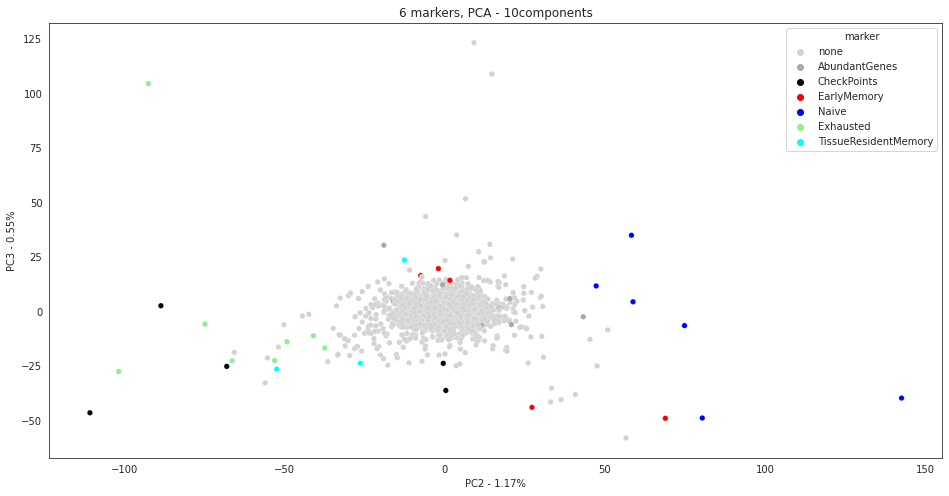

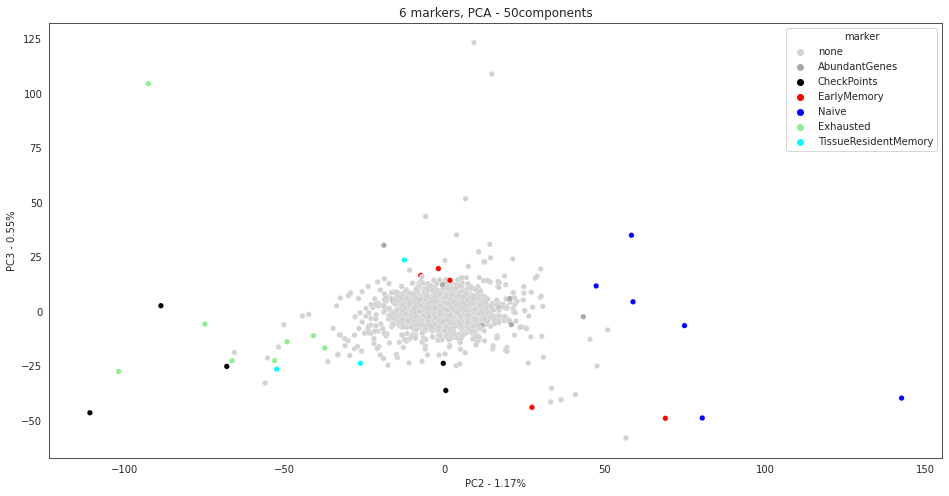

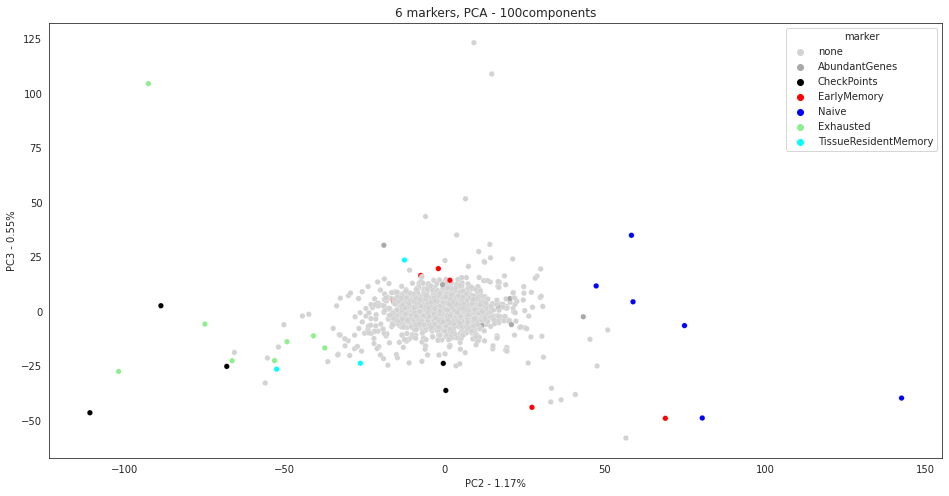

Printing UMAP maps... 
(2339, 2)
(2339, 10) (2339,) (2339,)


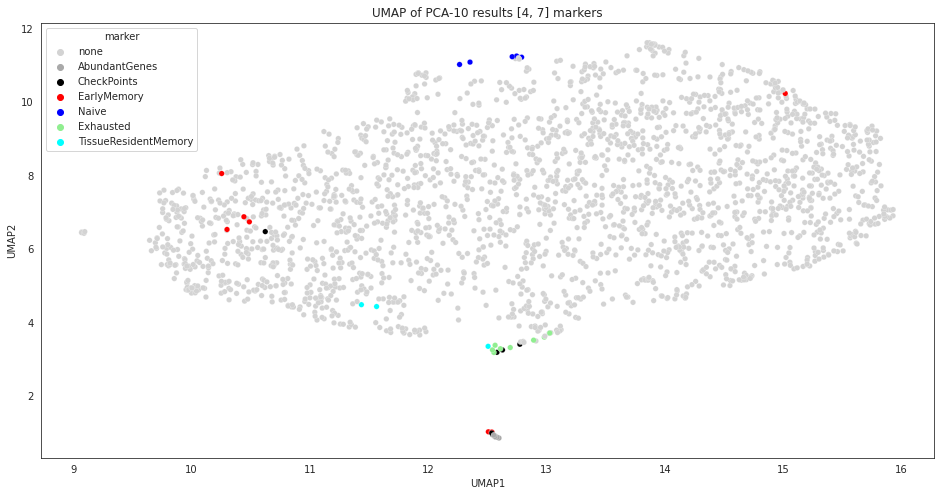

(2339, 2)
(2339, 50) (2339,) (2339,)


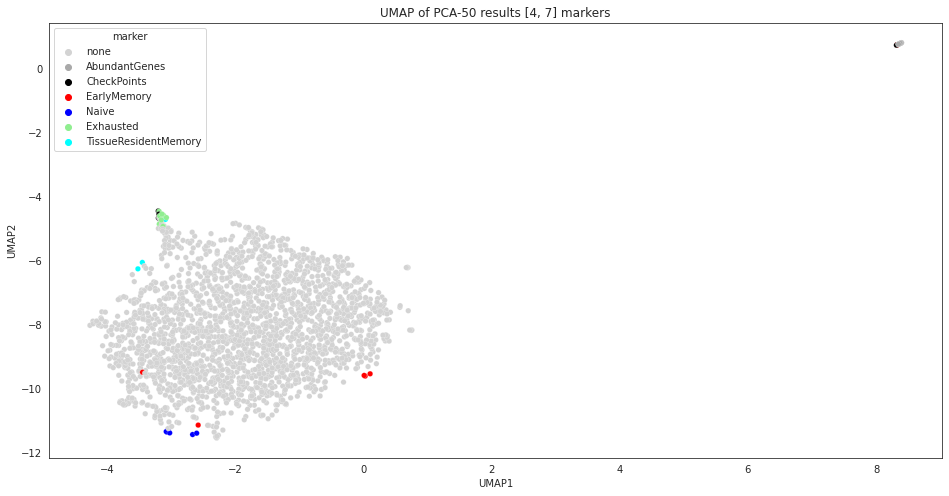

(2339, 2)
(2339, 100) (2339,) (2339,)


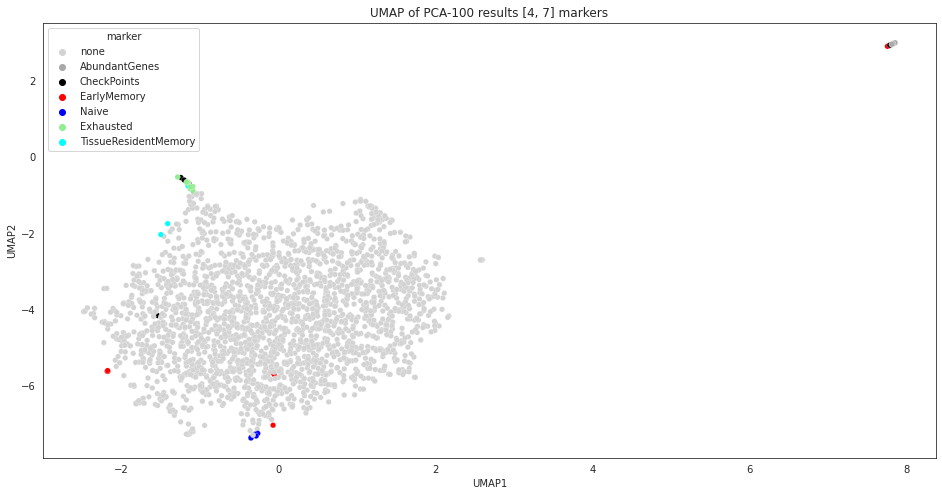

Running the Neural Network on the same params
Shape of the dataset for the modelling: (2339, 1634)
Shape of the train set: (2105, 1634), shape of the validation set (234, 1634)
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=1634, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=10, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=10, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
        (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)

 67%|██████▋   | 10/15 [00:06<00:03,  1.48it/s]

Epoch 10: train loss 6.511409885696447; valid loss 6.670102123521332


100%|██████████| 15/15 [00:10<00:00,  1.49it/s]


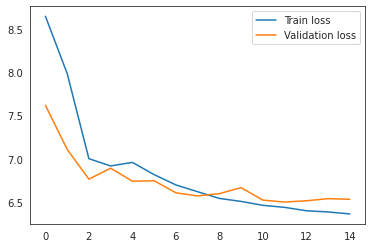

Encoding shape: (2339, 10)
Saving csv file with the results of NN modeling, dimensions 10, markers 6
(2339, 2)
(2339, 10) (2339,) (2339,)


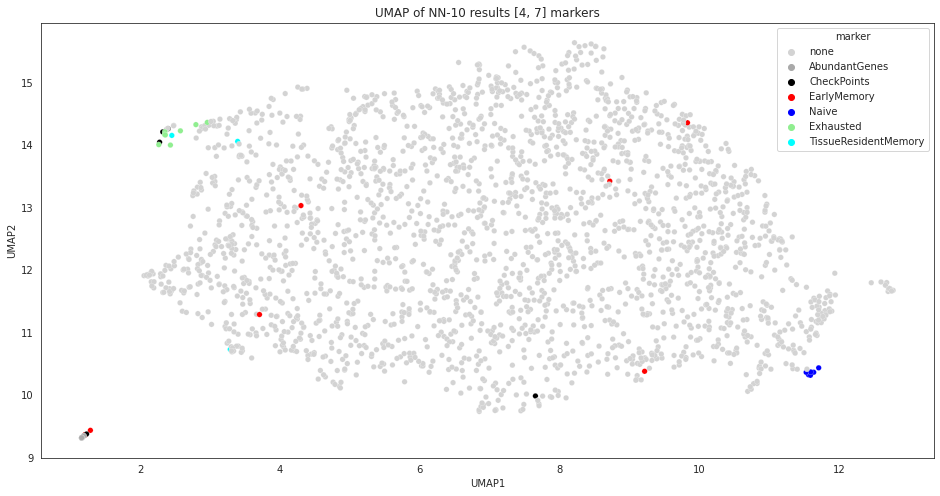

Shape of the dataset for the modelling: (2339, 1634)
Shape of the train set: (2105, 1634), shape of the validation set (234, 1634)
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=1634, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=50, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=50, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
        (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): LinBnDrop(
        (0): Li

 67%|██████▋   | 10/15 [00:06<00:03,  1.45it/s]

Epoch 10: train loss 6.086119534907035; valid loss 6.3985550790770445


100%|██████████| 15/15 [00:10<00:00,  1.45it/s]


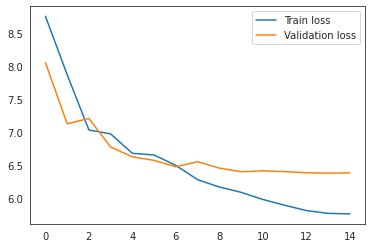

Encoding shape: (2339, 50)
Saving csv file with the results of NN modeling, dimensions 50, markers 6
(2339, 2)
(2339, 50) (2339,) (2339,)


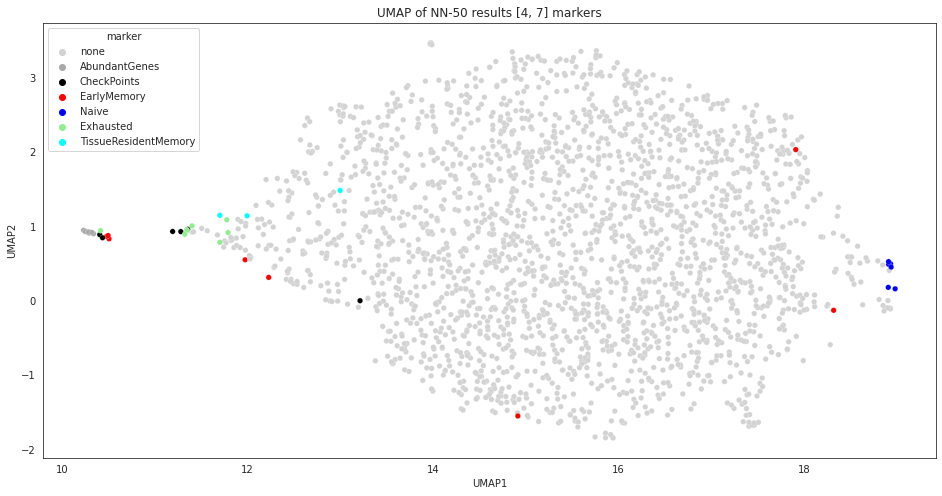

Shape of the dataset for the modelling: (2339, 1634)
Shape of the train set: (2105, 1634), shape of the validation set (234, 1634)
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=1634, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=100, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=100, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
        (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): LinBnDrop(
        (0):

 67%|██████▋   | 10/15 [00:06<00:03,  1.45it/s]

Epoch 10: train loss 5.84904098238911; valid loss 6.362712342514951


100%|██████████| 15/15 [00:10<00:00,  1.44it/s]


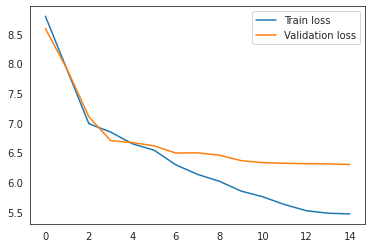

Encoding shape: (2339, 100)
Saving csv file with the results of NN modeling, dimensions 100, markers 6
(2339, 2)
(2339, 100) (2339,) (2339,)


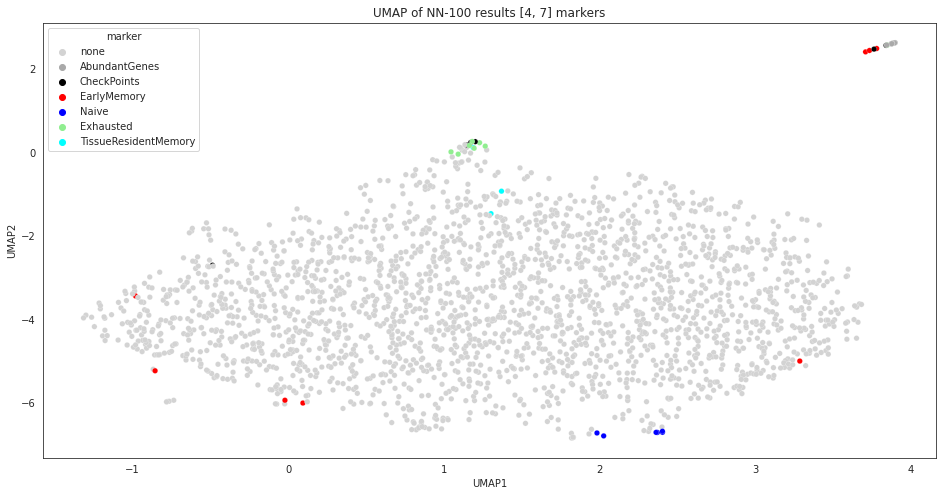

Dataset hepa. 
Running data preparation for 7 markers
Index(['symbol', 'PTC141-0205', 'PTC142-0205', 'PTC143-0205', 'PTC144-0205'], dtype='object')
hepa  data shape: (23459, 1634)
************************************************
Filtering Mitochondrial and Mirna genes..
************************************************
The total number of genes filtered out by R[NUP] :  343
The total number of genes filtered out by MIR :  1258
The total number of genes filtered out by MT :  93
Final dataset shape:  (21765, 1634)
************************************************
************************************************
Total number of markers used 49
Adding markers...
************************************************
Found gene that was absent. Adding it... RPL19
Total number of markers 49
Total number of markers added 1
************************************************
************************************************
Total markers for key Naive is: 6
Total markers for key EarlyMemory is: 7
Total ma

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



variance tables shape (21766, 1)
x_labels (21766,)
x_labels index RangeIndex(start=0, stop=21766, step=1)
genes_var index RangeIndex(start=0, stop=21766, step=1)
difference in indexes []
(21766, 1636)
variance tables shape (21766, 3)
variance table          Var      Mean       Std  gene
0   4.353872  1.017162  2.086594  A1BG
1   0.028723  0.008228  0.169480  NAT2
2  16.058928  2.710675  4.007359   ADA
3   0.127201  0.026224  0.356653  CDH2
4   3.656464  0.732555  1.912188  AKT3
variance tables shape (21766, 4)
************************************************
Training set shape (2308, 1636)
Adding markers (check if they were deleted)
************************************************
Found gene that was absent. Adding it... TCF7
Found gene that was absent. Adding it... IL7R
Found gene that was absent. Adding it... SELL
Found gene that was absent. Adding it... LTB
Found gene that was absent. Adding it... GZMK
Found gene that was absent. Adding it... SH2D1A
Found gene that was absent. Addin

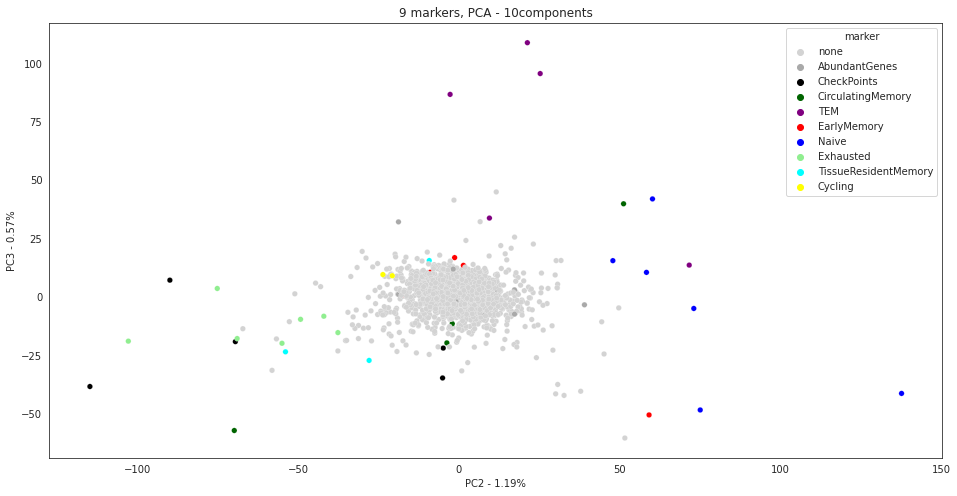

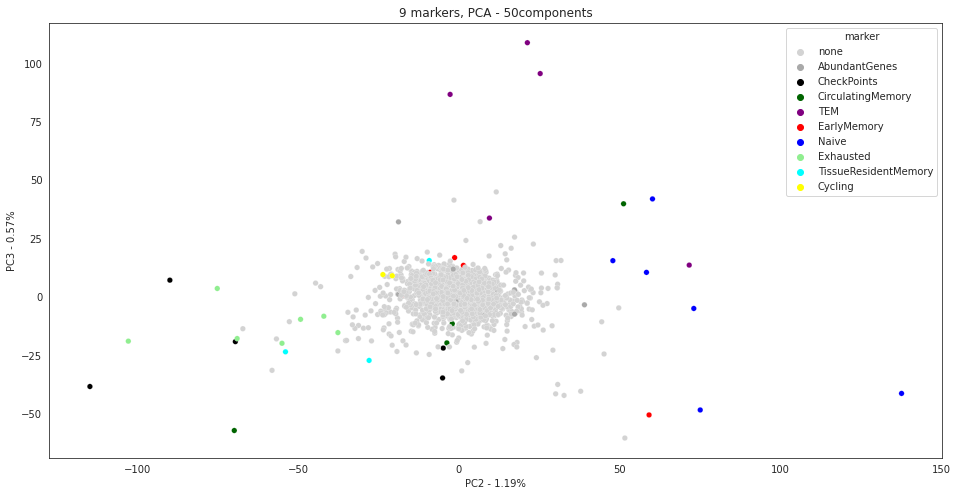

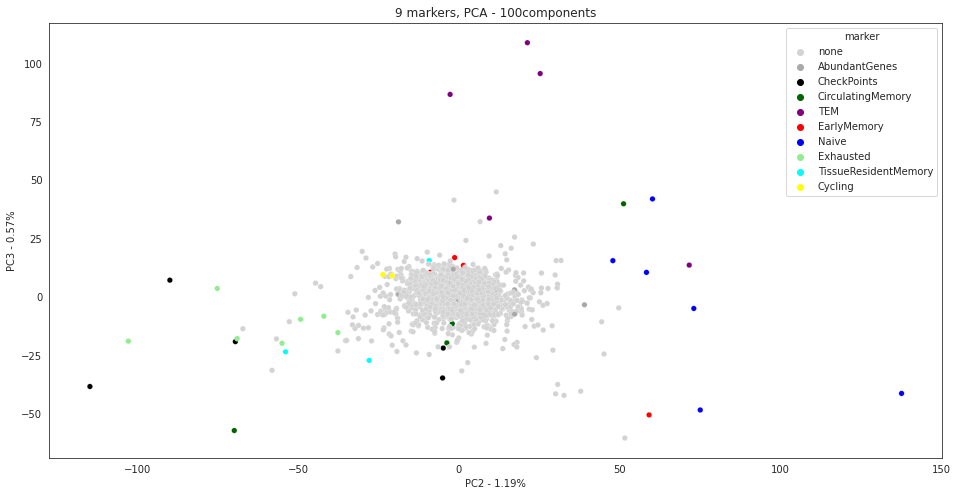

Printing UMAP maps... 
(2346, 2)
(2346, 10) (2346,) (2346,)


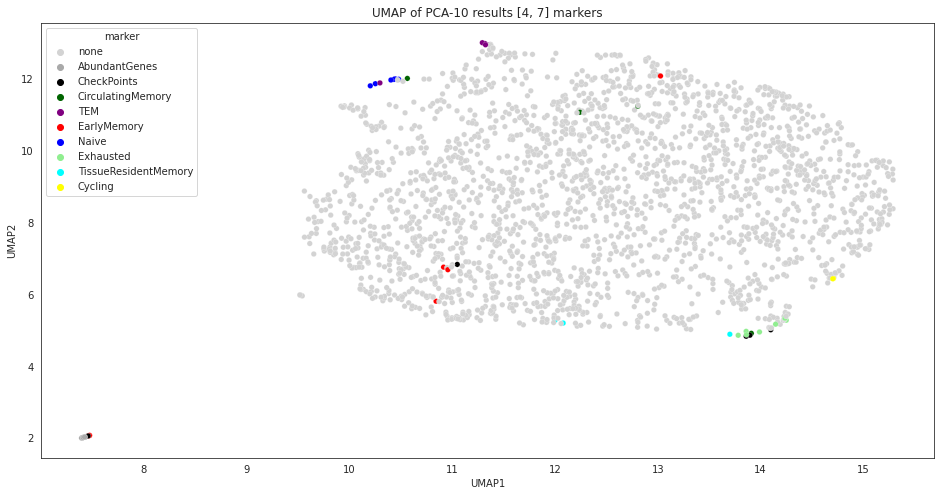

(2346, 2)
(2346, 50) (2346,) (2346,)


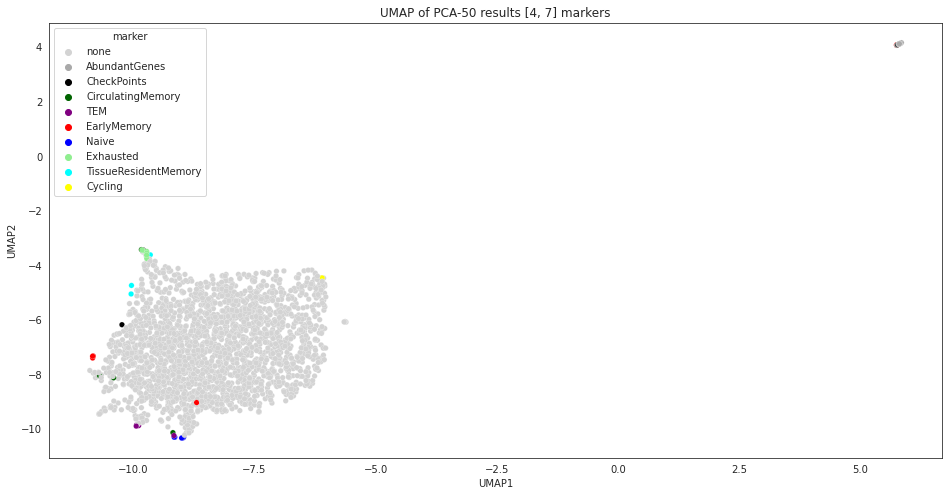

(2346, 2)
(2346, 100) (2346,) (2346,)


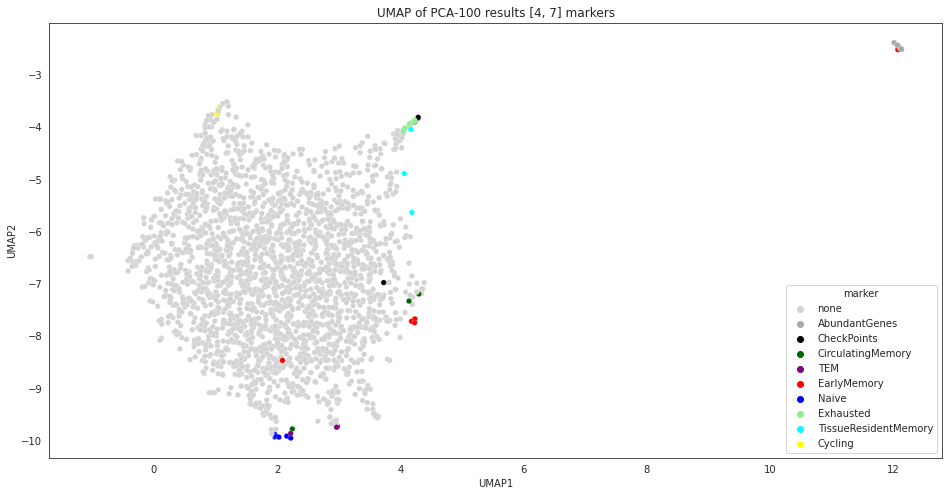

Running the Neural Network on the same params
Shape of the dataset for the modelling: (2346, 1634)
Shape of the train set: (2111, 1634), shape of the validation set (235, 1634)
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=1634, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=10, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=10, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
        (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)

 67%|██████▋   | 10/15 [00:06<00:03,  1.46it/s]

Epoch 10: train loss 6.486298832832383; valid loss 6.473961767237237


100%|██████████| 15/15 [00:10<00:00,  1.45it/s]


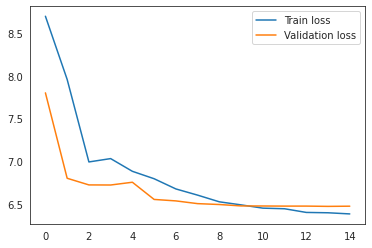

Encoding shape: (2346, 10)
Saving csv file with the results of NN modeling, dimensions 10, markers 9
(2346, 2)
(2346, 10) (2346,) (2346,)


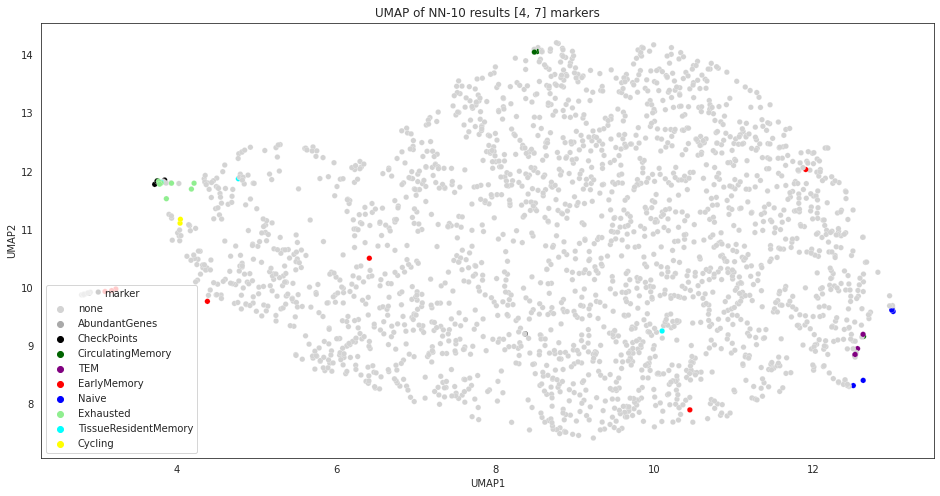

Shape of the dataset for the modelling: (2346, 1634)
Shape of the train set: (2111, 1634), shape of the validation set (235, 1634)
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=1634, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=50, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=50, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
        (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): LinBnDrop(
        (0): Li

 67%|██████▋   | 10/15 [00:07<00:03,  1.41it/s]

Epoch 10: train loss 6.0982247745183225; valid loss 6.402417140311383


100%|██████████| 15/15 [00:10<00:00,  1.41it/s]


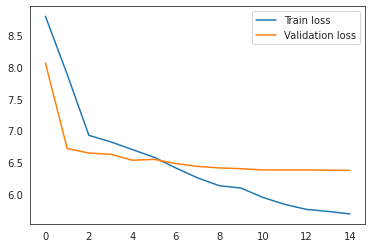

Encoding shape: (2346, 50)
Saving csv file with the results of NN modeling, dimensions 50, markers 9
(2346, 2)
(2346, 50) (2346,) (2346,)


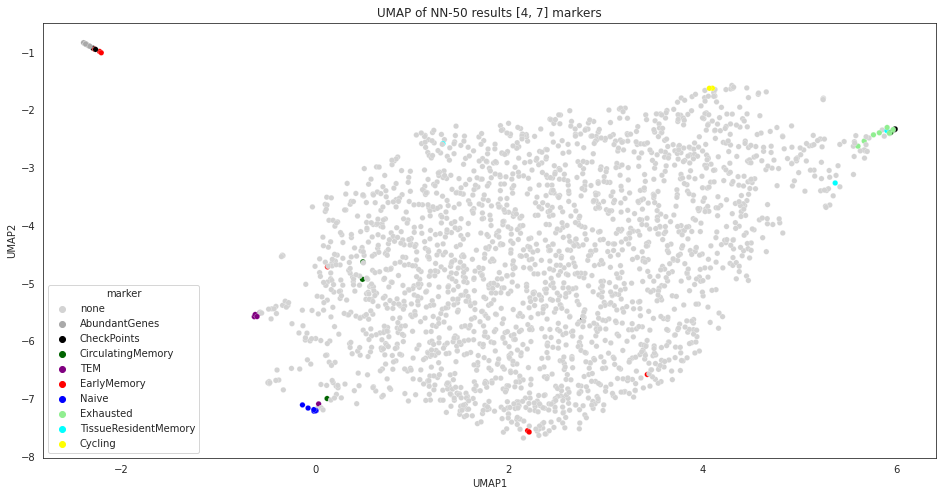

Shape of the dataset for the modelling: (2346, 1634)
Shape of the train set: (2111, 1634), shape of the validation set (235, 1634)
CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=1634, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=100, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=100, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
        (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): LinBnDrop(
        (0):

 67%|██████▋   | 10/15 [00:07<00:03,  1.41it/s]

Epoch 10: train loss 5.824268925195619; valid loss 6.304951195006675


100%|██████████| 15/15 [00:10<00:00,  1.40it/s]


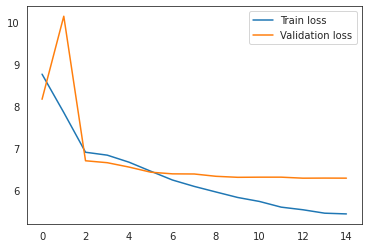

Encoding shape: (2346, 100)
Saving csv file with the results of NN modeling, dimensions 100, markers 9
(2346, 2)
(2346, 100) (2346,) (2346,)


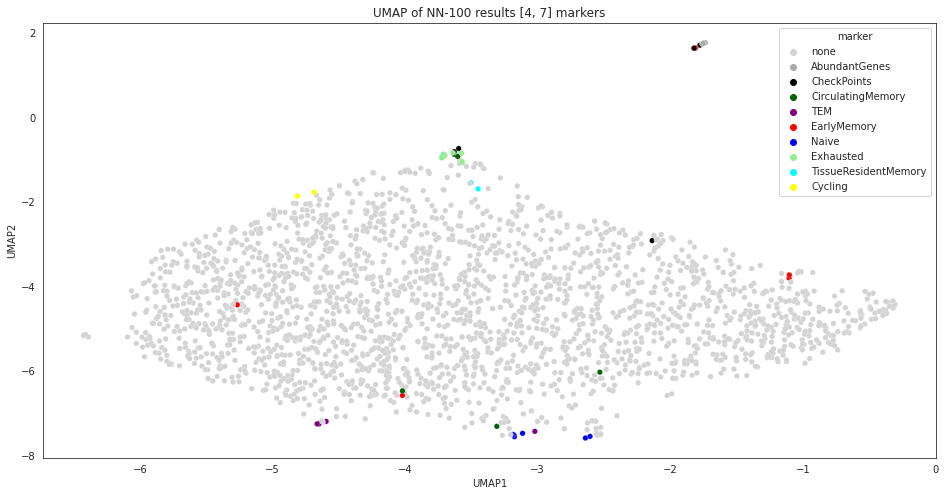

In [ ]:
num_markers = [4, 7]
print('Datasets: 0 - NSCLC, 1- CRC1, 2- CRC2, 3- HEPA, 4-MELANOMA')
index_dataset = int(input('Input the index of the dataset you are interested in: '))
n = int(input('Input how many different dimensions you want to check for PCA and NN (1, 2, 3, 4, 5?): '))
dims=np.zeros(n, dtype=int)
for i in range(n):
  dims[i]=int(input(f'Input the number of dimensions for the {i+1} run (10-50-100?): '))
print(f'So, the following dimensions will be checked: ', dims)

main_markers = ['EarlyMemory', 'Exhausted','Naive','TissueResidentMemory']
check_points = ['CheckPoints']
markers_check = ['AbundantGenes']

thresholds={'NSCLC':[0.71, 2.1], 'crc1':[0.71, 2.1], 'crc2':[0.8, 1.9], 
            'hepa':[0.849, 1.9], 'mel' :[0.71, 2.1]}
datasets = ['NSCLC', 'crc1', 'crc2', 'hepa', 'mel']
dataset_name = datasets[index_dataset]
home_path = '/content/gdrive/MyDrive/CPP_data/'

path_dataset = '/content/gdrive/MyDrive/CPP_data/data_' + datasets[index_dataset] + '_filtered.gzip'
path_labels = '/content/gdrive/MyDrive/CPP_data/labels_' + datasets[index_dataset]

    #cell_name_to_filter = 'TTC'  #dataset is filtered already
    #NSCLC thresholds 1.2998407729691086/0.7345407510056047 = 1.76
    #CRC2 thresholds 1.346980341580908/0.8146161428779355 = 1.65
    #hepa thresholds 1.3892587059716444 / 0.8494661794810161 = 1.63


for marker in num_markers:
    if marker == 4:
      color_marker = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
                            'EarlyMemory': 'red', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
      markers = markers_four
    else:                        
      color_marker = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
                            'EarlyMemory': 'red','TEM': 'purple','CirculatingMemory': 'darkgreen',
                            'Cycling': 'yellow', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
      markers = markers_last
    pipeline_run()


### Running the code for NSCLC dataset (4 markers)

In [ ]:
!ls

 copy			     labels_CRC2.csv
 crc1.parquet.gzip	     labels_hepa.csv
 crc2.parquet.gzip	     labels_NSCLC
 data			     labels_NSCLC.csv
 Embedding_preparing.ipynb   NSCLC_filtered.gzip
 labels			     Pipeline_CPG_full_copy.ipynb
'labels_CRC1 (1).csv'	     po_pourri
 labels_CRC1.csv	     Shared_Pipeline_CPG_ipynb_2.ipynb
'labels_CRC2 (1).csv'	     Shared_Pipeline_CPG_ipynb_.ipynb


In [ ]:
home_path = '/content/gdrive/MyDrive/CPP_data/'
path_dataset = '/content/gdrive/MyDrive/CPP_data/NSCLC.parquet.gzip'
path_labels = '/content/gdrive/MyDrive/CPP_data/labels_NSCLC'
dataset_name = 'NSCLC'

home_path = '/content/gdrive/MyDrive/CPP_data/'
path_dataset = '/content/gdrive/MyDrive/CPP_data/crc2.parquet.gzip'
path_labels = '/content/gdrive/MyDrive/CPP_data/labels_CRC2.csv'
dataset_name = 'CRC2'

# home_path = '/content/gdrive/MyDrive/CPP_data/'
# path_dataset = '/content/gdrive/MyDrive/CPP_data/crc2.parquet.gzip'
# path_labels = '/content/gdrive/MyDrive/CPP_data/labels_CRC2'
# dataset_name = 'CRC2'

cell_name_to_filter = 'TTC'
main_markers = ['EarlyMemory', 'Exhausted','Naive','TissueResidentMemory']
check_points = ['CheckPoints']
markers_check = ['AbundantGenes']
color_marker_four = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
                        'EarlyMemory': 'red', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
markers = markers_four
# dataset_filtered = prepare_dataset(home_path, path_dataset, path_labels, dataset_name, cell_name_to_filter, markers)
dataset_filtered = prepare_dataset(home_path, path_dataset, path_labels, dataset_name, markers, cell_name_to_filter, filter_mit=True)


Index(['GENE', 'N_T_P0104_00001', 'N_T_P0104_00002', 'N_T_P0104_00003',
       'N_T_P0104_00004'],
      dtype='object')
CRC2  data shape: (15179, 10469)
CRC2  labels shape: (10803, 2)
CD4             6258
CD8             3707
UnknownTCell     838
Name: 1, dtype: int64
Dataset filtered by cells needed ( TTC ), final shape: (15179, 2)
************************************************
Filtering Mitochondrial and Mirna genes..
************************************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: FutureWarning: In a future version of pandas all arguments of read_csv except for the argument 'filepath_or_buffer' will be keyword-only


AttributeError: ignored

In [ ]:
# from google.colab import files
# dataset_filtered.to_csv('NSCLC_filtered.csv')

In [ ]:
from google.colab import files

dataset_filtered.to_csv('crc2_filtered.gzip')

In [ ]:
dataset_filtered

,gene,TTY9-20171219,marker
0,A1BG,0.00,none
1,NAT2,0.00,none
2,ADA,0.00,none
3,CDH2,0.00,none
4,AKT3,0.00,none
...,...,...,...
23454,PTBP3,0.00,none
23455,KCNE2,0.00,none
23456,DGCR2,77.06,none
23457,CASP8AP2,0.00,none


In [ ]:
#preparing data for PCA
training_set, _ = prep_data_PCA(home_path, path_dataset, dataset_name, markers, 0.72, 2.1)

Dataset shape:  (21766, 2185)
x_labels shape (21766,) x_markers shape (21766,)
Markers values: 
 none                    21726
AbundantGenes               9
EarlyMemory                 8
Exhausted                   8
CheckPoints                 6
Naive                       6
TissueResidentMemory        3
Name: marker, dtype: int64
X for PCA shape:  (21766, 2185)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  


variance tables shape (21766, 1)
x_labels (21766,)
x_labels index RangeIndex(start=0, stop=21766, step=1)
genes_var index RangeIndex(start=0, stop=21766, step=1)
difference in indexes []
(21766, 2185)
variance tables shape (21766, 3)
variance table          Var      Mean       Std  gene
0   3.534065  0.839759  1.879911  A1BG
1   0.045334  0.008948  0.212918  NAT2
2  14.288587  2.343138  3.780025   ADA
3   0.003878  0.002864  0.062271  CDH2
4   3.796691  0.731008  1.948510  AKT3
variance tables shape (21766, 4)
************************************************
Training set shape (2233, 2185)
Adding markers (check if they were deleted)
************************************************
Found gene that was absent. Adding it... TCF7
Found gene that was absent. Adding it... IL7R
Found gene that was absent. Adding it... CCR7
Found gene that was absent. Adding it... SELL
Found gene that was absent. Adding it... LTB
Found gene that was absent. Adding it... GZMK
Found gene that was absent. Adding 

####PCA 10&100

In [ ]:
pca_df10, var_pc10 = running_PCA(training_set, home_path)


markers check: 
 none                    2228
AbundantGenes              9
EarlyMemory                8
Exhausted                  8
CheckPoints                6
Naive                      6
TissueResidentMemory       3
Name: marker, dtype: int64
X_train shape:  (2268, 2182)
************************************************
Principal Component Analysis (PCA)
explained var by components [0.07777 0.0093  0.00574 0.00435 0.00391 0.00312 0.00304 0.00255 0.00233
 0.00215]


In [ ]:
pca_df100, var_pc100 = running_PCA(training_set, home_path, 100)

markers check: 
 none                    2228
AbundantGenes              9
EarlyMemory                8
Exhausted                  8
CheckPoints                6
Naive                      6
TissueResidentMemory       3
Name: marker, dtype: int64
X_train shape:  (2268, 2182)
************************************************
Principal Component Analysis (PCA)
explained var by components [0.07777 0.0093  0.00574 0.00435 0.00391 0.00312 0.00304 0.00256 0.00236
 0.0022  0.00218 0.00213 0.00208 0.00203 0.00198 0.00195 0.00191 0.00186
 0.00183 0.00182 0.00181 0.0018  0.00179 0.00177 0.00176 0.00176 0.00174
 0.00174 0.00173 0.00172 0.00171 0.00169 0.00169 0.00168 0.00167 0.00166
 0.00165 0.00165 0.00165 0.00164 0.00163 0.00163 0.00162 0.00161 0.0016
 0.0016  0.00159 0.00157 0.00157 0.00157 0.00156 0.00155 0.00155 0.00155
 0.00154 0.00154 0.00154 0.00152 0.00152 0.00151 0.00151 0.0015  0.0015
 0.00149 0.00149 0.00148 0.00148 0.00147 0.00146 0.00146 0.00146 0.00145
 0.00145 0.00144 0.00144 0.001

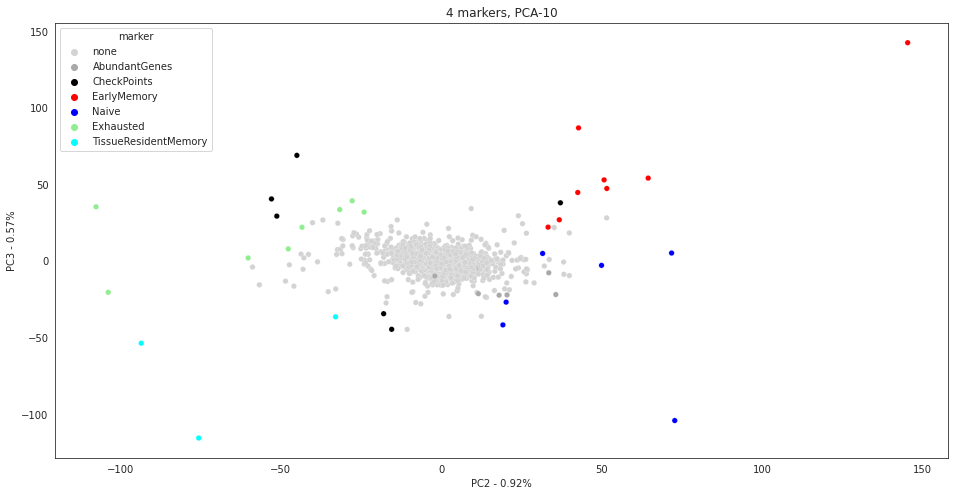

In [ ]:
plotting_res_sns(pca_df10, var_pc10, 'PC2', 'PC3',color_marker_four, '4 markers, PCA-10')


In [ ]:
plotting_res_plotly(pca_df10, var_pc10, 'PC2', 'PC3',color_marker_four, '4 markers, PCA-10')

In [ ]:
plotting_res_plotly(pca_df100, var_pc100, 'PC2', 'PC3',color_marker_four, '4 markers, PCA-100')

#### UMAP

In [ ]:
embedding10 = umap.UMAP(random_state=0).fit_transform(pca_df10[pca_df10.columns[:-2]])
embedding100 = umap.UMAP(random_state=0).fit_transform(pca_df100[pca_df100.columns[:-2]])

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning:

The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.



In [ ]:
embedding10.shape, embedding100.shape

((2268, 2), (2268, 2))

In [ ]:
plot_emb_res10=pd.concat([pca_df10['gene'], pca_df10['marker']], axis=1)
plot_emb_res10["UMAP1"] = embedding10[:, 0]
plot_emb_res10["UMAP2"] = embedding10[:, 1]
plot_emb_res10.head()

,gene,marker,UMAP1,UMAP2
0,A1BG,none,13.128466,10.576670
1,AKT3,none,12.943156,11.669693
2,RPL19,AbundantGenes,7.661967,4.460811
3,ACOT8,none,13.189438,7.309761
4,GNPDA1,none,11.076067,10.295916


In [ ]:
plot_emb_res100=pd.concat([pca_df100['gene'], pca_df100['marker']], axis=1)
plot_emb_res100["UMAP1"] = embedding100[:, 0]
plot_emb_res100["UMAP2"] = embedding100[:, 1]
plot_emb_res100.head()

,gene,marker,UMAP1,UMAP2
0,A1BG,none,-1.703415,-4.040917
1,AKT3,none,-1.925980,-4.684538
2,RPL19,AbundantGenes,1.889678,0.940963
3,ACOT8,none,-4.060177,-3.017138
4,GNPDA1,none,-1.233341,-3.796234


In [ ]:
fig = px.scatter(plot_emb_res10, x="UMAP1", y="UMAP2", color="marker",
                 color_discrete_map = color_marker_four,
                 hover_name='gene',
                 title = 'UMAP of PCA-10 results 4 markers, ')
                 #color_discrete_sequence=['lightgray','darkgray', 'black',  'darkgreen', 'purple',  'red',  'blue', 'lightgreen','cyan', 'yellow'])
fig.show()

In [ ]:
fig = px.scatter(plot_emb_res100, x="UMAP1", y="UMAP2", color="marker",
                 color_discrete_map = color_marker_four,
                 hover_name='gene',
                 title = 'UMAP of PCA-100 results 4 markers, ')
                 #color_discrete_sequence=['lightgray','darkgray', 'black',  'darkgreen', 'purple',  'red',  'blue', 'lightgreen','cyan', 'yellow'])
fig.show()

####UMAP on the whole dataset

In [ ]:
training_set

,TTC100-0616A,TTC10-0616A,TTC101-0616A,TTC102-0616A,TTC103-0616A,TTC104-0616A,TTC1-0616A,TTC107-0616A,TTC108-0616A,TTC109-0616A,...,TTC6-20171219,TTC62-20171219,TTC63-20171219,TTC64-20171219,TTC7-20171219,TTC8-20171219,TTC9-20171219,TTY9-20171219,gene,marker
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,2.813525,0.000000,0.799087,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,A1BG,none
4,0.000000,0.000000,0.000000,0.000000,0.464668,0.00000,6.502394,5.910972,0.000000,6.868884,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,AKT3,none
23,10.407130,10.234698,11.062262,11.391432,10.237568,11.32721,10.568716,9.315399,10.392210,11.916607,...,6.102868,2.715893,11.690190,2.545968,13.781959,11.913061,11.25836,10.732159,RPL19,AbundantGenes
73,0.000000,0.555816,0.000000,0.000000,2.163499,0.00000,0.757023,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,8.732778,ACOT8,none
75,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.748461,1.056584,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,GNPDA1,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21753,0.000000,0.000000,5.009437,0.000000,0.000000,0.00000,8.826390,0.000000,5.726286,0.000000,...,0.000000,0.687061,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,THOC1,none
21754,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,REC8,none
21755,0.000000,0.000000,0.000000,0.000000,4.882154,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,RCE1,none
21763,0.000000,9.274122,0.863938,0.000000,0.000000,0.00000,9.409624,0.773996,0.000000,0.000000,...,0.000000,0.505891,9.458878,0.443607,0.000000,7.995202,0.00000,6.286512,DGCR2,none


In [ ]:
embedding3 = umap.UMAP(random_state=0).fit_transform(training_set[training_set.columns[:-2]])

In [ ]:
embedding3.shape

(2740, 2)

In [ ]:
plot_emb_res3=pd.concat([training_set['gene'], training_set['marker']], axis=1)
plot_emb_res3["UMAP1"] = embedding3[:, 0]
plot_emb_res3["UMAP2"] = embedding3[:, 1]
plot_emb_res3.head()

,gene,marker,UMAP1,UMAP2
0,A1BG,none,-2.045308,-1.440314
4,AKT3,none,-2.336025,-1.363317
23,RPL19,AbundantGenes,8.309440,-0.889114
73,ACOT8,none,-1.935111,1.048783
75,GNPDA1,none,0.944512,-1.226998


In [ ]:
fig = px.scatter(plot_emb_res3, x="UMAP1", y="UMAP2", color="marker",
                 hover_name='gene',
                 color_discrete_map=color_marker_four, title='UMAP of the whole dataset (no PCA)')
fig.show()

### Running the code for NSCLC dataset (7 markers)

In [ ]:
home_path = '/content/gdrive/MyDrive/CPP_data/'
path_dataset = '/content/gdrive/MyDrive/CPP_data/NSCLC.parquet.gzip'
path_labels = '/content/gdrive/MyDrive/CPP_data/labels_NSCLC'
dataset_name = 'NSCLC'
cell_name_to_filter = 'TTC'
main_markers = ['EarlyMemory', 'Exhausted','Naive', 'TEM', 'CirculatingMemory', 'TissueResidentMemory', 'Cycling']
check_points = ['CheckPoints']
markers_check = ['AbundantGenes']
color_marker = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
                        'EarlyMemory': 'red','TEM': 'purple','CirculatingMemory': 'darkgreen',
                        'Cycling': 'yellow', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
markers = markers_last
# dataset_filtered = prepare_dataset(home_path, path_dataset, path_labels, dataset_name, cell_name_to_filter, markers)
dataset_filtered = prepare_dataset(home_path, path_dataset, path_labels, dataset_name, markers, cell_name_to_filter, filter_mit)


Index(['symbol', 'NTH10-0616A', 'NTH11-0616A', 'NTH15-0616A', 'NTH17-0616A'], dtype='object')
NSCLC  data shape: (23459, 12347)
NSCLC  labels shape: (12346, 2)
TTC      2182
TTH      1591
PTC      1323
PTH      1254
TTR      1100
NTC       934
TTY       892
PTR       849
PTY       672
NTH       655
NTY       238
PTS       162
NTR       149
NTS       139
T-CD4     136
TTS        70
Name: 1, dtype: int64
Dataset filtered by cells needed ( {'Naive': ['TCF7', 'IL7R', 'CCR7', 'SELL', 'LEF1', 'LTB'], 'EarlyMemory': ['GZMK', 'SH2D1A', 'EOMES', 'DTHD1', 'SLAMF7', 'FCRL3', 'CXCR5'], 'Exhausted': ['HAVCR2', 'ENTPD1', 'LAYN', 'CD38', 'VCAM1', 'TOX', 'LAG3'], 'TissueResidentMemory': ['ITGAE', 'ZNF683', 'ITGA1'], 'TEM': ['FCGR3A', 'FGFBP2', 'CX3CR1', 'LILRB1', 'SORL1'], 'Cycling': ['TOP2A', 'MKI67'], 'CirculatingMemory': ['NR4A1', 'NR4A2', 'NR4A3', 'KLF2'], 'AbundantGenes': ['GAPDH', 'RPL19', 'ACTB', 'PTPRC', 'CD3D', 'CD3E', 'CD3G', 'CD8A', 'CD8B'], 'CheckPoints': ['CTLA4', 'PDCD1', 'TIGIT', 'PVRIG

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning: In a future version of pandas all arguments of read_csv except for the argument 'filepath_or_buffer' will be keyword-only
  del sys.path[0]


The total number of genes filtered out by MT :  93
Final dataset shape:  (21765, 2)
************************************************
************************************************
TTC


AttributeError: ignored

 copy					      Hepatocellular_carcinoma.csv
'Copy2 of Shared_Pipeline_CPG_ipynb_.ipynb'   Intro_pres.pptx
'Copy of Intro_pres1.1.gslides'		      labels
'Copy of Intro_pres1.1.pptx'		      labels_CRC1.csv
'Copy of Shared_Pipeline_CPG_ipynb_.ipynb'    labels_CRC2.csv
 cpgnen1.2.ipynb			      labels_hepa.csv
 CRC1.csv				      labels_NSCLC.csv
 crc1.parquet.gzip			      Melanoma.csv
 CRC2.csv				      NSCLC.csv
 crc2.parquet.gzip			      NSCLCfiltered_markers.gzip
 data					      NSCLC.parquet.gzip
 data_NSCLC_filtered.gzip		      Pipeline_CPG_full_copy.ipynb
 Embedding_preparing.ipynb		      Shared_Pipeline_CPG_ipynb_2.ipynb
 hepa.parquet.gzip			      Shared_Pipeline_CPG_ipynb_.ipynb


In [ ]:
dataset_filtered

,gene,TTC100-0616A,TTC10-0616A,TTC101-0616A,TTC102-0616A,TTC103-0616A,TTC104-0616A,TTC1-0616A,TTC107-0616A,TTC108-0616A,...,TTC61-20171219,TTC6-20171219,TTC62-20171219,TTC63-20171219,TTC64-20171219,TTC7-20171219,TTC8-20171219,TTC9-20171219,TTY9-20171219,marker
0,A1BG,0.0,0.00,0.00,0.00,0.00,0.00,6.03,0.00,0.74,...,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,none
1,NAT2,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,1.35,0.0,0.00,0.00,0.00,none
2,ADA,0.0,0.00,5.20,1142.74,1.82,438.12,0.00,0.00,1.94,...,0.00,0.00,0.00,8041.18,0.00,0.0,5752.31,1732.26,0.00,none
3,CDH2,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,none
4,AKT3,0.0,0.00,0.00,0.00,0.38,0.00,89.66,59.17,0.00,...,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23454,PTBP3,0.0,72.27,0.97,0.37,201.24,0.42,285.69,0.84,0.00,...,0.00,0.00,0.00,0.00,0.22,0.0,0.00,0.00,0.00,none
23455,KCNE2,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,2.94,0.00,0.00,0.00,0.0,0.00,0.00,0.00,none
23456,DGCR2,0.0,618.14,0.82,0.00,0.00,0.00,679.11,0.71,0.00,...,1130.78,0.00,0.42,702.73,0.36,0.0,254.15,0.00,77.06,none
23457,CASP8AP2,85.1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,690.30,...,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,none


In [ ]:
check_var_thresh(genes_var,0.72, 2.1)
1.2998407729691086/0.7345407510056047

Mean mean value by genes 0.7345407510056047
Mean std value by genes 1.2998407729691086
(2233, 4)


1.7695965420428943

In [ ]:
#preparing data for PCA
training_set, _ = prep_data_PCA(home_path, path_dataset, dataset_name, markers, 0.72, 2.1)

Dataset shape:  (21766, 2185)
x_labels shape (21766,) x_markers shape (21766,)
Markers values: 
 none                    21717
AbundantGenes               9
EarlyMemory                 7
Exhausted                   7
CheckPoints                 6
Naive                       6
TEM                         5
CirculatingMemory           4
TissueResidentMemory        3
Cycling                     2
Name: marker, dtype: int64
X for PCA shape:  (21766, 2185)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



variance tables shape (21766, 1)
x_labels (21766,)
x_labels index RangeIndex(start=0, stop=21766, step=1)
genes_var index RangeIndex(start=0, stop=21766, step=1)
difference in indexes []
(21766, 2185)
variance tables shape (21766, 3)
variance table          Var      Mean       Std  gene
0   3.534065  0.839759  1.879911  A1BG
1   0.045334  0.008948  0.212918  NAT2
2  14.288587  2.343138  3.780025   ADA
3   0.003878  0.002864  0.062271  CDH2
4   3.796691  0.731008  1.948510  AKT3
variance tables shape (21766, 4)
************************************************
Training set shape (2233, 2185)
Adding markers (check if they were deleted)
************************************************
Found gene that was absent. Adding it... TCF7
Found gene that was absent. Adding it... IL7R
Found gene that was absent. Adding it... CCR7
Found gene that was absent. Adding it... SELL
Found gene that was absent. Adding it... LTB
Found gene that was absent. Adding it... GZMK
Found gene that was absent. Adding 

In [ ]:
training_set

,TTC100-0616A,TTC10-0616A,TTC101-0616A,TTC102-0616A,TTC103-0616A,TTC104-0616A,TTC1-0616A,TTC107-0616A,TTC108-0616A,TTC109-0616A,...,TTC6-20171219,TTC62-20171219,TTC63-20171219,TTC64-20171219,TTC7-20171219,TTC8-20171219,TTC9-20171219,TTY9-20171219,gene,marker
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,2.813525,0.000000,0.799087,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,A1BG,none
4,0.000000,0.000000,0.000000,0.000000,0.464668,0.00000,6.502394,5.910972,0.000000,6.868884,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,AKT3,none
29,10.407130,10.234698,11.062262,11.391432,10.237568,11.32721,10.568716,9.315399,10.392210,11.916607,...,6.102868,2.715893,11.690190,2.545968,13.781959,11.913061,11.258360,10.732159,RPL19,AbundantGenes
73,0.000000,0.555816,0.000000,0.000000,2.163499,0.00000,0.757023,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.732778,ACOT8,none
75,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.748461,1.056584,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,GNPDA1,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21725,0.879706,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.495695,0.000000,GOLGA5,none
21754,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,REC8,none
21755,0.000000,0.000000,0.000000,0.000000,4.882154,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,RCE1,none
21763,0.000000,9.274122,0.863938,0.000000,0.000000,0.00000,9.409624,0.773996,0.000000,0.000000,...,0.000000,0.505891,9.458878,0.443607,0.000000,7.995202,0.000000,6.286512,DGCR2,none


####PCA

In [ ]:
pca_df10, var_pc10 = running_PCA(training_set, home_path)

markers check: 
 none                    2223
AbundantGenes              9
EarlyMemory                7
Exhausted                  7
CheckPoints                6
Naive                      6
TEM                        5
CirculatingMemory          4
TissueResidentMemory       3
Cycling                    2
Name: marker, dtype: int64
X_train shape:  (2272, 2182)
************************************************
Principal Component Analysis (PCA)
explained var by components [0.07426 0.00912 0.00575 0.00437 0.00371 0.0031  0.00303 0.00256 0.00234
 0.00216]


In [ ]:
pca_df100, var_pc100 = running_PCA(training_set, home_path, 100)

markers check: 
 none                    2223
AbundantGenes              9
EarlyMemory                7
Exhausted                  7
CheckPoints                6
Naive                      6
TEM                        5
CirculatingMemory          4
TissueResidentMemory       3
Cycling                    2
Name: marker, dtype: int64
X_train shape:  (2272, 2182)
************************************************
Principal Component Analysis (PCA)
explained var by components [0.07426 0.00912 0.00575 0.00437 0.00371 0.0031  0.00304 0.00257 0.00237
 0.00221 0.00219 0.00215 0.00209 0.00204 0.00199 0.00195 0.00188 0.00187
 0.00184 0.00183 0.00181 0.0018  0.00179 0.00178 0.00177 0.00176 0.00175
 0.00174 0.00173 0.00173 0.00172 0.0017  0.00169 0.00169 0.00168 0.00167
 0.00166 0.00166 0.00165 0.00164 0.00164 0.00162 0.00162 0.00161 0.00161
 0.0016  0.00159 0.00158 0.00158 0.00157 0.00157 0.00156 0.00156 0.00155
 0.00154 0.00153 0.00153 0.00153 0.00152 0.00152 0.00152 0.00151 0.0015
 0.0015  0.0014

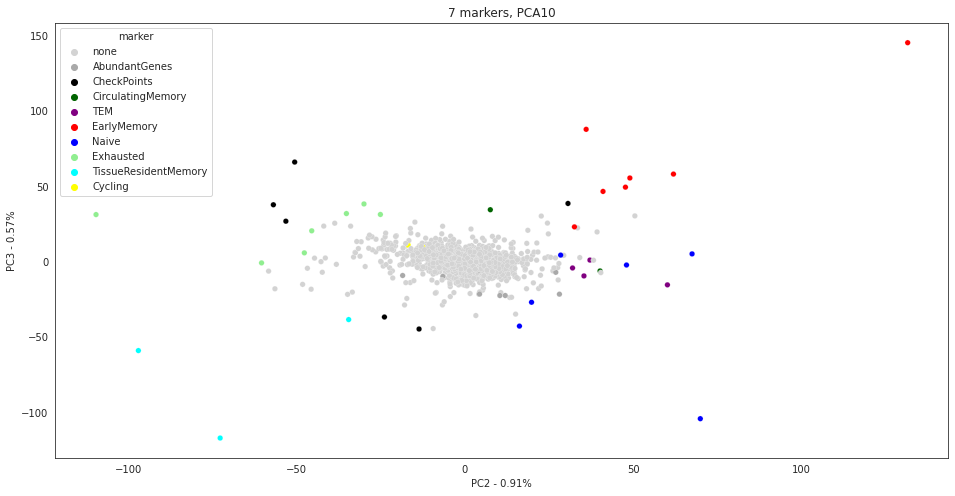

In [ ]:
plotting_res_sns(pca_df100, var_pc100, 'PC2', 'PC3', color_marker, '7 markers, PCA10')

In [ ]:
plotting_res_plotly(pca_df100, var_pc100, 'PC2', 'PC3',color_marker, '7 markers PCA-10')

#### UMAP

In [ ]:
embedding10 = umap.UMAP(random_state=0).fit_transform(pca_df10[pca_df10.columns[:-2]])
embedding100 = umap.UMAP(random_state=0).fit_transform(pca_df100[pca_df100.columns[:-2]])

In [ ]:
plot_emb_res10=pd.concat([pca_df10['gene'], pca_df10['marker']], axis=1)
plot_emb_res10["UMAP1"] = embedding10[:, 0]
plot_emb_res10["UMAP2"] = embedding10[:, 1]
plot_emb_res10.head()

,gene,marker,UMAP1,UMAP2
0,A1BG,none,13.316078,5.947239
1,AKT3,none,14.497807,6.168436
2,RPL19,AbundantGenes,5.382462,7.954266
3,ACOT8,none,11.336948,9.057049
4,GNPDA1,none,11.866939,6.889050


In [ ]:
plot_emb_res100=pd.concat([pca_df100['gene'], pca_df100['marker']], axis=1)
plot_emb_res100["UMAP1"] = embedding100[:, 0]
plot_emb_res100["UMAP2"] = embedding100[:, 1]
plot_emb_res100.head()

,gene,marker,UMAP1,UMAP2
0,A1BG,none,-6.330775,1.265023
1,AKT3,none,-6.409597,2.652514
2,RPL19,AbundantGenes,-0.223108,0.546138
3,ACOT8,none,-3.513971,2.467958
4,GNPDA1,none,-5.567665,4.058728


In [ ]:
fig = px.scatter(plot_emb_res10, x="UMAP1", y="UMAP2", color="marker",
                 color_discrete_map = color_marker,
                 hover_name='gene',
                 title='UMAP of PCA-10 results, 7 markers')
                 #color_discrete_sequence=['lightgray','darkgray', 'black',  'darkgreen', 'purple',  'red',  'blue', 'lightgreen','cyan', 'yellow'])
fig.show()

In [ ]:
fig = px.scatter(plot_emb_res100, x="UMAP1", y="UMAP2", color="marker",
                 color_discrete_map = color_marker,
                 hover_name='gene',
                 title='UMAP of PCA-100 results, 7 markers')
                 #color_discrete_sequence=['lightgray','darkgray', 'black',  'darkgreen', 'purple',  'red',  'blue', 'lightgreen','cyan', 'yellow'])
fig.show()

####UMAP on the whole dataset

In [ ]:
training_set

,TTC100-0616A,TTC10-0616A,TTC101-0616A,TTC102-0616A,TTC103-0616A,TTC104-0616A,TTC1-0616A,TTC107-0616A,TTC108-0616A,TTC109-0616A,...,TTC6-20171219,TTC62-20171219,TTC63-20171219,TTC64-20171219,TTC7-20171219,TTC8-20171219,TTC9-20171219,TTY9-20171219,gene,marker
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,2.813525,0.000000,0.799087,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,A1BG,none
4,0.000000,0.000000,0.000000,0.000000,0.464668,0.00000,6.502394,5.910972,0.000000,6.868884,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,AKT3,none
29,10.407130,10.234698,11.062262,11.391432,10.237568,11.32721,10.568716,9.315399,10.392210,11.916607,...,6.102868,2.715893,11.690190,2.545968,13.781959,11.913061,11.25836,10.732159,RPL19,AbundantGenes
73,0.000000,0.555816,0.000000,0.000000,2.163499,0.00000,0.757023,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,8.732778,ACOT8,none
75,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.748461,1.056584,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,GNPDA1,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21753,0.000000,0.000000,5.009437,0.000000,0.000000,0.00000,8.826390,0.000000,5.726286,0.000000,...,0.000000,0.687061,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,THOC1,none
21754,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,REC8,none
21755,0.000000,0.000000,0.000000,0.000000,4.882154,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,RCE1,none
21763,0.000000,9.274122,0.863938,0.000000,0.000000,0.00000,9.409624,0.773996,0.000000,0.000000,...,0.000000,0.505891,9.458878,0.443607,0.000000,7.995202,0.00000,6.286512,DGCR2,none


In [ ]:
embedding3 = umap.UMAP(random_state=0).fit_transform(training_set[training_set.columns[:-2]])

In [ ]:
embedding3.shape

(2744, 2)

In [ ]:
plot_emb_res3=pd.concat([training_set['gene'], training_set['marker']], axis=1)
plot_emb_res3["UMAP1"] = embedding3[:, 0]
plot_emb_res3["UMAP2"] = embedding3[:, 1]
plot_emb_res3.head()

,gene,marker,UMAP1,UMAP2
0,A1BG,none,-0.499882,-2.574807
4,AKT3,none,0.574559,-2.770921
29,RPL19,AbundantGenes,4.966339,1.392047
73,ACOT8,none,1.772260,-1.625937
75,GNPDA1,none,0.388469,-1.239413


In [ ]:
fig = px.scatter(plot_emb_res3, x="UMAP1", y="UMAP2", color="marker",
                 color_discrete_map=color_marker,
                 hover_name='gene',
                 title = 'UMAP of the whole dataset')
fig.show()

### Running the code for CRC2 dataset (GSE108989) 4 markers

In [ ]:
home_path = '/content/gdrive/MyDrive/CPP_data/'
path_dataset = '/content/gdrive/MyDrive/CPP_data/crc2.parquet.gzip'
path_labels = '/content/gdrive/MyDrive/CPP_data/labels_crc2'
dataset_name = 'crc2'
cell_name_to_filter = 'CD8'
main_markers = ['EarlyMemory', 'Exhausted','Naive','TissueResidentMemory']
check_points = ['CheckPoints']
markers_check = ['AbundantGenes']
color_marker_four = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
                        'EarlyMemory': 'red', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
markers = markers_four
dataset_filtered_crc2 = prepare_dataset(home_path, path_dataset, path_labels, dataset_name, cell_name_to_filter, markers)

(23459, 1634)

In [ ]:
dataset_filtered_crc2

,gene,NTC100-20180123,NTC101-20180123,NTC102-20180123,NTC103-20180123,NTC105-20180123,NTC106-20180123,NTC107-20180123,NTC108-20180123,NTC110-20180123,...,PTC8-20161228,PTC82-20161228,PTC85-20161228,PTC90-20161228,PTC91-20161228,PTC9-20161228,PTC92-20161228,PTC94-20161228,PTC96-20161228,marker
0,A1BG,0.000000,0.00000,0.000000,0.000000,0.000000,37.425026,0.0,0.000000,0.000000,...,6.842114,0.0,0.000000,0.000000,0.000000,9.164084,7.891868,15.595108,0.000000,none
1,NAT2,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,none
2,ADA,728.524096,0.00000,0.000000,0.000000,1559.820252,0.000000,0.0,12.620134,486.322514,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,1291.344327,0.000000,0.000000,none
3,CDH2,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,39.678365,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,none
4,AKT3,0.000000,0.00000,0.377184,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,161.323445,0.000000,0.000000,0.000000,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23454,PTBP3,0.000000,0.85674,255.570818,0.000000,0.000000,0.000000,0.0,0.000000,240.034214,...,25.515314,0.0,0.582559,2.332675,0.672473,0.000000,224.343542,241.343082,66.739146,none
23455,KCNE2,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,none
23456,DGCR2,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.000000,2.622866,0.000000,0.000000,0.813718,0.000000,105.527345,none
23457,CASP8AP2,0.000000,0.00000,0.000000,29.502349,0.000000,0.000000,0.0,0.000000,0.000000,...,0.509264,0.0,468.827433,152.415936,0.000000,0.496065,0.587398,118.065390,0.634808,none


In [ ]:
check_var_thresh(df_var_crc2,0.8, 1.9)
1.346980341580908/0.8146161428779355

Mean mean value by genes 0.8146161428779355
Mean std value by genes 1.346980341580908
(2306, 4)


1.6535154052093755

In [ ]:
#preparing data for PCA
training_set_crc2, df_var_crc2 = prep_data_PCA(home_path, path_dataset, dataset_name, markers, 0.8, 1.9)

Dataset shape:  (21766, 3709)
x_labels shape (21766,) x_markers shape (21766,)
Markers values: 
 none                    21726
AbundantGenes               9
EarlyMemory                 8
Exhausted                   8
CheckPoints                 6
Naive                       6
TissueResidentMemory        3
Name: marker, dtype: int64
X for PCA shape:  (21766, 3709)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  


variance tables shape (21766, 1)
x_labels (21766,)
x_labels index RangeIndex(start=0, stop=21766, step=1)
genes_var index RangeIndex(start=0, stop=21766, step=1)
difference in indexes []
(21766, 3709)
variance tables shape (21766, 3)
variance table          Var      Mean       Std  gene
0   3.515587  0.851640  1.874990  A1BG
1   0.035302  0.007163  0.187887  NAT2
2  15.250111  2.798874  3.905139   ADA
3   0.039000  0.009786  0.197484  CDH2
4   3.824841  0.830627  1.955720  AKT3
variance tables shape (21766, 4)
************************************************
Training set shape (2306, 3709)
Adding markers (check if they were deleted)
************************************************
Found gene that was absent. Adding it... TCF7
Found gene that was absent. Adding it... IL7R
Found gene that was absent. Adding it... CCR7
Found gene that was absent. Adding it... SELL
Found gene that was absent. Adding it... LTB
Found gene that was absent. Adding it... GZMK
Found gene that was absent. Adding 

####PCA

In [ ]:
pca_df100_crc2, var_pc100_crc2 = running_PCA(training_set_crc2, home_path, 100)

markers check: 
 none                    2301
AbundantGenes              9
EarlyMemory                8
Exhausted                  8
CheckPoints                6
Naive                      6
TissueResidentMemory       3
Name: marker, dtype: int64
X_train shape:  (2341, 3706)
************************************************
Principal Component Analysis (PCA)
explained var by components [0.07272 0.00992 0.00776 0.00498 0.00439 0.0036  0.00304 0.00278 0.00244
 0.00228 0.00208 0.002   0.00185 0.0018  0.00176 0.00169 0.00167 0.00163
 0.00161 0.00157 0.00156 0.00154 0.00153 0.00151 0.0015  0.00148 0.00148
 0.00146 0.00144 0.00143 0.00143 0.00142 0.0014  0.0014  0.00138 0.00138
 0.00137 0.00137 0.00136 0.00135 0.00134 0.00132 0.00132 0.00131 0.00131
 0.0013  0.00129 0.00129 0.00128 0.00128 0.00127 0.00127 0.00127 0.00126
 0.00125 0.00125 0.00124 0.00124 0.00123 0.00122 0.00122 0.00122 0.00121
 0.0012  0.0012  0.0012  0.00119 0.00118 0.00118 0.00117 0.00117 0.00117
 0.00116 0.00116 0.00115 0.0

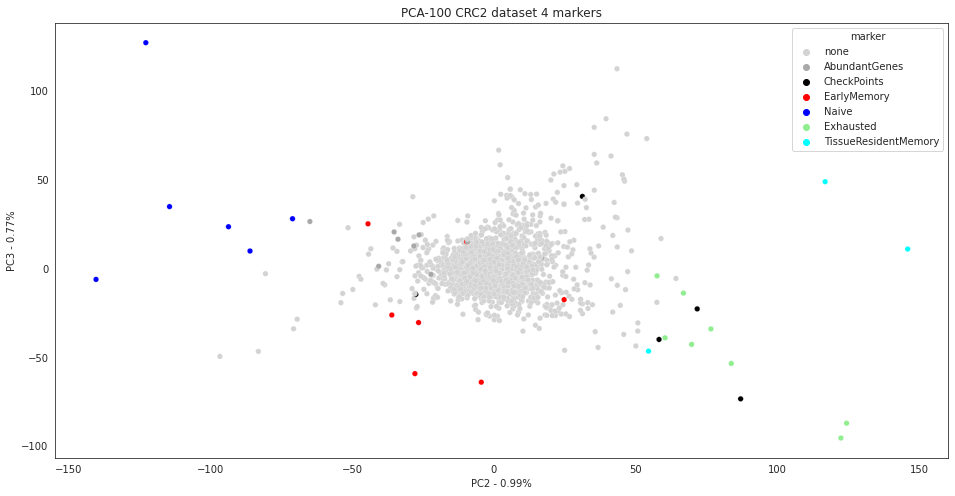

In [ ]:
plotting_res_sns(pca_df100_crc2, var_pc100_crc2, 'PC2', 'PC3', color_marker_four, 'PCA-100 CRC2 dataset 4 markers')


In [ ]:
plotting_res_plotly(pca_df100_crc2, var_pc100_crc2, 'PC2', 'PC3', color_marker_four, 'PCA-100 CRC2 dataset 4 markers')

#### UMAP

In [ ]:
embedding100 = umap.UMAP(random_state=0).fit_transform(pca_df100_crc2[pca_df100_crc2.columns[:-2]])

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning:

The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.



In [ ]:
embedding100.shape

(2490, 2)

In [ ]:
plot_emb_res=pd.concat([pca_df100_crc2['gene'], pca_df100_crc2['marker']], axis=1)
plot_emb_res["UMAP1"] = embedding100[:, 0]
plot_emb_res["UMAP2"] = embedding100[:, 1]
plot_emb_res.head()

,gene,marker,UMAP1,UMAP2
0,A1BG,none,-9.834551,1.874690
1,AKT3,none,-10.303867,1.745479
2,ZBTB11-AS1,none,-9.882058,0.998768
3,RPL19,AbundantGenes,-5.446503,4.044405
4,ACOT8,none,-8.877432,-0.517299


In [ ]:
fig = px.scatter(plot_emb_res, x="UMAP1", y="UMAP2", color="marker",
                 color_discrete_map = color_marker_four,
                 title='UMAP for PCA-100 CRC2 dataset 4 markers')
                 #color_discrete_sequence=['lightgray','darkgray', 'black',  'darkgreen', 'purple',  'red',  'blue', 'lightgreen','cyan', 'yellow'])
fig.show()

####UMAP on the whole dataset

In [ ]:
training_set_crc2

,NTC100-20180123,NTC101-20180123,NTC102-20180123,NTC103-20180123,NTC105-20180123,NTC106-20180123,NTC107-20180123,NTC108-20180123,NTC110-20180123,NTC111-20180123,...,PTC82-20161228,PTC85-20161228,PTC90-20161228,PTC91-20161228,PTC9-20161228,PTC92-20161228,PTC94-20161228,PTC96-20161228,gene,marker
0,0.000000,0.000000,0.000000,0.000000,0.000000,5.263974,0.000000,0.000000,0.000000,5.523833,...,0.000000,0.000000,0.000000,0.000000,3.345408,3.152487,4.052686,0.000000,A1BG,none
4,0.000000,0.000000,0.461721,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.610769,...,0.000000,0.000000,0.000000,0.000000,7.342728,0.000000,0.000000,0.000000,AKT3,none
6,0.000000,0.000000,1.579739,6.838885,0.000000,5.974255,0.000000,0.000000,0.000000,7.084257,...,0.000000,0.000000,0.000000,0.000000,3.238087,0.000000,0.000000,0.000000,ZBTB11-AS1,none
23,11.923738,11.017496,9.986913,4.567699,7.020852,11.773596,10.477826,10.492342,10.392275,10.434832,...,11.785157,10.181003,12.065675,10.110356,11.606203,11.449102,11.029775,12.144915,RPL19,AbundantGenes
73,7.610768,4.031635,0.000000,0.000000,0.000000,0.000000,5.629438,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,7.697730,0.000000,0.000000,0.000000,0.000000,ACOT8,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21735,0.000000,0.000000,4.220973,5.595479,0.000000,0.000000,0.000000,0.000000,0.000000,7.399335,...,0.000000,0.000000,5.799586,0.808097,7.765281,4.594861,0.000000,0.000000,SLC23A2,none
21747,0.000000,0.000000,5.219583,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,6.170615,0.000000,0.000000,0.000000,0.000000,0.000000,NR1D2,none
21754,0.000000,0.000000,3.686907,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,3.583345,0.000000,1.286437,0.000000,1.548150,0.000000,REC8,none
21755,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,7.828619,10.001215,0.000000,2.678338,8.228104,0.000000,RCE1,none


In [ ]:
embedding3 = umap.UMAP(random_state=0).fit_transform(training_set_crc2[training_set_crc2.columns[:-2]])

In [ ]:
embedding3.shape

In [ ]:
plot_emb_res3=pd.concat([training_set_crc2['gene'], training_set_crc2['marker']], axis=1)
plot_emb_res3["UMAP1"] = embedding3[:, 0]
plot_emb_res3["UMAP2"] = embedding3[:, 1]
plot_emb_res3.head()

,gene,marker,UMAP1,UMAP2
0,A1BG,none,4.734508,-3.401618
4,AKT3,none,5.764010,-0.440835
6,ZBTB11-AS1,none,6.150336,-0.981775
23,RPL19,AbundantGenes,8.683215,-1.834253
73,ACOT8,none,5.645271,-0.147937


In [ ]:
fig = px.scatter(plot_emb_res3, x="UMAP1", y="UMAP2", color="marker",
                 color_discrete_map=color_marker_four,
                 title='UMAP for the whole dataset 4 markers')
fig.show()

### Running the code for CRC2 dataset (GSE108989) - 7 markers

In [ ]:
home_path = '/content/gdrive/MyDrive/CPP_data/'
path_dataset = '/content/gdrive/MyDrive/CPP_data/crc2.parquet.gzip'
path_labels = '/content/gdrive/MyDrive/CPP_data/labels_crc2'
dataset_name = 'crc2'
cell_name_to_filter = 'CD8'
main_markers = ['EarlyMemory', 'Exhausted','Naive', 'TEM', 'CirculatingMemory', 'TissueResidentMemory', 'Cycling']
check_points = ['CheckPoints']
markers_check = ['AbundantGenes']
color_marker = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
                        'EarlyMemory': 'red','TEM': 'purple','CirculatingMemory': 'darkgreen',
                        'Cycling': 'yellow', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
markers = markers_last
dataset_filtered_crc2 = prepare_dataset(home_path, path_dataset, path_labels, dataset_name, cell_name_to_filter, markers)

Index(['symbol', 'NP710-20180123', 'NP711-20180123', 'NP71-20180123',
       'NP712-20180123'],
      dtype='object')
crc2  data shape: (23459, 11139)
crc2  labels shape: (10803, 2)
CD4             6258
CD8             3707
UnknownTCell     838
Name: 1, dtype: int64


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning:

In a future version of pandas all arguments of read_csv except for the argument 'filepath_or_buffer' will be keyword-only



Dataset filtered by cells needed ( CD8 ), final shape: (23459, 3708)
************************************************
Filtering Mitochondrial and Mirna genes..
************************************************
The total number of genes filtered out by R[NUP] :  343
The total number of genes filtered out by MIR :  1258
The total number of genes filtered out by MT :  93
Final dataset shape:  (21765, 3708)
************************************************
************************************************
Total number of markers used 49
Adding markers...
************************************************
Found gene that was absent. Adding it... RPL19
Total number of markers 49
Total number of markers added 1
************************************************
************************************************
Total markers for key Naive is: 6
Total markers for key EarlyMemory is: 7
Total markers for key Exhausted is: 7
Total markers for key TissueResidentMemory is: 3
Total markers for key TEM is: 5


In [ ]:
dataset_filtered_crc2

,gene,NTC100-20180123,NTC101-20180123,NTC102-20180123,NTC103-20180123,NTC105-20180123,NTC106-20180123,NTC107-20180123,NTC108-20180123,NTC110-20180123,...,PTC8-20161228,PTC82-20161228,PTC85-20161228,PTC90-20161228,PTC91-20161228,PTC9-20161228,PTC92-20161228,PTC94-20161228,PTC96-20161228,marker
0,A1BG,0.000000,0.00000,0.000000,0.000000,0.000000,37.425026,0.0,0.000000,0.000000,...,6.842114,0.0,0.000000,0.000000,0.000000,9.164084,7.891868,15.595108,0.000000,none
1,NAT2,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,none
2,ADA,728.524096,0.00000,0.000000,0.000000,1559.820252,0.000000,0.0,12.620134,486.322514,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,1291.344327,0.000000,0.000000,none
3,CDH2,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,39.678365,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,none
4,AKT3,0.000000,0.00000,0.377184,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,161.323445,0.000000,0.000000,0.000000,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23454,PTBP3,0.000000,0.85674,255.570818,0.000000,0.000000,0.000000,0.0,0.000000,240.034214,...,25.515314,0.0,0.582559,2.332675,0.672473,0.000000,224.343542,241.343082,66.739146,none
23455,KCNE2,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,none
23456,DGCR2,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.000000,2.622866,0.000000,0.000000,0.813718,0.000000,105.527345,none
23457,CASP8AP2,0.000000,0.00000,0.000000,29.502349,0.000000,0.000000,0.0,0.000000,0.000000,...,0.509264,0.0,468.827433,152.415936,0.000000,0.496065,0.587398,118.065390,0.634808,none


In [ ]:
#preparing data for PCA
training_set_crc2, _ = prep_data_PCA(home_path, path_dataset, dataset_name, markers, 0.8, 1.9)

Dataset shape:  (21766, 3709)
x_labels shape (21766,) x_markers shape (21766,)
Markers values: 
 none                    21717
AbundantGenes               9
EarlyMemory                 7
Exhausted                   7
CheckPoints                 6
Naive                       6
TEM                         5
CirculatingMemory           4
TissueResidentMemory        3
Cycling                     2
Name: marker, dtype: int64
X for PCA shape:  (21766, 3709)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



variance tables shape (21766, 1)
x_labels (21766,)
x_labels index RangeIndex(start=0, stop=21766, step=1)
genes_var index RangeIndex(start=0, stop=21766, step=1)
difference in indexes []
(21766, 3709)
variance tables shape (21766, 3)
variance table          Var      Mean       Std  gene
0   3.515587  0.851640  1.874990  A1BG
1   0.035302  0.007163  0.187887  NAT2
2  15.250111  2.798874  3.905139   ADA
3   0.039000  0.009786  0.197484  CDH2
4   3.824841  0.830627  1.955720  AKT3
variance tables shape (21766, 4)
************************************************
Training set shape (2306, 3709)
Adding markers (check if they were deleted)
************************************************
Found gene that was absent. Adding it... TCF7
Found gene that was absent. Adding it... IL7R
Found gene that was absent. Adding it... CCR7
Found gene that was absent. Adding it... SELL
Found gene that was absent. Adding it... LTB
Found gene that was absent. Adding it... GZMK
Found gene that was absent. Adding 

####PCA

In [ ]:
pca_df100_crc2, var_pc100_crc2 = running_PCA(training_set_crc2, home_path)


markers check: 
 none                    2298
AbundantGenes              9
EarlyMemory                7
Exhausted                  7
CheckPoints                6
Naive                      6
TEM                        5
CirculatingMemory          4
TissueResidentMemory       3
Cycling                    2
Name: marker, dtype: int64
X_train shape:  (2347, 3706)
************************************************
Principal Component Analysis (PCA)
explained var by components [0.07116 0.01084 0.00831 0.00508 0.00436 0.00365 0.00312 0.0028  0.00245
 0.00226]


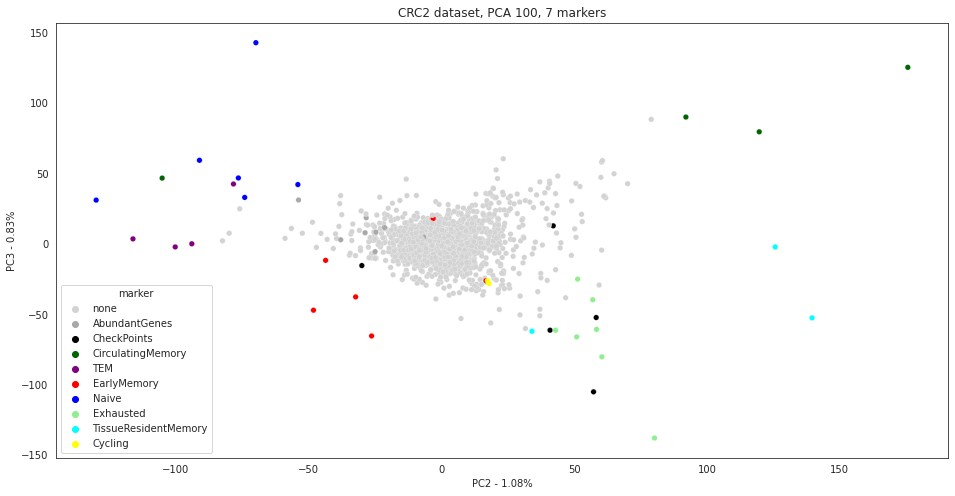

In [ ]:
plotting_res_sns(pca_df100_crc2, var_pc100_crc2, 'PC2', 'PC3',color_marker, 'CRC2 dataset, PCA 100, 7 markers')


In [ ]:
plotting_res_plotly(pca_df100_crc2, var_pc100_crc2, 'PC2', 'PC3', color_marker, 'CRC2 dataset, PCA 100, 7 markers')

#### UMAP

In [ ]:
embedding100 = umap.UMAP(random_state=0).fit_transform(pca_df100_crc2[pca_df100_crc2.columns[:-2]])

In [ ]:
embedding100.shape

(2341, 2)

In [ ]:
plot_emb_res=pd.concat([pca_df100_crc2['gene'], pca_df100_crc2['marker']], axis=1)
plot_emb_res["UMAP1"] = embedding100[:, 0]
plot_emb_res["UMAP2"] = embedding100[:, 1]
plot_emb_res.head()

,gene,marker,UMAP1,UMAP2
0,A1BG,none,-0.264574,7.213276
1,AKT3,none,-0.924779,8.103552
2,ZBTB11-AS1,none,-1.380393,7.537619
3,RPL19,AbundantGenes,2.764887,1.758291
4,ACOT8,none,-3.089828,3.392488


In [ ]:
fig = px.scatter(plot_emb_res, x="UMAP1", y="UMAP2", color="marker",
                 color_discrete_map = color_marker,
                 title='UMAP for PCA-100 results 7 markers')
                 #color_discrete_sequence=['lightgray','darkgray', 'black',  'darkgreen', 'purple',  'red',  'blue', 'lightgreen','cyan', 'yellow'])
fig.show()

####UMAP on the whole dataset

In [ ]:
training_set_crc2

,NTC100-20180123,NTC101-20180123,NTC102-20180123,NTC103-20180123,NTC105-20180123,NTC106-20180123,NTC107-20180123,NTC108-20180123,NTC110-20180123,NTC111-20180123,...,PTC82-20161228,PTC85-20161228,PTC90-20161228,PTC91-20161228,PTC9-20161228,PTC92-20161228,PTC94-20161228,PTC96-20161228,gene,marker
0,0.000000,0.000000,0.000000,0.000000,0.000000,5.263974,0.000000,0.000000,0.000000,5.523833,...,0.000000,0.000000,0.000000,0.000000,3.345408,3.152487,4.052686,0.000000,A1BG,none
4,0.000000,0.000000,0.461721,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.610769,...,0.000000,0.000000,0.000000,0.000000,7.342728,0.000000,0.000000,0.000000,AKT3,none
6,0.000000,0.000000,1.579739,6.838885,0.000000,5.974255,0.000000,0.000000,0.000000,7.084257,...,0.000000,0.000000,0.000000,0.000000,3.238087,0.000000,0.000000,0.000000,ZBTB11-AS1,none
29,11.923738,11.017496,9.986913,4.567699,7.020852,11.773596,10.477826,10.492342,10.392275,10.434832,...,11.785157,10.181003,12.065675,10.110356,11.606203,11.449102,11.029775,12.144915,RPL19,AbundantGenes
73,7.610768,4.031635,0.000000,0.000000,0.000000,0.000000,5.629438,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,7.697730,0.000000,0.000000,0.000000,0.000000,ACOT8,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21735,0.000000,0.000000,4.220973,5.595479,0.000000,0.000000,0.000000,0.000000,0.000000,7.399335,...,0.000000,0.000000,5.799586,0.808097,7.765281,4.594861,0.000000,0.000000,SLC23A2,none
21747,0.000000,0.000000,5.219583,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,6.170615,0.000000,0.000000,0.000000,0.000000,0.000000,NR1D2,none
21754,0.000000,0.000000,3.686907,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,3.583345,0.000000,1.286437,0.000000,1.548150,0.000000,REC8,none
21755,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,7.828619,10.001215,0.000000,2.678338,8.228104,0.000000,RCE1,none


In [ ]:
embedding3 = umap.UMAP(random_state=0).fit_transform(training_set_crc2[training_set_crc2.columns[:-2]])

In [ ]:
embedding3.shape

(2744, 2)

In [ ]:
plot_emb_res3=pd.concat([training_set_crc2['gene'], training_set_crc2['marker']], axis=1)
plot_emb_res3["UMAP1"] = embedding3[:, 0]
plot_emb_res3["UMAP2"] = embedding3[:, 1]
plot_emb_res3.head()

,gene,marker,UMAP1,UMAP2
0,A1BG,none,-2.330540,0.658647
4,AKT3,none,-2.556861,1.266233
6,ZBTB11-AS1,none,-2.343429,1.204122
29,RPL19,AbundantGenes,7.165915,3.590910
73,ACOT8,none,-2.656988,1.232618


In [ ]:
fig = px.scatter(plot_emb_res3, x="UMAP1", y="UMAP2", color="marker",
                 color_discrete_map=color_marker,
                 title='UMAP for the whole CRC2 dataset, 7 markers')
fig.show()

### Running the code for HEPA dataset (GSE98638) 4 markers

In [ ]:
home_path = '/content/gdrive/MyDrive/CPP_data/'
path_dataset = '/content/gdrive/MyDrive/CPP_data/hepa.parquet.gzip'
path_labels = '/content/gdrive/MyDrive/CPP_data/labels_hepa'
dataset_name = 'hepa'
cell_name_to_filter = 'CD8'
main_markers = ['EarlyMemory', 'Exhausted','Naive','TissueResidentMemory']
check_points = ['CheckPoints']
markers_check = ['AbundantGenes']
color_marker_four = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
                        'EarlyMemory': 'red', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
markers = markers_four
dataset_filtered_hepa = prepare_dataset(home_path, path_dataset, path_labels, dataset_name, cell_name_to_filter, markers_four)

Index(['symbol', 'PTH13', 'PTH1', 'PTH20', 'PTH26'], dtype='object')
hepa  data shape: (23459, 5064)
hepa  labels shape: (4866, 2)
CD4             2967
CD8             1633
UnknownTCell     266
Name: 1, dtype: int64
Dataset filtered by cells needed ( {'Naive': ['TCF7', 'IL7R', 'CCR7', 'SELL', 'LEF1', 'LTB'], 'EarlyMemory': ['GZMK', 'SH2D1A', 'EOMES', 'DTHD1', 'SLAMF7', 'FCRL3', 'CD28', 'CXCR5'], 'Exhausted': ['HAVCR2', 'ENTPD1', 'GZMB', 'LAYN', 'CD38', 'VCAM1', 'TOX', 'LAG3'], 'TissueResidentMemory': ['ITGAE', 'ZNF683', 'ITGA1'], 'AbundantGenes': ['GAPDH', 'RPL19', 'ACTB', 'PTPRC', 'CD3D', 'CD3E', 'CD3G', 'CD8A', 'CD8B'], 'CheckPoints': ['CTLA4', 'PDCD1', 'TIGIT', 'PVRIG', 'CD96', 'CD226']} ), final shape: (23459, 2)
************************************************
Filtering Mitochondrial and Mirna genes..
************************************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of read_csv except for the argument 'filepath_or_buffer' will be keyword-only
  """Entry point for launching an IPython kernel.


The total number of genes filtered out by R[NUP] :  343
The total number of genes filtered out by MIR :  1258
The total number of genes filtered out by MT :  93
Final dataset shape:  (21765, 2)
************************************************
************************************************


AttributeError: ignored

In [ ]:
dataset_filtered_hepa

,gene,PTC141-0205,PTC142-0205,PTC143-0205,PTC144-0205,PTC16-0205,PTC23-0205,TTC100-0205,TTC97-0205,TTC98-0205,...,PTC29-0508,PTC31-0508,PTC36-0508,PTC37-0508,PTC39-0508,PTC40-0508,TTC26-0508,TTC74-0508,TTR189-0508,marker
0,A1BG,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.375213,0.000000,0.000000,...,152.944596,209.610484,0.0,0.0,105.286349,0.000000,0.000000,0.000000,0.000000,none
1,NAT2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,none
2,ADA,0.000000,0.000000,1923.863283,0.000000,0.000000,451.723995,39.763594,0.000000,3.655123,...,0.000000,0.000000,0.0,0.0,1568.276360,0.000000,0.000000,0.000000,0.000000,none
3,CDH2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,none
4,AKT3,177.595165,0.000000,0.000000,143.807321,33.598151,0.000000,17.350993,0.000000,49.581418,...,0.000000,0.000000,0.0,0.0,0.000000,238.035472,0.000000,0.000000,0.000000,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23454,PTBP3,88.897292,177.741057,0.000000,26.283259,31.951295,94.552624,0.000000,309.244623,0.000000,...,0.000000,179.653491,0.0,0.0,0.000000,0.000000,189.791877,122.265127,264.351101,none
23455,KCNE2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,none
23456,DGCR2,0.000000,24.148844,86.866114,48.654270,0.000000,0.000000,3.403104,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.556713,0.000000,0.000000,47.315958,16.195609,none
23457,CASP8AP2,0.000000,805.492557,0.000000,0.000000,0.000000,25.581885,0.000000,0.000000,124.197452,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,none


In [ ]:
#preparing data for PCA
training_set_hepa, var_df = prep_data_PCA(home_path, path_dataset, dataset_name, markers, 0.7, 2)
check_var_thresh(var_df,0.72, 2.1)
1.2998407729691086/0.7345407510056047

Dataset shape:  (21766, 1636)
x_labels shape (21766,) x_markers shape (21766,)
Markers values: 
 none                    21717
AbundantGenes               9
EarlyMemory                 7
Exhausted                   7
CheckPoints                 6
Naive                       6
TEM                         5
CirculatingMemory           4
TissueResidentMemory        3
Cycling                     2
Name: marker, dtype: int64
X for PCA shape:  (21766, 1636)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  


variance tables shape (21766, 1)
x_labels (21766,)
x_labels index RangeIndex(start=0, stop=21766, step=1)
genes_var index RangeIndex(start=0, stop=21766, step=1)
difference in indexes []
(21766, 1636)
variance tables shape (21766, 3)
variance table          Var      Mean       Std  gene
0   4.353872  1.017162  2.086594  A1BG
1   0.028723  0.008228  0.169480  NAT2
2  16.058928  2.710675  4.007359   ADA
3   0.127201  0.026224  0.356653  CDH2
4   3.656464  0.732555  1.912188  AKT3
variance tables shape (21766, 4)
************************************************
Training set shape (2645, 1636)
Adding markers (check if they were deleted)
************************************************
Found gene that was absent. Adding it... TCF7
Found gene that was absent. Adding it... IL7R
Found gene that was absent. Adding it... SELL
Found gene that was absent. Adding it... LEF1
Found gene that was absent. Adding it... LTB
Found gene that was absent. Adding it... GZMK
Found gene that was absent. Adding 

####PCA

In [ ]:
pca_df10_hepa, var_pc10_hepa = running_PCA(training_set_hepa, home_path)


markers check: 
 none                    2640
AbundantGenes              9
EarlyMemory                8
Exhausted                  8
CheckPoints                6
Naive                      6
TissueResidentMemory       3
Name: marker, dtype: int64
X_train shape:  (2680, 1633)
Principal Component Analysis (PCA)
explained var by components [0.06543 0.01195 0.00555 0.00502 0.00485 0.00359 0.00288 0.00276 0.0026
 0.00236]


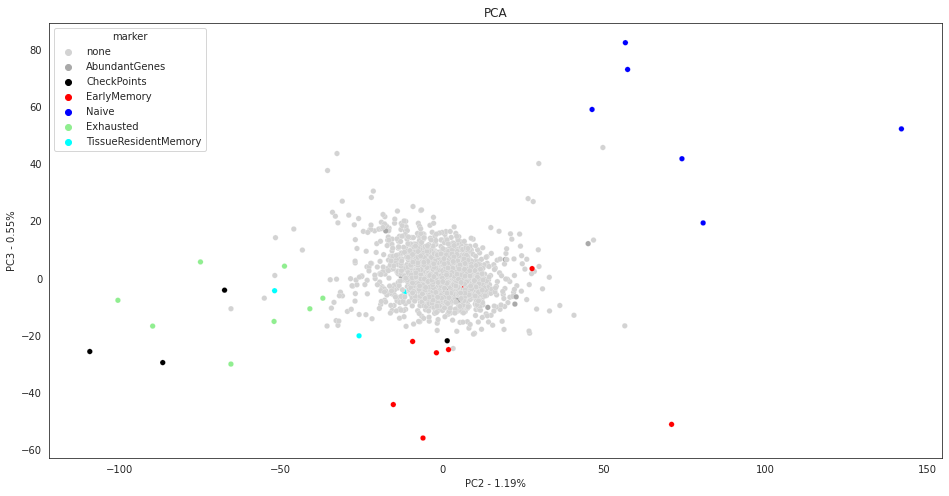

In [ ]:
plotting_res_sns(pca_df10_hepa, var_pc10_hepa, 'PC2', 'PC3', color_marker_four)


In [ ]:
plotting_res_plotly(pca_df10_hepa, var_pc10_hepa, 'PC2', 'PC3', color_marker_four)

#### UMAP

In [ ]:
embedding = umap.UMAP(random_state=0).fit_transform(pca_df10_hepa[pca_df10_hepa.columns[:-2]])

In [ ]:
embedding.shape

(2680, 2)

In [ ]:
plot_emb_res=pd.concat([pca_df10_hepa['gene'], pca_df10_hepa['marker']], axis=1)
plot_emb_res["UMAP1"] = embedding[:, 0]
plot_emb_res["UMAP2"] = embedding[:, 1]
plot_emb_res.head()

,gene,marker,UMAP1,UMAP2
0,A1BG,none,11.038684,9.426953
1,AKT3,none,11.730311,11.014754
2,ZBTB11-AS1,none,9.746795,6.724778
3,RPL19,AbundantGenes,8.328230,2.669937
4,ACOT8,none,12.078321,4.749726


In [ ]:
fig = px.scatter(plot_emb_res, x="UMAP1", y="UMAP2", color="marker",
                 color_discrete_map = color_marker_four)
                 #color_discrete_sequence=['lightgray','darkgray', 'black',  'darkgreen', 'purple',  'red',  'blue', 'lightgreen','cyan', 'yellow'])
fig.show()

####PCA-100 & UMAP

In [ ]:
pca_df_hepa, var_pc_hepa = running_PCA(training_set_hepa, home_path, 100)


markers check: 
 none                    2640
AbundantGenes              9
EarlyMemory                8
Exhausted                  8
CheckPoints                6
Naive                      6
TissueResidentMemory       3
Name: marker, dtype: int64
X_train shape:  (2680, 1633)
Principal Component Analysis (PCA)
explained var by components [0.06543 0.01195 0.00555 0.00502 0.00485 0.00359 0.00289 0.00277 0.00264
 0.00245 0.00235 0.00227 0.00222 0.00218 0.00215 0.00212 0.0021  0.00203
 0.00201 0.002   0.00197 0.00196 0.00195 0.00195 0.00193 0.00191 0.0019
 0.00189 0.00188 0.00187 0.00186 0.00185 0.00184 0.00183 0.00182 0.00181
 0.00179 0.00179 0.00178 0.00177 0.00177 0.00176 0.00175 0.00174 0.00173
 0.00173 0.00172 0.00171 0.00171 0.0017  0.00169 0.00169 0.00168 0.00167
 0.00167 0.00166 0.00166 0.00165 0.00165 0.00164 0.00164 0.00162 0.00162
 0.00162 0.00161 0.00161 0.0016  0.0016  0.00159 0.00159 0.00158 0.00157
 0.00156 0.00156 0.00155 0.00155 0.00154 0.00153 0.00153 0.00152 0.00152
 0.00

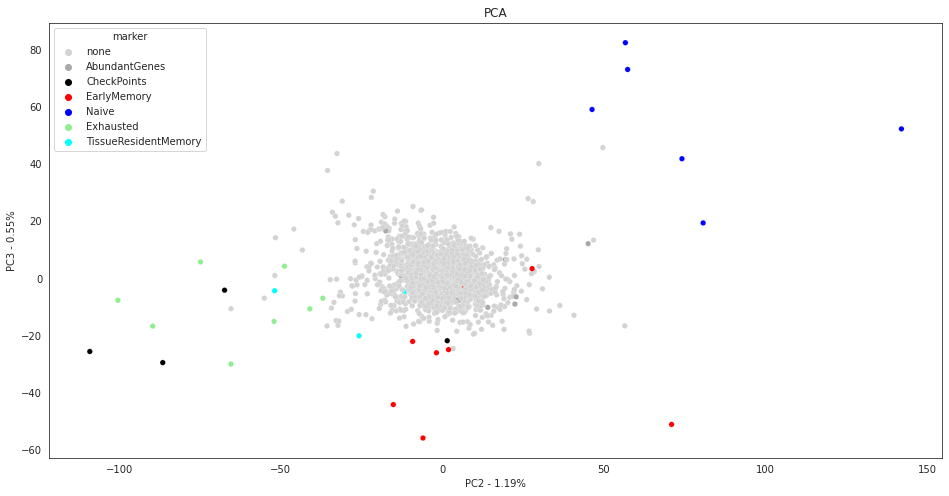

In [ ]:
plotting_res_sns(pca_df_hepa, var_pc_hepa, 'PC2', 'PC3', color_marker_four)


In [ ]:
plotting_res_plotly(pca_df_hepa, var_pc_hepa, 'PC2', 'PC3', color_marker_four)

In [ ]:
embedding2 = umap.UMAP(random_state=0).fit_transform(pca_df_hepa[pca_df_hepa.columns[:-2]])

In [ ]:
embedding2.shape

(2680, 2)

In [ ]:
plot_emb_res=pd.concat([pca_df_hepa['gene'], pca_df_hepa['marker']], axis=1)
plot_emb_res["UMAP1"] = embedding2[:, 0]
plot_emb_res["UMAP2"] = embedding2[:, 1]
plot_emb_res.head()

,gene,marker,UMAP1,UMAP2
0,A1BG,none,-1.013472,-7.871780
1,AKT3,none,0.364589,-9.367152
2,ZBTB11-AS1,none,-0.547884,-7.881951
3,RPL19,AbundantGenes,8.063407,3.591831
4,ACOT8,none,1.211710,-6.325050


In [ ]:
fig = px.scatter(plot_emb_res, x="UMAP1", y="UMAP2", color="marker",
                 color_discrete_map= color_marker_four)
fig.show()

####UMAP on the whole dataset

In [ ]:
training_set_hepa

,PTC141-0205,PTC142-0205,PTC143-0205,PTC144-0205,PTC16-0205,PTC23-0205,TTC100-0205,TTC97-0205,TTC98-0205,TTC99-0205,...,PTC31-0508,PTC36-0508,PTC37-0508,PTC39-0508,PTC40-0508,TTC26-0508,TTC74-0508,TTR189-0508,gene,marker
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.248057,0.000000,0.000000,0.000000,...,7.718433,0.000000,0.000000,6.731813,0.000000,0.000000,0.000000,0.000000,A1BG,none
4,7.480549,0.000000,0.000000,7.177991,5.112623,0.000000,4.197786,0.000000,5.660536,0.000000,...,0.000000,0.000000,0.000000,0.000000,7.901081,0.000000,0.000000,0.000000,AKT3,none
6,0.000000,0.000000,0.000000,0.000000,0.000000,7.288739,0.000000,0.000000,0.000000,0.000000,...,6.883574,0.000000,0.000000,0.000000,0.000000,0.000000,6.391852,0.000000,ZBTB11-AS1,none
23,10.854632,10.577690,11.742468,9.862976,10.640132,12.133047,9.347926,10.531518,12.052105,7.005921,...,11.966777,11.892692,13.075176,11.131610,12.449953,11.782419,11.378372,0.000000,RPL19,AbundantGenes
73,0.000000,7.180973,8.418707,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,ACOT8,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21735,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,2.132920,0.000000,0.000000,0.000000,0.000000,4.860613,0.000000,SLC23A2,none
21742,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,2.274965,0.000000,0.000000,0.000000,5.372582,0.000000,0.000000,CDC34,none
21747,0.000000,0.000000,0.000000,3.269123,9.075020,0.000000,0.000000,0.000000,8.124366,0.000000,...,0.000000,0.000000,0.727490,7.857085,0.000000,0.000000,0.000000,2.957459,NR1D2,none
21755,0.000000,0.000000,10.795724,0.000000,0.000000,0.000000,0.000000,10.399857,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,RCE1,none


In [ ]:
embedding3 = umap.UMAP(random_state=0).fit_transform(training_set_hepa[training_set_hepa.columns[:-2]])

In [ ]:
embedding3.shape

(2680, 2)

In [ ]:
plot_emb_res3=pd.concat([training_set_hepa['gene'], training_set_hepa['marker']], axis=1)
plot_emb_res3["UMAP1"] = embedding3[:, 0]
plot_emb_res3["UMAP2"] = embedding3[:, 1]
plot_emb_res3.head()

,gene,marker,UMAP1,UMAP2
0,A1BG,none,-3.002225,1.083882
4,AKT3,none,-2.659383,0.371559
6,ZBTB11-AS1,none,-3.062495,1.495240
23,RPL19,AbundantGenes,15.045885,-0.182932
73,ACOT8,none,-2.448588,3.441514


In [ ]:
fig = px.scatter(plot_emb_res3, x="UMAP1", y="UMAP2", color="marker",
                 color_discrete_map=color_marker_four)
fig.show()

### Running the code for HEPA dataset (GSE98638) - 7 markers

In [ ]:
home_path = '/content/gdrive/MyDrive/CPP_data/'
path_dataset = '/content/gdrive/MyDrive/CPP_data/hepa.parquet.gzip'
path_labels = '/content/gdrive/MyDrive/CPP_data/labels_hepa'
dataset_name = 'hepa'
cell_name_to_filter = 'CD8'
main_markers = ['EarlyMemory', 'Exhausted','Naive', 'TEM', 'CirculatingMemory', 'TissueResidentMemory', 'Cycling']
check_points = ['CheckPoints']
markers_check = ['AbundantGenes']
color_marker = {'none':'lightgray', 'Naive': 'blue', 'Exhausted': 'lightgreen', 'TissueResidentMemory': 'cyan', 
                        'EarlyMemory': 'red','TEM': 'purple','CirculatingMemory': 'darkgreen',
                        'Cycling': 'yellow', 'CheckPoints': 'black', 'AbundantGenes': 'darkgray'}
markers = markers_last
dataset_filtered_hepa = prepare_dataset(home_path, path_dataset, path_labels, dataset_name, cell_name_to_filter, markers)

Index(['symbol', 'PTH13', 'PTH1', 'PTH20', 'PTH26'], dtype='object')
hepa  data shape: (23459, 5064)
hepa  labels shape: (4866, 2)
CD4             2967
CD8             1633
UnknownTCell     266
Name: 1, dtype: int64


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning:

In a future version of pandas all arguments of read_csv except for the argument 'filepath_or_buffer' will be keyword-only



Dataset filtered by cells needed ( CD8 ), final shape: (23459, 1635)
Filtering Mitochondrial and Mirna genes..
The total number of genes filtered out by R[NUP] :  343
The total number of genes filtered out by MIR :  1258
The total number of genes filtered out by MT :  93
Final dataset shape:  (21765, 1635)
Total number of markers used 49
Adding markers...
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Already exists
Found gene that was absent. Adding it... RPL19
Already exists
Already exists
Already exists
Already exists
Already ex

In [ ]:
#preparing data for PCA
training_set_hepa = prep_data_PCA(home_path, path_dataset, dataset_name, markers, 0.7, 2)

Dataset shape:  (21766, 1636)
x_labels shape (21766,) x_markers shape (21766,)
Markers values: 
 none                    21717
AbundantGenes               9
EarlyMemory                 7
Exhausted                   7
CheckPoints                 6
Naive                       6
TEM                         5
CirculatingMemory           4
TissueResidentMemory        3
Cycling                     2
Name: marker, dtype: int64
X for PCA shape:  (21766, 1636)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



variance tables shape (21766, 1)
x_labels (21766,)
x_labels index RangeIndex(start=0, stop=21766, step=1)
genes_var index RangeIndex(start=0, stop=21766, step=1)
difference in indexes []
(21766, 1636)
variance tables shape (21766, 3)
variance table          Var      Mean       Std  gene
0   4.353872  1.017162  2.086594  A1BG
1   0.028723  0.008228  0.169480  NAT2
2  16.058928  2.710675  4.007359   ADA
3   0.127201  0.026224  0.356653  CDH2
4   3.656464  0.732555  1.912188  AKT3
variance tables shape (21766, 4)
Training set shape (2645, 1636)
Adding markers (if they were deleted
Found gene that was absent. Adding it... TCF7
Found gene that was absent. Adding it... IL7R
Already exists
Found gene that was absent. Adding it... SELL
Found gene that was absent. Adding it... LEF1
Found gene that was absent. Adding it... LTB
Found gene that was absent. Adding it... GZMK
Found gene that was absent. Adding it... SH2D1A
Found gene that was absent. Adding it... EOMES
Found gene that was absent. Ad

####PCA

In [ ]:
pca_df10_hepa, var_pc10_hepa = running_PCA(training_set_hepa, home_path)


markers check: 
 none                    2639
AbundantGenes              9
EarlyMemory                7
Exhausted                  7
CheckPoints                6
Naive                      6
TEM                        5
CirculatingMemory          4
TissueResidentMemory       3
Cycling                    2
Name: marker, dtype: int64
X_train shape:  (2688, 1633)
Principal Component Analysis (PCA)
explained var by components [0.06483 0.01214 0.00589 0.00567 0.00501 0.00344 0.00293 0.00278 0.00262
 0.00249]


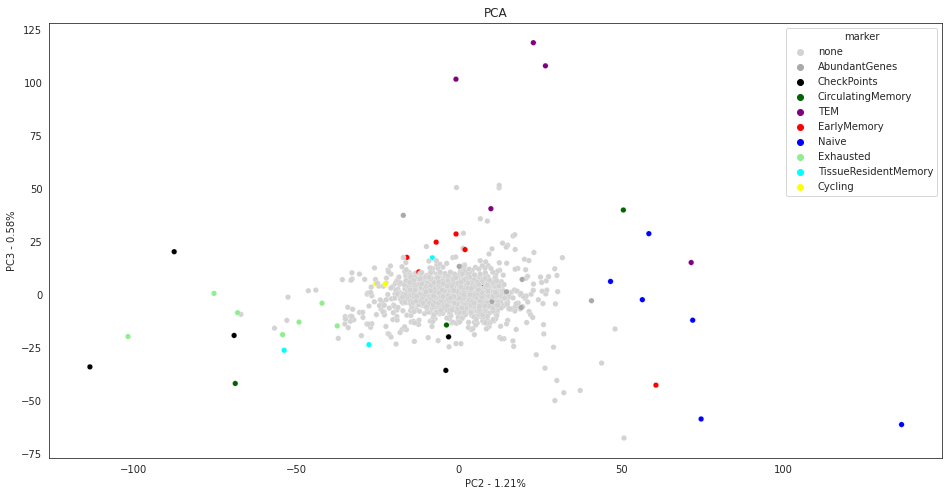

In [ ]:
plotting_res_sns(pca_df10_hepa, var_pc10_hepa, 'PC2', 'PC3',color_marker)


In [ ]:
plotting_res_plotly(pca_df10_hepa, var_pc10_hepa, 'PC2', 'PC3', color_marker)

#### UMAP

In [ ]:
embedding = umap.UMAP(random_state=0).fit_transform(pca_df10_hepa[pca_df10_hepa.columns[:-2]])

In [ ]:
embedding.shape

(2688, 2)

In [ ]:
plot_emb_res=pd.concat([pca_df10_hepa['gene'], pca_df10_hepa['marker']], axis=1)
plot_emb_res["UMAP1"] = embedding[:, 0]
plot_emb_res["UMAP2"] = embedding[:, 1]
plot_emb_res.head()

,gene,marker,UMAP1,UMAP2
0,A1BG,none,12.816828,10.860844
1,AKT3,none,13.423557,11.841007
2,ZBTB11-AS1,none,10.337876,8.170499
3,RPL19,AbundantGenes,7.306820,4.290026
4,ACOT8,none,12.832324,5.821985


In [ ]:
fig = px.scatter(plot_emb_res, x="UMAP1", y="UMAP2", color="marker",
                 color_discrete_map = color_marker)
                 #color_discrete_sequence=['lightgray','darkgray', 'black',  'darkgreen', 'purple',  'red',  'blue', 'lightgreen','cyan', 'yellow'])
fig.show()

####PCA-100 & UMAP

In [ ]:
pca_df_hepa, var_pc_hepa = running_PCA(training_set_hepa, home_path, 100)


markers check: 
 none                    2639
AbundantGenes              9
EarlyMemory                7
Exhausted                  7
CheckPoints                6
Naive                      6
TEM                        5
CirculatingMemory          4
TissueResidentMemory       3
Cycling                    2
Name: marker, dtype: int64
X_train shape:  (2688, 1633)
Principal Component Analysis (PCA)
explained var by components [0.06483 0.01214 0.00589 0.00567 0.00501 0.00344 0.00294 0.00281 0.00264
 0.00253 0.00236 0.00228 0.00221 0.00218 0.00215 0.00213 0.00211 0.00203
 0.002   0.002   0.00197 0.00196 0.00196 0.00195 0.00192 0.00191 0.00189
 0.00189 0.00187 0.00187 0.00186 0.00185 0.00184 0.00183 0.00183 0.00181
 0.00179 0.00179 0.00178 0.00177 0.00177 0.00175 0.00175 0.00174 0.00173
 0.00173 0.00172 0.00171 0.00171 0.0017  0.00169 0.00169 0.00168 0.00168
 0.00167 0.00166 0.00165 0.00164 0.00164 0.00164 0.00163 0.00162 0.00162
 0.00161 0.00161 0.0016  0.0016  0.00159 0.00159 0.00157 0.0015

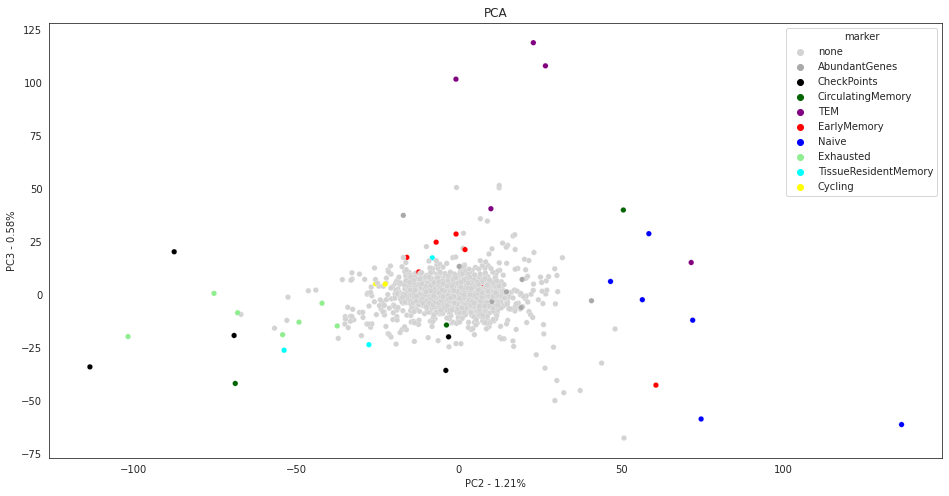

In [ ]:
plotting_res_sns(pca_df_hepa, var_pc_hepa, 'PC2', 'PC3',color_marker)


In [ ]:
plotting_res_plotly(pca_df_hepa, var_pc_hepa, 'PC2', 'PC3',color_marker)

In [ ]:
embedding2 = umap.UMAP(random_state=0).fit_transform(pca_df_hepa[pca_df_hepa.columns[:-2]])

In [ ]:
embedding2.shape

(2688, 2)

In [ ]:
plot_emb_res=pd.concat([pca_df_hepa['gene'], pca_df_hepa['marker']], axis=1)
plot_emb_res["UMAP1"] = embedding2[:, 0]
plot_emb_res["UMAP2"] = embedding2[:, 1]
plot_emb_res.head()

,gene,marker,UMAP1,UMAP2
0,A1BG,none,3.598777,-8.890015
1,AKT3,none,2.491075,-10.165297
2,ZBTB11-AS1,none,3.033630,-8.399907
3,RPL19,AbundantGenes,8.925613,-0.413446
4,ACOT8,none,0.501494,-6.731770


In [ ]:
fig = px.scatter(plot_emb_res, x="UMAP1", y="UMAP2", color="marker",
                 color_discrete_map=color_marker)
fig.show()

####UMAP on the whole dataset

In [ ]:
training_set_hepa

,PTC141-0205,PTC142-0205,PTC143-0205,PTC144-0205,PTC16-0205,PTC23-0205,TTC100-0205,TTC97-0205,TTC98-0205,TTC99-0205,...,PTC31-0508,PTC36-0508,PTC37-0508,PTC39-0508,PTC40-0508,TTC26-0508,TTC74-0508,TTR189-0508,gene,marker
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.248057,0.000000,0.000000,0.000000,...,7.718433,0.000000,0.000000,6.731813,0.000000,0.000000,0.000000,0.000000,A1BG,none
4,7.480549,0.000000,0.000000,7.177991,5.112623,0.000000,4.197786,0.000000,5.660536,0.000000,...,0.000000,0.000000,0.000000,0.000000,7.901081,0.000000,0.000000,0.000000,AKT3,none
6,0.000000,0.000000,0.000000,0.000000,0.000000,7.288739,0.000000,0.000000,0.000000,0.000000,...,6.883574,0.000000,0.000000,0.000000,0.000000,0.000000,6.391852,0.000000,ZBTB11-AS1,none
29,10.854632,10.577690,11.742468,9.862976,10.640132,12.133047,9.347926,10.531518,12.052105,7.005921,...,11.966777,11.892692,13.075176,11.131610,12.449953,11.782419,11.378372,0.000000,RPL19,AbundantGenes
73,0.000000,7.180973,8.418707,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,ACOT8,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21735,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,2.132920,0.000000,0.000000,0.000000,0.000000,4.860613,0.000000,SLC23A2,none
21742,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,2.274965,0.000000,0.000000,0.000000,5.372582,0.000000,0.000000,CDC34,none
21747,0.000000,0.000000,0.000000,3.269123,9.075020,0.000000,0.000000,0.000000,8.124366,0.000000,...,0.000000,0.000000,0.727490,7.857085,0.000000,0.000000,0.000000,2.957459,NR1D2,none
21755,0.000000,0.000000,10.795724,0.000000,0.000000,0.000000,0.000000,10.399857,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,RCE1,none


In [ ]:
embedding3 = umap.UMAP(random_state=0).fit_transform(training_set_hepa[training_set_hepa.columns[:-2]])

In [ ]:
embedding3.shape

(2688, 2)

In [ ]:
plot_emb_res3=pd.concat([training_set_hepa['gene'], training_set_hepa['marker']], axis=1)
plot_emb_res3["UMAP1"] = embedding3[:, 0]
plot_emb_res3["UMAP2"] = embedding3[:, 1]
plot_emb_res3.head()

,gene,marker,UMAP1,UMAP2
0,A1BG,none,0.557627,1.174923
4,AKT3,none,0.142598,0.452273
6,ZBTB11-AS1,none,0.618176,1.635010
29,RPL19,AbundantGenes,14.660230,1.440194
73,ACOT8,none,0.332444,1.207936


In [ ]:
fig = px.scatter(plot_emb_res3, x="UMAP1", y="UMAP2", color="marker",
                 color_discrete_map=color_marker)
fig.show()

##Modeling

In [ ]:
!pip install tensorflow
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds

     |████████████████████████████████| 462 kB 15.3 MB/s 


In [ ]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
from torch.autograd import Variable

from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from pathlib import Path

# from learn.dataset import TabularDataset
# from learn.model import CiteAutoencoder
# from learn.train import train_model, get_encodings

import plotly.graph_objects as go

  Created wheel for umap: filename=umap-0.1.1-py3-none-any.whl size=3565 sha256=1bf23190fd748200a1728599a738dffbb61b66c789f571c9127a0ddcc51c05b8
  Stored in directory: /root/.cache/pip/wheels/65/55/85/945cfb3d67373767e4dc3e9629300a926edde52633df4f0efe
Successfully built umap


#### Train func and model code

In [ ]:
from torch.utils.data import Dataset

class TabularDataset(Dataset):
    """Custome dataset for tabular data"""
    def __init__(self, data):
        self.data = data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        x = self.data[idx]
        return x, x


from collections import defaultdict
from tqdm import tqdm


def train_model(model, train_dl, valid_dl, lr, epochs, verbose=True):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=lr,
                                                    steps_per_epoch=len(train_dl), epochs=epochs)
    criterion = nn.MSELoss()
    history = defaultdict(list)
    
    mean_losses = []
    for epoch in tqdm(range(1, epochs + 1)):
        model.train()
        
        train_loss = 0
        nsamples_train = 0
        for x, y in train_dl:
            optimizer.zero_grad()

            # Forward pass
            x_prime = model(x.to(device))
            
            loss = criterion(x_prime, y.to(device))

            # Backward pass
            loss.backward()
            optimizer.step()
            scheduler.step()
            
            # log losses
            batch_size = x.shape[0]
            nsamples_train += batch_size
            train_loss += batch_size*(loss.item())
            
        valid_loss = 0
        nsamples_valid = 0
        
        model = model.eval()
        

        with torch.no_grad():
            for x, y in valid_dl:
                x_prime = model(x.to(device))

                loss = criterion(x_prime, y.to(device))
                
                # log losses
                batch_size = x.shape[0]
                nsamples_valid += batch_size
                valid_loss += batch_size*(loss.item())
                
        train_loss = train_loss / nsamples_train
        valid_loss = valid_loss / nsamples_valid

        history['train'].append(train_loss)
        history['valid'].append(valid_loss)

        
        if verbose and epoch%10==0:
            print(f'Epoch {epoch}: train loss {train_loss}; valid loss {valid_loss}')

    return model, history

def get_encodings(model, dl):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()
    with torch.no_grad():
        encodings = [model.encoder(x.to(device)) for x, _ in dl]
    return torch.cat(encodings, dim=0)


class LinBnDrop(nn.Sequential):
    """Module grouping `BatchNorm1d`, `Dropout` and `Linear` layers, adapted from fastai."""
    
    def __init__(self, n_in, n_out, bn=True, p=0., act=None, lin_first=True):
        layers = [nn.BatchNorm1d(n_out if lin_first else n_in)] if bn else []
        if p != 0: layers.append(nn.Dropout(p))
        lin = [nn.Linear(n_in, n_out, bias=not bn)]
        if act is not None: lin.append(act)
        layers = lin+layers if lin_first else layers+lin
        super().__init__(*layers)


class Encoder(nn.Module):
    """Encoder for CITE-seq data"""
    
    def __init__(self, nfeatures_rna, nfeatures_pro, hidden_rna, hidden_pro, z_dim):
        super().__init__()
        self.nfeatures_rna = nfeatures_rna
        self.nfeatures_pro = nfeatures_pro

        if nfeatures_rna > 0:
            self.encoder_rna = LinBnDrop(nfeatures_rna, hidden_rna, p=0.1, act=nn.LeakyReLU())

        if nfeatures_pro > 0:
            self.encoder_protein = LinBnDrop(nfeatures_pro, hidden_pro, p=0.1, act=nn.LeakyReLU())

        # make sure hidden_rna and hidden_pro are set correctly
        hidden_rna = 0 if nfeatures_rna == 0 else hidden_rna
        hidden_pro = 0 if nfeatures_pro == 0 else hidden_pro
        
        self.encoder = LinBnDrop(hidden_rna + hidden_pro, z_dim, act=nn.LeakyReLU())

    def forward(self, x):
        if self.nfeatures_rna > 0 and self.nfeatures_pro > 0:
            x_rna = self.encoder_rna(x[:, :self.nfeatures_rna])
            x_pro = self.encoder_protein(x[:, self.nfeatures_rna:])
            x = torch.cat([x_rna, x_pro], 1)

        elif self.nfeatures_rna > 0 and self.nfeatures_pro == 0:
            x = self.encoder_rna(x)

        elif self.nfeatures_rna == 0 and self.nfeatures_pro > 0:
            x = self.encoder_protein(x)
            
        return self.encoder(x)


class Decoder(nn.Module):
    """Decoder for CITE-seq data"""
    def __init__(self, nfeatures_rna, nfeatures_pro, hidden_rna, hidden_pro, z_dim):
        super().__init__()
        self.nfeatures_rna = nfeatures_rna
        self.nfeatures_pro = nfeatures_pro

        # make sure hidden_rna and hidden_pro are set correctly
        hidden_rna = 0 if nfeatures_rna == 0 else hidden_rna
        hidden_pro = 0 if nfeatures_pro == 0 else hidden_pro

        hidden = hidden_rna + hidden_pro

        self.decoder = nn.Sequential(
            LinBnDrop(z_dim, hidden, act=nn.LeakyReLU()),
            LinBnDrop(hidden, nfeatures_rna + nfeatures_pro, bn=False)
            )

    def forward(self, x):
        x = self.decoder(x)
        return x

        
class CiteAutoencoder(nn.Module):
    def __init__(self, nfeatures_rna=0, nfeatures_pro=0, hidden_rna=120, hidden_pro=8, z_dim=20):
        """ Autoencoder for citeseq data """
        super().__init__()
 
        self.encoder = Encoder(nfeatures_rna, nfeatures_pro, hidden_rna, hidden_pro, z_dim)
        self.decoder = Decoder(nfeatures_rna, nfeatures_pro, hidden_rna, hidden_pro, z_dim)


    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


In [ ]:
print(count)

140


I found an error in the train function in the code above

In [ ]:
gene_index = data_NSCLC_filtered_trans.drop(['cell_type', 'cell_type2', 'cell_type3'], axis=1).T.index
training_set = data_NSCLC_filtered_trans.drop(['cell_type', 'cell_type2', 'cell_type3'], axis=1).T
training_set.reset_index(drop=True, inplace=True)

In [ ]:
#training_set = torch.FloatTensor(training_set)
train, valid = train_test_split(training_set.to_numpy(dtype=np.float32), test_size=0.1, random_state=0)
train.shape, valid.shape

((12480, 2182), (1387, 2182))

In [ ]:
nfeatures  = training_set.shape[1]
print(nfeatures)
train_ds = TabularDataset(train)
valid_ds = TabularDataset(valid)
train_dl = DataLoader(train_ds, batch_size=64, shuffle=True)
valid_dl = DataLoader(valid_ds, batch_size=64, shuffle=False)
x, y = next(iter(train_dl))
x.shape, y.shape

2182


(torch.Size([64, 2182]), torch.Size([64, 2182]))

In [ ]:
model = CiteAutoencoder(nfeatures_rna=nfeatures, nfeatures_pro=0, hidden_rna=400, hidden_pro=0, z_dim=100)
model

CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=2182, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=100, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=100, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
        (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): LinBnDrop(
        (0): Linear(in_features=400, out_features=2182, bias=True)
      )
    )
  )
)

In [ ]:
lr = 1e-3
epochs = 10
model, losses, acc = train_model(model, train_dl, valid_dl, lr=lr, epochs=epochs)


100%|██████████| 10/10 [00:08<00:00,  1.17it/s]

Epoch 10: train loss 108231.37311698718; valid loss 65823.21351162581


In [ ]:
'''
fig = go.Figure()
fig.add_trace(go.Scatter(x=np.arange(1, epochs+1, 1), y=losses['train'],
                         mode='lines',
                         name='train'))
fig.add_trace(go.Scatter(x=np.arange(1, epochs+1, 1), y=losses['valid'],
                         mode='lines',
                         name='valid'))
fig.show()
'''
fig, axes =  plt.subplots(1, 2, figsize=(15,5))
axes[0].plot(losses['train'], label = 'Train lost')
axes[0].plot(losses['valid'], label='Validation lost')
axes[0].legend()
#axes[1].plot(acc['valid'], label = 'Train accuracy')
#axes[1].plot(acc['valid'], label='Validation accuracy')
#axes[1].legend()
plt.show()

NameError: ignored

Let's try transpose just to check the model

In [ ]:
cells_index = training_set.columns
training_set2= data_NSCLC_filtered_trans.drop(['cell_type', 'cell_type2', 'cell_type3'], axis=1)
training_set2.reset_index(drop=True, inplace=True)
train2, valid2 = train_test_split(training_set2.to_numpy(dtype=np.float32), test_size=0.1, random_state=0)
train2.shape, valid2.shape

((1963, 23459), (219, 23459))

In [ ]:
nfeatures2  = training_set2.shape[1]
print(nfeatures2)
train_ds2 = TabularDataset(train2)
valid_ds2 = TabularDataset(valid2)
train_dl2 = DataLoader(train_ds2, batch_size=64, shuffle=True)
valid_dl2 = DataLoader(valid_ds2, batch_size=64, shuffle=False)
x2, y2 = next(iter(train_dl2))
x2.shape, y2.shape

23459


(torch.Size([64, 23459]), torch.Size([64, 23459]))

In [ ]:
model2 = CiteAutoencoder(nfeatures_rna=nfeatures2, nfeatures_pro=0, hidden_rna=1000, hidden_pro=0, z_dim=100)
model2

CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=23459, out_features=1000, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(1000, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=1000, out_features=100, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=100, out_features=1000, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
        (2): BatchNorm1d(1000, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): LinBnDrop(
        (0): Linear(in_features=1000, out_features=23459, bias=True)
      )
    )
  )
)

In [ ]:
lr = 1e-3
epochs = 5
model2, losses2, acc2 = train_model(model2, train_dl2, valid_dl2, lr=lr, epochs=epochs)


100%|██████████| 5/5 [02:41<00:00, 32.22s/it]


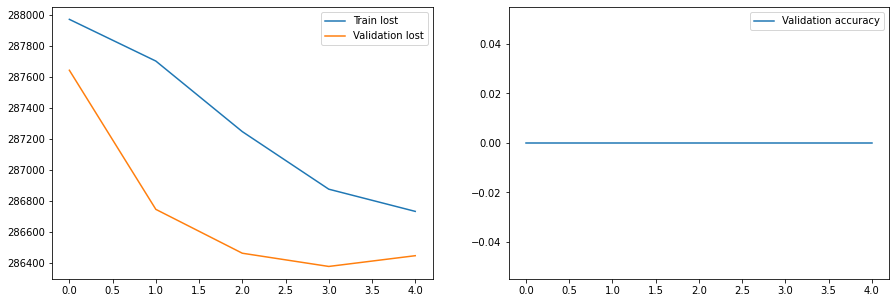

In [ ]:
import matplotlib.pyplot as plt

'''
fig = go.Figure()
fig.add_trace(go.Scatter(x=np.arange(1, epochs+1, 1), y=losses2['train'],
                         mode='lines',
                         name='train'))
fig.add_trace(go.Scatter(x=np.arange(1, epochs+1, 1), y=losses2['valid'],
                         mode='lines',
                         name='valid'))
fig.show()
'''

fig, axes =  plt.subplots(1, 2, figsize=(15,5))
axes[0].plot(losses2['train'], label = 'Train lost')
axes[0].plot(losses2['valid'], label='Validation lost')
axes[0].legend()
axes[1].plot(acc2['valid'], label = 'Train accuracy')
axes[1].plot(acc2['valid'], label='Validation accuracy')
axes[1].legend()
plt.show()

## Sum by columns check

In [ ]:
data_crc1_filtered = pd.read_parquet('/content/gdrive/MyDrive/CPP_data/data_crc1_filtered.gzip')  
data_crc1_filtered.sum(axis=0)

GENE               A1BGNAT2ADAAKT3MED6NAALAD2DDTLNAALADL1GUSBP9SI...
P_N_P0305_00203                                         13800.812411
P_P_P0305_00238                                         20100.811016
P_P_P0305_00338                                         16980.031943
P_P_P0305_00343                                         16557.005879
                                         ...                        
P_T_P1228_11149                                         19237.320518
P_T_P1228_11154                                          17590.19341
P_T_P1228_11159                                         17464.114099
P_T_P1228_11160                                           17197.3636
P_T_P1228_11164                                         17583.298946
Length: 2474, dtype: object

In [ ]:
data_crc2_filtered = pd.read_parquet('/content/gdrive/MyDrive/CPP_data/data_crc2_filtered.gzip')  
data_crc2_filtered.sum(axis=0)

symbol             A1BGNAT2ADACDH2AKT3GAGE12FZBTB11-AS1MED6NR2E3N...
NTC100-20180123                                            1000000.0
NTC101-20180123                                            1000000.0
NTC102-20180123                                            1000000.0
NTC103-20180123                                            1000000.0
                                         ...                        
PTC91-20161228                                             1000000.0
PTC9-20161228                                              1000000.0
PTC92-20161228                                             1000000.0
PTC94-20161228                                             1000000.0
PTC96-20161228                                             1000000.0
Length: 3708, dtype: object

In [ ]:
data_hepa_filtered = pd.read_parquet('/content/gdrive/MyDrive/CPP_data/data_hepa_filtered.gzip')  
data_hepa_filtered.sum(axis=0)

symbol         A1BGNAT2ADACDH2AKT3GAGE12FZBTB11-AS1MED6NR2E3N...
PTC141-0205                                            1000000.0
PTC142-0205                                            1000000.0
PTC143-0205                                            1000000.0
PTC144-0205                                            1000000.0
                                     ...                        
PTC37-0508                                             1000000.0
PTC39-0508                                             1000000.0
PTC40-0508                                             1000000.0
TTC26-0508                                             1000000.0
TTC74-0508                                             1000000.0
Length: 1634, dtype: object

In [ ]:
data_NSCLC_filtered = pd.read_parquet('/content/gdrive/MyDrive/CPP_data/data_NSCLC_filtered.gzip')  
data_NSCLC_filtered.sum(axis=0)

symbol            A1BGNAT2ADACDH2AKT3GAGE12FZBTB11-AS1MED6NR2E3N...
TTC100-0616A                                             1000000.12
TTC10-0616A                                              1000000.27
TTC101-0616A                                              999999.92
TTC102-0616A                                              999999.91
                                        ...                        
TTC63-20171219                                           1000000.15
TTC64-20171219                                            999999.84
TTC7-20171219                                            1000000.16
TTC8-20171219                                            1000000.07
TTC9-20171219                                             999999.89
Length: 2183, dtype: object

In [ ]:
data_mel_filtered = pd.read_parquet('/content/gdrive/MyDrive/CPP_data/data_mel_filtered.gzip')  
data_mel_filtered.sum(axis=0)

Gene                          TSPAN6TNMDDPM1SCYL3C1orf112FGRCFHFUCA2GCLCNFYA...
A12_P6_M11                                                              18240.4
A2_P4_M11                                                              15494.28
A4_P3_M11                                                              21295.04
A4_P4_M11                                                               17111.7
                                                    ...                        
F1_P5_M67_L001_T_enriched                                              24675.67
G12_P5_M67_L001_T_enriched                                             20759.87
G5_P5_M67_L001_T_enriched                                               16423.6
H7_P5_M67_L001_T_enriched                                              20217.66
H8_P5_M67_L001_T_enriched                                               8411.66
Length: 6462, dtype: object

# ######Trying to reproduce the PCA clustering

##NSCLC cells

In [ ]:
#data_NSCLC_filtered = pd.read_parquet('/content/gdrive/MyDrive/CPP_data/data_NSCLC_filtered.gzip')
data_NSCLC_filtered = pd.read_parquet('/content/gdrive/MyDrive/CPP_data/data_NSCLC_filtered_4markers.gzip')
data_NSCLC_filtered

,symbol,TTC100-0616A,TTC10-0616A,TTC101-0616A,TTC102-0616A,TTC103-0616A,TTC104-0616A,TTC1-0616A,TTC107-0616A,TTC108-0616A,...,TTC59-20171219,TTC61-20171219,TTC6-20171219,TTC62-20171219,TTC63-20171219,TTC64-20171219,TTC7-20171219,TTC8-20171219,TTC9-20171219,marker_four
0,A1BG,0.0,0.00,0.00,0.00,0.00,0.00,6.03,0.00,0.74,...,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,None
1,NAT2,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,1.35,0.0,0.00,0.00,None
2,ADA,0.0,0.00,5.20,1142.74,1.82,438.12,0.00,0.00,1.94,...,0.00,0.00,0.00,0.00,8041.18,0.00,0.0,5752.31,1732.26,None
3,CDH2,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,None
4,AKT3,0.0,0.00,0.00,0.00,0.38,0.00,89.66,59.17,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23454,PTBP3,0.0,72.27,0.97,0.37,201.24,0.42,285.69,0.84,0.00,...,0.00,0.00,0.00,0.00,0.00,0.22,0.0,0.00,0.00,None
23455,KCNE2,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,2.94,0.00,0.00,0.00,0.0,0.00,0.00,None
23456,DGCR2,0.0,618.14,0.82,0.00,0.00,0.00,679.11,0.71,0.00,...,0.33,1130.78,0.00,0.42,702.73,0.36,0.0,254.15,0.00,None
23457,CASP8AP2,85.1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,690.30,...,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,None


In [ ]:
import re
#"^R[NUP]|^MT-|^MIR”
#RN
#RU
#RP
#MT- only 1 and not in the beginning 
#MIR - 1258
#343 R[NUP]

#df.filter(regex='e$', axis=0) filter rows by reg expression
r = re.compile("R[NUP]")

#data_NSCLC_filtered['symbol'].filter(regex=r.match, axis=0)
#new_list = filter(r.match, data_NSCLC_filtered['symbol'])

#excluding R[NUP]
data_NSCLC_filtered = data_NSCLC_filtered[~data_NSCLC_filtered.symbol.str.match(r)]
r = re.compile("MIR")
data_NSCLC_filtered = data_NSCLC_filtered[~data_NSCLC_filtered.symbol.str.match(r)]
#r = re.compile("MT") these we have to keep
#data_NSCLC_filtered = data_NSCLC_filtered[data_NSCLC_filtered.symbol.str.match(r)]['symbol'].to_list()
print(data_NSCLC_filtered.shape)

'''
lst = data_NSCLC_filtered['symbol'].value_counts().index.to_list()
cnt=0
for each in lst:
  if 'MT' in each.upper():
    cnt+=1
    print('RN is found', each)
print(cnt)
'''

(21858, 2184)


"\nlst = data_NSCLC_filtered['symbol'].value_counts().index.to_list()\ncnt=0\nfor each in lst:\n  if 'MT' in each.upper():\n    cnt+=1\n    print('RN is found', each)\nprint(cnt)\n"

In [ ]:
x_labels = data_NSCLC_filtered['symbol']
#x_markers = data_NSCLC_filtered['marker']
x_markers = data_NSCLC_filtered['marker_four']
print(x_labels.shape, x_markers.shape)

(21858,) (21858,)


In [ ]:
X = data_NSCLC_filtered.iloc[:, 1:-1]
data_NSCLC_filtered['marker_four'].fillna('none', inplace=True)
data_NSCLC_filtered['marker_four'].value_counts()

none        21833
early           8
exausted        8
naive           6
t-r-m           3
Name: marker_four, dtype: int64

In [ ]:
X = np.log2(X+1)
X['gene'] = x_labels
X['marker'] = x_markers
#X[X !=  - np.inf].mean(axis=1,skipna=True, numeric_only=True)
print(X.shape)

(21858, 2184)


In [ ]:
genes_var = pd.DataFrame(data=X.var(axis=1), columns=['Var'])
genes_var['Mean'] = X.mean(axis=1,skipna=True, numeric_only=True)
genes_var['Std'] = X.std(axis=1,skipna=True, numeric_only=True)
genes_var = genes_var.join(x_labels)
print(genes_var.head())
print(genes_var.shape)
#we choose as a training set the most variable genes
#training_set = X[(genes_var.Mean>0.6)&((genes_var.Std/genes_var.Mean)>1)]
#training_set = X[(genes_var.Mean>0.7)&((genes_var.Std/genes_var.Mean)>2.4)]
training_set = X[(genes_var.Mean>0.7)&((genes_var.Std/genes_var.Mean)>2)]
print(training_set.shape)
#and now we have to add genes from X that are markers 

count2=0
for key in markers_four.keys():
  for each in markers_four[key]:
    if len(training_set.loc[(training_set['gene'] == each)]) == 0:
      # if there is no such marker in the final dataset
      print('Found', each)
      training_set=training_set.append(X.loc[(X['gene'] == each)])      
      
      count2+=1
    else:
      print('Already exists')
print(count2)

print('Final check')
cnt=0
for key in markers_four.keys():
  for each in markers_four[key]:
    if len(training_set.loc[(training_set['gene'] == each)]) > 0:
      cnt+=1
print('Total number of markers should be 140 and it equals:', cnt)
print(training_set.shape)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  """Entry point for launching an IPython kernel.


         Var      Mean       Std symbol
0   3.535362  0.840144  1.880256   A1BG
1   0.045355  0.008952  0.212967   NAT2
2  14.292620  2.344212  3.780558    ADA
3   0.003879  0.002866  0.062286   CDH2
4   3.798186  0.731343  1.948894   AKT3
(21858, 4)
(2733, 2184)
Already exists
Found IL7R
Found CCR7
Found SELL
Already exists
Found LTB
Found GZMK
Found SH2D1A
Found EOMES
Found DTHD1
Found SLAMF7
Found FCRL3
Found CD28
Already exists
Found HAVCR2
Already exists
Found GZMB
Already exists
Already exists
Already exists
Found TOX
Found LAG3
Found ITGAE
Found ZNF683
Found ITGA1
18
Final check
Total number of markers should be 140 and it equals: 25
(2751, 2184)


In [ ]:
print(training_set.shape)

(2751, 2184)


In [ ]:
# we need to sort by index so that all the data and the labels would be consistent
training_set = training_set.sort_index()
training_set

,TTC100-0616A,TTC10-0616A,TTC101-0616A,TTC102-0616A,TTC103-0616A,TTC104-0616A,TTC1-0616A,TTC107-0616A,TTC108-0616A,TTC109-0616A,...,TTC61-20171219,TTC6-20171219,TTC62-20171219,TTC63-20171219,TTC64-20171219,TTC7-20171219,TTC8-20171219,TTC9-20171219,gene,marker
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,2.813525,0.000000,0.799087,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,A1BG,none
4,0.000000,0.000000,0.000000,0.000000,0.464668,0.0,6.502394,5.910972,0.000000,6.868884,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,AKT3,none
73,0.000000,0.555816,0.000000,0.000000,2.163499,0.0,0.757023,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,ACOT8,none
75,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.748461,1.056584,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,GNPDA1,none
204,0.000000,0.000000,0.000000,2.448901,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,5.841973,0.0,LINC00892,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23446,0.000000,0.000000,5.009437,0.000000,0.000000,0.0,8.826390,0.000000,5.726286,0.000000,...,0.000000,0.0,0.687061,0.000000,0.000000,0.0,0.000000,0.0,THOC1,none
23447,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,REC8,none
23448,0.000000,0.000000,0.000000,0.000000,4.882154,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,RCE1,none
23456,0.000000,9.274122,0.863938,0.000000,0.000000,0.0,9.409624,0.773996,0.000000,0.000000,...,10.144378,0.0,0.505891,9.458878,0.443607,0.0,7.995202,0.0,DGCR2,none


In [ ]:
#let's save the final gene labels just in case
# let's choose only several markers to compare with
gene_labels_fin = training_set['gene'].reset_index(drop=True)
gene_markers_fin = training_set['marker'].reset_index(drop=True).copy()
#gene_markers_main = gene_markers_fin.copy()
#gene_markers_main.loc[~gene_markers_main.isin(['early', 'exausted', 'naive', 'tismem'])] = 'none'
#gene_markers_main.value_counts()
#training_set['marker'].value_counts()
#gene_markers_main.rename('marker_main', axis=1, inplace=True)
gene_markers_fin.value_counts()

none        2726
early          8
exausted       8
naive          6
t-r-m          3
Name: marker, dtype: int64

In [ ]:
#tr_x_labels = gene_labels_fin
#training_set['gene'].reset_index(drop=True)
#training_set.set_index('gene', inplace=True)
gene_labels_fin = training_set['gene'].reset_index(drop=True)
gene_markers_fin = training_set['marker'].reset_index(drop=True).copy()

gene_markers_fin.value_counts()
tr_x_indxs=training_set.index
X_train = training_set.iloc[:, 1:-2]
print(X_train.shape)

print("Principal Component Analysis (PCA)")
pca = PCA(n_components = 10)
X_pca = pca.fit_transform(X_train)
pca_df = pd.DataFrame(data=X_pca, columns=['PC1','PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'])
#pca_df = pd.concat([pca_df, gene_labels_fin, gene_markers_fin, gene_markers_main], axis=1)
#pca_df = pd.concat([pca_df, gene_labels_fin, gene_markers_main], axis=1)
pca_df = pd.concat([pca_df, gene_labels_fin], axis=1)
pca_df = pd.concat([pca_df, gene_markers_fin], axis=1)
print('explained var by components', np.round(pca.explained_variance_ratio_,5))
var_pc1 = np.round(pca.explained_variance_ratio_*100,5)[0]
var_pc2 = np.round(pca.explained_variance_ratio_*100,5)[1]
var_pc3 = np.round(pca.explained_variance_ratio_*100,5)[2]
var_pc4 = np.round(pca.explained_variance_ratio_*100,5)[3]
var_pc5 = np.round(pca.explained_variance_ratio_*100,5)[4]
var_pc6 = np.round(pca.explained_variance_ratio_*100,5)[5]
var_pc7 = np.round(pca.explained_variance_ratio_*100,5)[6]
var_pc8 = np.round(pca.explained_variance_ratio_*100,5)[7]
var_pc9 = np.round(pca.explained_variance_ratio_*100,5)[8]
var_pc10 = np.round(pca.explained_variance_ratio_*100,5)[9]
#palette = sns.color_palette("muted", n_colors=len(list(labels['cell_type'].unique())))
pca_df.to_csv('pca_df_10.csv')

(2751, 2181)
Principal Component Analysis (PCA)
explained var by components [0.02015 0.00891 0.00527 0.00405 0.00374 0.00305 0.00297 0.00248 0.0022
 0.00214]


In [ ]:
pca_df


###graphs

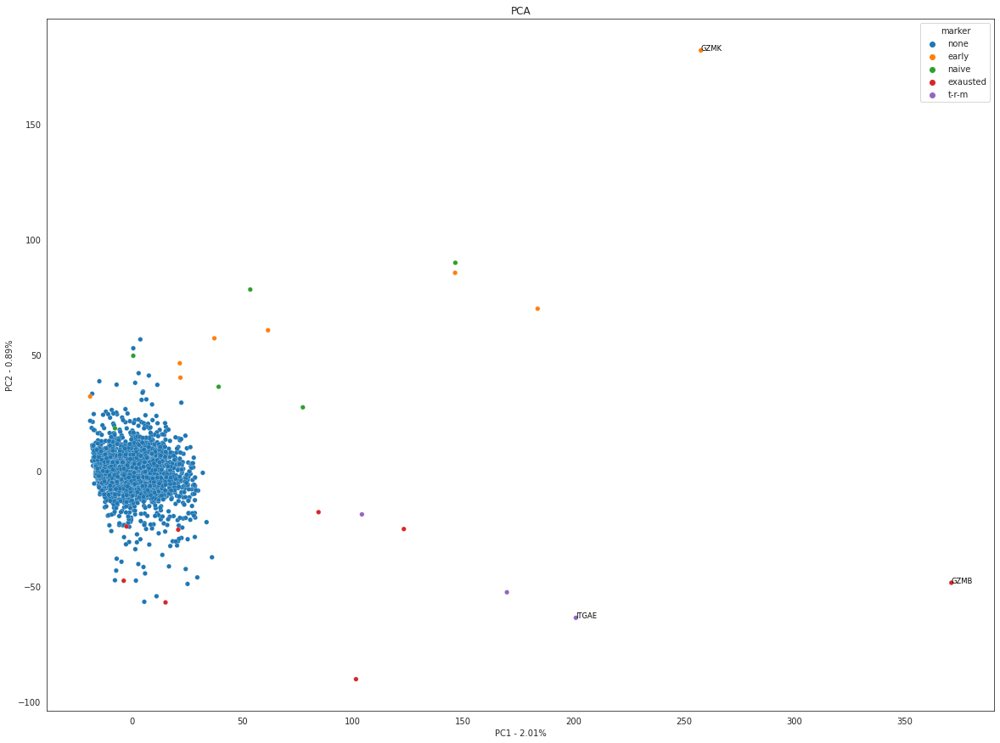

In [ ]:
#pca_df
'''
import plotly.express as px
fig = px.scatter(pca_df, x="PC1", y="PC2", color="marker",
                 labels={
                     "PC1": 'PC1 - ' + str(var_pc1)[:4] + '%',
                     "PC2": 'PC2 - ' + str(var_pc2)[:4] + '%'
                 })
fig.show()
'''

sns.set_style("white")

f, ax = plt.subplots(figsize=(20, 15))
p1 = sns.scatterplot(x='PC1',y='PC2',data=pca_df, linewidth=0.2, s=30, alpha=1, hue='marker', legend='full')
p1.set_title('PCA')
plt.xlabel('PC1 - ' + str(var_pc1)[:4] + '%')
plt.ylabel('PC2 - ' + str(var_pc2)[:4] + '%')

for line in range(0,pca_df.shape[0]):
  if pca_df.PC1[line] > 200:
     p1.text(pca_df.PC1[line]+0.01, pca_df.PC2[line], 
     pca_df.gene[line], horizontalalignment='left', 
     size='small', color='black', weight='regular')
#plt.legend()
plt.show()


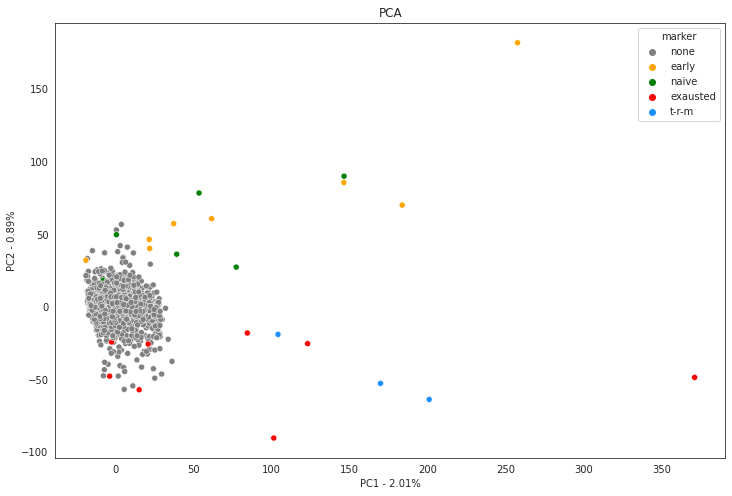

In [ ]:
sns.set_style("white")

f, ax = plt.subplots(figsize=(12, 8))
p1 = sns.scatterplot(x='PC1',y='PC2',data=pca_df, hue='marker', legend='full',
                     #'full',
                     palette=['gray','orange','green','red', 'dodgerblue'])
p1.set_title('PCA')
plt.xlabel('PC1 - ' + str(var_pc1)[:4] + '%')
plt.ylabel('PC2 - ' + str(var_pc2)[:4] + '%')

#for line in range(0,pca_df.shape[0]):
 # if ((pca_df.PC2[line] > 45) or (pca_df.PC2[line] < -25)) and (pca_df.marker_main[line]!='none'):
  #   p1.text(pca_df.PC2[line]+0.01, pca_df.PC3[line], 
   #  pca_df.gene[line], horizontalalignment='left', 
     #pca_df.gene[line] + ' ' + pca_df.marker_main[line], horizontalalignment='left', 
   #  size='small', color='black', weight='regular')
#plt.legend()
plt.show()



#### Plotting the result of PCA2-3 

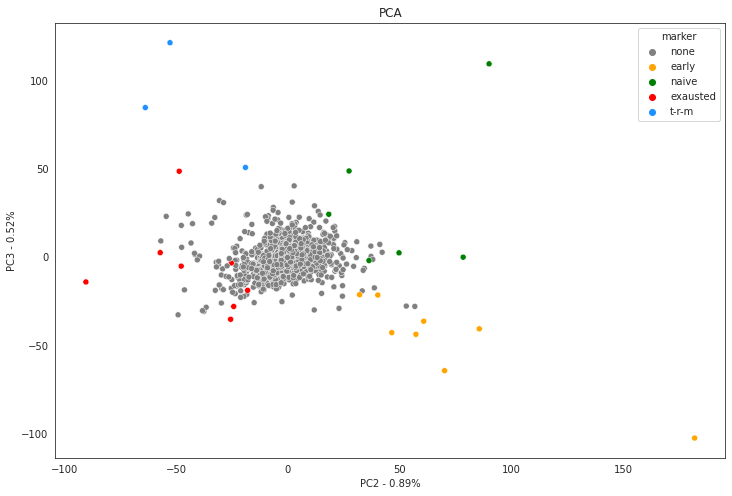

In [ ]:
'''
fig = px.scatter(pca_df, x="PC2", y="PC3", color="marker",
                 labels={
                     "PC2": 'PC2 - ' + str(var_pc2)[:4] + '%',
                     "PC3": 'PC3 - ' + str(var_pc3)[:4] + '%'
                 })
fig.show()
'''

sns.set_style("white")

f, ax = plt.subplots(figsize=(12, 8))
p1 = sns.scatterplot(x='PC2',y='PC3',data=pca_df, hue='marker', legend='full',
                     #'full',
                     palette=['gray','orange','green','red', 'dodgerblue'])
p1.set_title('PCA')
plt.xlabel('PC2 - ' + str(var_pc2)[:4] + '%')
plt.ylabel('PC3 - ' + str(var_pc3)[:4] + '%')

#for line in range(0,pca_df.shape[0]):
 # if ((pca_df.PC2[line] > 45) or (pca_df.PC2[line] < -25)) and (pca_df.marker_main[line]!='none'):
  #   p1.text(pca_df.PC2[line]+0.01, pca_df.PC3[line], 
   #  pca_df.gene[line], horizontalalignment='left', 
     #pca_df.gene[line] + ' ' + pca_df.marker_main[line], horizontalalignment='left', 
   #  size='small', color='black', weight='regular')
#plt.legend()
plt.show()



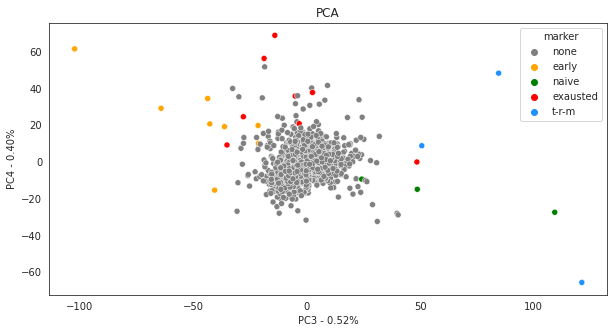

In [ ]:
sns.set_style("white")

f, ax = plt.subplots(figsize=(10, 5))
p1 = sns.scatterplot(x='PC3',y='PC4',data=pca_df, hue='marker', legend='full',
                     palette=['gray','orange','green','red', 'dodgerblue'])
p1.set_title('PCA')
plt.xlabel('PC3 - ' + str(var_pc3)[:4] + '%')
plt.ylabel('PC4 - ' + str(var_pc4)[:4] + '%')

#for line in range(0,pca_df.shape[0]):
 # if ((pca_df.PC2[line] > 45) or (pca_df.PC2[line] < -25)) and (pca_df.marker_main[line]!='none'):
  #   p1.text(pca_df.PC2[line]+0.01, pca_df.PC3[line], 
   #  pca_df.gene[line], horizontalalignment='left', 
     #pca_df.gene[line] + ' ' + pca_df.marker_main[line], horizontalalignment='left', 
   #  size='small', color='black', weight='regular')
#plt.legend()
plt.show()



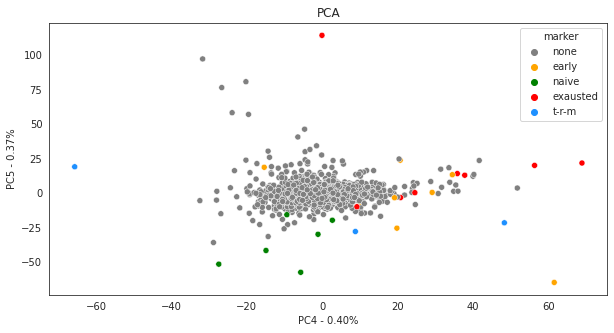

In [ ]:
sns.set_style("white")

f, ax = plt.subplots(figsize=(10, 5))
p1 = sns.scatterplot(x='PC4',y='PC5',data=pca_df, hue='marker', legend='full',
                     palette=['gray','orange','green','red', 'dodgerblue'])
p1.set_title('PCA')
plt.xlabel('PC4 - ' + str(var_pc4)[:4] + '%')
plt.ylabel('PC5 - ' + str(var_pc5)[:4] + '%')

plt.show()



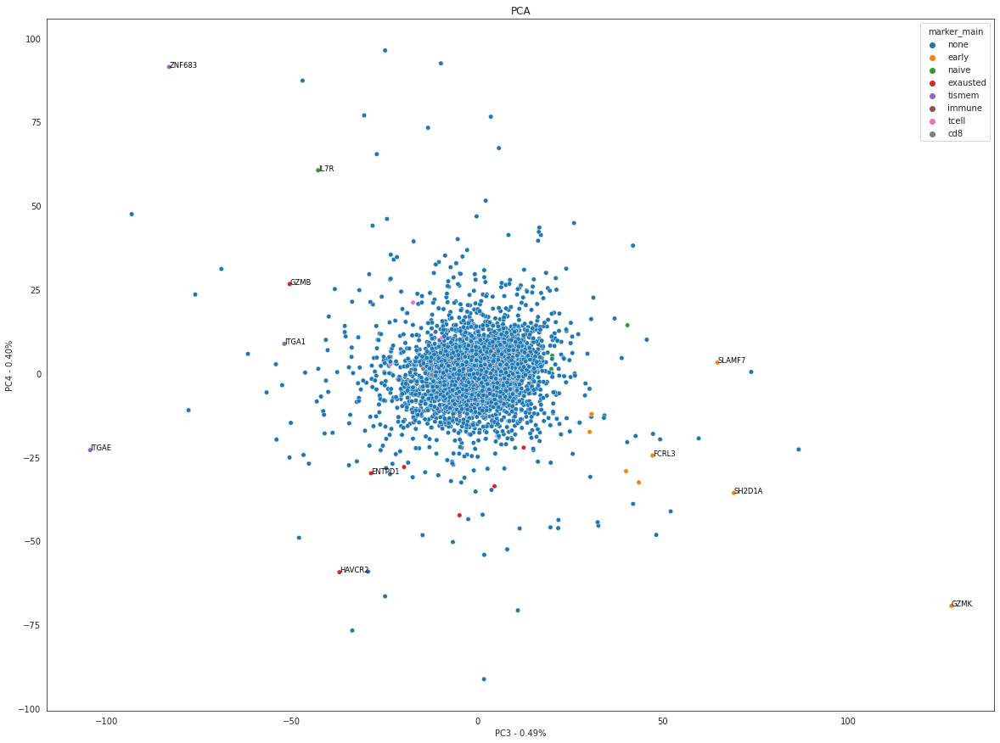

In [ ]:

sns.set_style("white")

f, ax = plt.subplots(figsize=(20, 15))
p1 = sns.scatterplot(x='PC3',y='PC4',data=pca_df, s=30, hue='marker_main', legend='full')
p1.set_title('PCA')
plt.xlabel('PC3 - ' + str(var_pc3)[:4] + '%')
plt.ylabel('PC4 - ' + str(var_pc4)[:4] + '%')

for line in range(0,pca_df.shape[0]):
  if ((pca_df.PC3[line] > 45) or (pca_df.PC3[line] < -25)) and (pca_df.marker_main[line]!='none'):
     p1.text(pca_df.PC3[line]+0.01, pca_df.PC4[line], 
     pca_df.gene[line], horizontalalignment='left', 
     #pca_df.gene[line] + ' ' + pca_df.marker_main[line], horizontalalignment='left', 
     size='small', color='black', weight='regular')
#plt.legend()
plt.show()



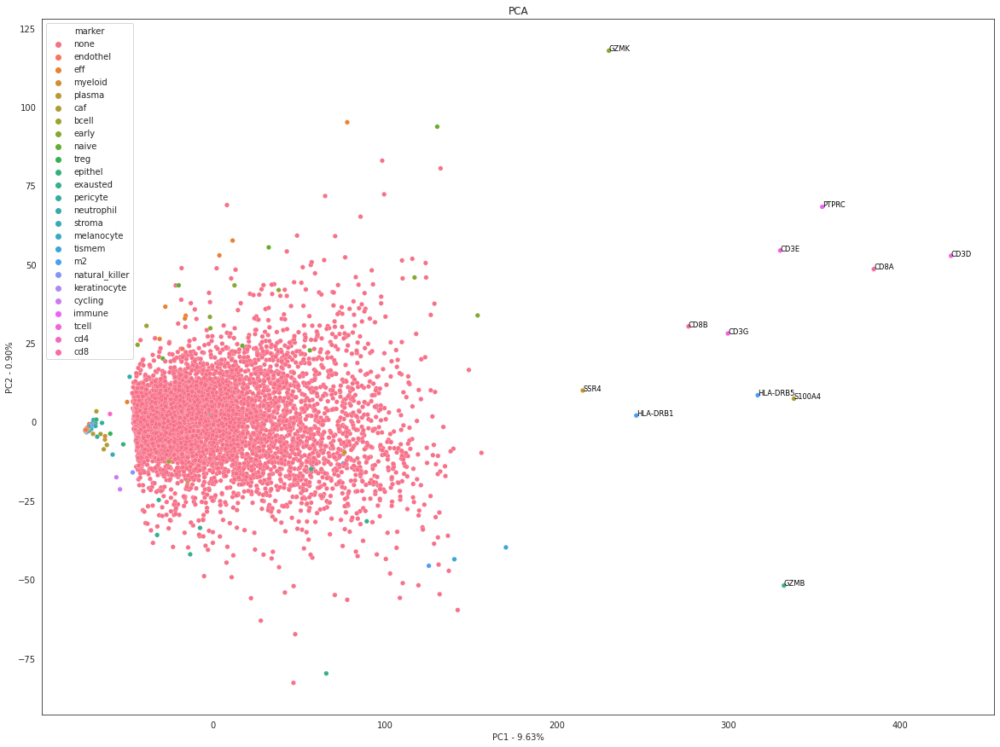

In [ ]:
#pca_df



'''
fig = px.scatter(pca_df, x="PC1", y="PC2", color="marker",
                 labels={
                     "PC1": 'PC1 - ' + str(var_pc1)[:4] + '%',
                     "PC2": 'PC2 - ' + str(var_pc2)[:4] + '%'
                 })
fig.show()
'''

sns.set_style("white")

f, ax = plt.subplots(figsize=(20, 15))
p1 = sns.scatterplot(x='PC1',y='PC2',data=pca_df, linewidth=0.2, s=30, alpha=1, hue='marker', legend='full')
p1.set_title('PCA')
plt.xlabel('PC1 - ' + str(var_pc1)[:4] + '%')
plt.ylabel('PC2 - ' + str(var_pc2)[:4] + '%')

for line in range(0,pca_df.shape[0]):
  if pca_df.PC1[line] > 200:
     p1.text(pca_df.PC1[line]+0.01, pca_df.PC2[line], 
     pca_df.gene[line], horizontalalignment='left', 
     size='small', color='black', weight='regular')
#plt.legend()
plt.show()


In [ ]:
import plotly.express as px
fig = px.scatter(pca_df, x="PC1", y="PC2", color="marker_main",
                 labels={
                     "PC1": 'PC1 - ' + str(var_pc1)[:4] + '%',
                     "PC2": 'PC2 - ' + str(var_pc2)[:4] + '%'
                 })
fig.show()


In [ ]:
fig = px.scatter(pca_df, x="PC3", y="PC4", color="marker_main",
                 labels={
                     "PC3": 'PC3 - ' + str(var_pc3)[:4] + '%',
                     "PC4": 'PC4 - ' + str(var_pc4)[:4] + '%'
                 })
fig.show()


In [ ]:
fig = px.scatter(pca_df, x="PC2", y="PC3", color="marker_main",
                 labels={
                     "PC2": 'PC2 - ' + str(var_pc2)[:4] + '%',
                     "PC3": 'PC3 - ' + str(var_pc3)[:4] + '%'
                 })
fig.show()


In [ ]:
fig = px.scatter(pca_df, x="PC4", y="PC5", color="marker_main",
                 labels={
                     "PC4": 'PC4 - ' + str(var_pc4)[:4] + '%',
                     "PC5": 'PC5 - ' + str(var_pc5)[:4] + '%'
                 })
fig.show()


In [ ]:
fig = px.scatter(pca_df, x="PC5", y="PC6", color="marker",
                 labels={
                     "PC5": 'PC5 - ' + str(var_pc5)[:4] + '%',
                     "PC6": 'PC6 - ' + str(var_pc6)[:4] + '%'
                 })
fig.show()


In [ ]:
pca_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,gene,marker
0,-429.638757,33.950889,12.165021,-5.581430,15.521498,-9.475756,16.958163,12.052767,25.694203,-13.578939,NAT2,none
1,553.842383,-131.961993,105.480163,-130.023034,-105.998885,-193.262938,70.432295,-178.955323,-70.133649,-10.096093,AKT3,none
2,-425.055548,17.103855,11.459474,15.277705,18.428321,4.418668,1.526467,4.708504,-6.596092,27.588384,NR2E3,none
3,-409.731541,35.385713,47.981798,5.614508,10.383290,-7.057873,2.159832,6.291367,16.582941,3.458983,SNORD116-2,none
4,13.763497,20.264971,42.918606,-20.233341,-137.267929,-29.583345,-69.438080,16.560963,-24.427621,10.205151,GUSBP9,none
...,...,...,...,...,...,...,...,...,...,...,...,...
6173,1247.536789,68.279649,-57.944871,33.866489,-85.781290,91.276662,108.744217,142.150761,-36.998884,107.771511,MED13,none
6174,453.975143,-171.331704,99.695530,113.683435,-139.744015,-68.620736,-58.858330,115.294137,99.453911,-45.236640,NR1D2,none
6175,94.808884,-3.849910,6.091698,-4.361095,-114.006229,28.759309,32.124656,41.038006,-26.177955,-95.267198,DOPEY2,none
6176,-301.599374,-77.616025,-11.484342,41.385226,54.982188,54.926011,25.433032,10.743680,-92.934551,90.246276,CDH1,none


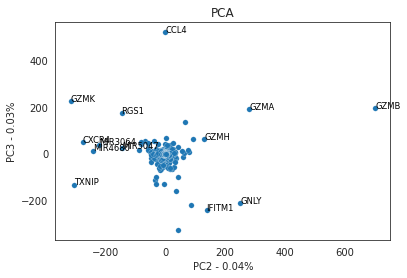

In [ ]:
p1 = sns.scatterplot(x='PC2',y='PC3',data=pca_df, linewidth=0.2, s=30, alpha=1)
p1.set_title('PCA')
plt.xlabel('PC2 - ' + str(var_pc2)[:4] + '%')
plt.ylabel('PC3 - ' + str(var_pc3)[:4] + '%')

for line in range(0,pca_df.shape[0]):
 # print(pca_df.PC2[line])
  if (pca_df.PC2[line] > 100) or (pca_df.PC2[line] < -100) or (pca_df.PC3[line] > 200):
     p1.text(pca_df.PC2[line]+0.01, pca_df.PC3[line], 
     pca_df.symbol[line], horizontalalignment='left', 
     size='small', color='black', weight='regular')


plt.show()


In [ ]:
X.shape

(23459, 2182)

Explained variance ratio after transformation, %: 5.488


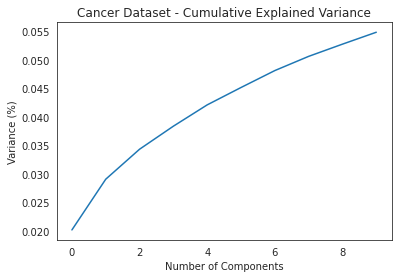

In [ ]:

print(f"Explained variance ratio after transformation, %: {np.sum(pca.explained_variance_ratio_)*100:.3f}")
explained_variance_ratio_vec = np.round(pca.explained_variance_ratio_,2)

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('Cancer Dataset - Cumulative Explained Variance')
plt.show()


In [ ]:
pca.n_samples_


2751

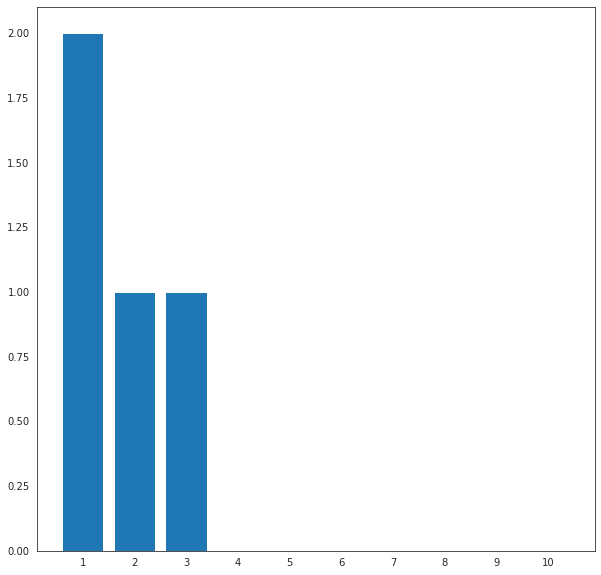

In [ ]:
#pca10 = PCA(n_components=10)
#X_p10= pca10.fit_transform(X_s)
#explained_variance_ratio_vec10 = np.round(pca10.explained_variance_ratio_,1)
explained_variance_ratio_vec = np.round(pca.explained_variance_ratio_,2)
plt.figure(figsize=(10,10))
var = explained_variance_ratio_vec*100
lbls = [str(x) for x in range(1,len(var)+1)]
plt.bar(x=range(1,len(var)+1), height = var, tick_label = lbls)
plt.show()

### KNN train

In [ ]:
pca_df = pd.read_csv('pca_df_10.csv', index_col=None)
pca_df.drop(['Unnamed: 0'], axis=1, inplace=True)

pca_df_KNN = pca_df[~(pca_df.marker == 'none')]
pca_df_KNN['marker'].value_counts()
pca_df_KNN.shape
labels = pca_df_KNN.marker
genes = pca_df_KNN.gene
x_train = pca_df_KNN.drop(['marker', 'gene'], axis=1) 
x_train


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
285,21.548507,46.486427,-42.672161,20.769939,23.933562,-2.864686,7.612019,-8.232244,2.943071,-1.946849
324,53.478242,78.399967,-0.039615,-5.814980,-57.748604,23.016220,56.857860,-14.661601,-9.655998,-6.604560
392,-3.844711,-47.641865,-5.085924,35.897777,14.160381,9.903926,21.555064,-6.068552,-4.466021,1.435433
739,169.750079,-52.650361,121.224716,-65.941622,18.791141,17.323132,-33.349656,-38.117977,-29.454145,0.798987
995,371.101807,-48.540536,48.543606,-0.167029,113.840625,10.147631,-8.827776,16.940453,-12.060474,2.481641
996,257.613079,181.877305,-102.272603,61.554593,-64.628817,2.717173,-39.139897,-1.051819,-12.074735,10.100633
1054,146.401516,89.985006,109.278323,-27.418390,-51.632764,-8.768673,86.304487,38.992269,-5.048768,-5.488876
1067,104.074722,-18.929217,50.711779,8.781949,-27.632420,4.890098,-21.240957,-5.134191,-12.572372,-1.673138
1069,200.986923,-63.702614,84.565147,48.283149,-21.337138,-10.637571,-12.610819,-10.245385,17.240037,-8.126243
1104,123.059540,-25.269503,-3.318790,20.794313,-3.366421,22.437360,-21.034789,49.654018,10.084275,-12.572840


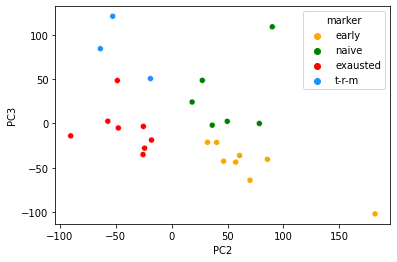

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

pca_df_KNN = pca_df[~(pca_df.marker == 'none')]
labels = pca_df_KNN.marker
genes = pca_df_KNN.gene
x_train = pca_df_KNN.drop(['marker', 'gene'], axis=1) 

neigh = KNeighborsClassifier(n_neighbors=4, weights='distance')
neigh.fit(x_train, labels)
#y_train = neigh.predict(x_train)
#print(neigh.score(x_train, labels))
x_result = pd.concat([x_train, labels], axis=1)
sns.scatterplot(x=x_result['PC2'],y=x_result['PC3'],data=x_result, hue='marker', legend='full',
                     palette=['orange','green','red', 'dodgerblue'])
plt.xlabel('PC2')
plt.ylabel('PC3')
#plt.scatter(x_train['PC2'], x_train['PC3'], c=labels, edgecolors="k")
plt.show()

In [ ]:
pca_df_test = pca_df[(pca_df.marker == 'none')]
indx_pca_df_test = pca_df_test.index
print(indx_pca_df_test.shape)
gene_names_test = pca_df_test.gene.reset_index(drop=True)
x_test = pca_df_test.drop(['marker', 'gene'], axis=1)
y_pred = neigh.predict(x_test)
y_pred.shape
df_res_KNN = pd.DataFrame(data=neigh.predict_proba(x_test), columns=neigh.classes_)
df_res_KNN = pd.concat((df_res_KNN, gene_names_test), axis=1)
df_res_KNN.sort_values(by=['exausted'], ascending=False)
#transform to numpy so that to calculate label according to the proba 

res_KNN_numpy = df_res_KNN.drop(['gene'], axis=1).to_numpy()
indxs = np.argmax(res_KNN_numpy, axis=1)
print(indxs.shape)

#res_KNN_numpy[:, indxs]

for i in range(len(df_res_KNN)):
#  print(df_res_KNN.iloc[i, indxs[i]], df_res_KNN.columns[indxs[i]])
  df_res_KNN.loc[i, 'segment'] = df_res_KNN.columns[indxs[i]]
final_res = pd.concat([pca_df_test.drop(['gene', 'marker'], axis=1).reset_index(drop=True), df_res_KNN], axis=1, join='outer')
ex_top10 = final_res.loc[final_res.segment=='exausted'].sort_values(by=['exausted'], ascending = False)[:10]
naiv_top10 = final_res.loc[final_res.segment=='naive'].sort_values(by=['naive'], ascending = False)[:10]
ear_top10 = final_res.loc[final_res.segment=='early'].sort_values(by=['early'], ascending = False)[:10]
final_res = pd.concat([ex_top10.reset_index(drop=True), naiv_top10.reset_index(drop=True), ear_top10.reset_index(drop=True)], axis=0)
final_res.reset_index(drop=True, inplace=True)
final_res.shape
#pca_df_test.shape, df_res_KNN.shape
final_res[['early', 'exausted', 'naive', 't-r-m', 'gene', 'segment']].to_csv('KNN_top10_3segments.csv')

,early,exausted,naive,t-r-m,gene,segment
0,0.000000,1.000000,0.000000,0.0,MYO7A,exausted
1,0.000000,1.000000,0.000000,0.0,MAGEH1,exausted
2,0.000000,1.000000,0.000000,0.0,TNFRSF9,exausted
3,0.000000,1.000000,0.000000,0.0,FANCL,exausted
4,0.000000,1.000000,0.000000,0.0,CTLA4,exausted
5,0.000000,1.000000,0.000000,0.0,SLC27A2,exausted
6,0.000000,1.000000,0.000000,0.0,HAPLN3,exausted
7,0.000000,1.000000,0.000000,0.0,CSF1,exausted
8,0.000000,1.000000,0.000000,0.0,FAM3C,exausted
9,0.000000,1.000000,0.000000,0.0,PDLIM7,exausted


###plot the result of segmenting genes

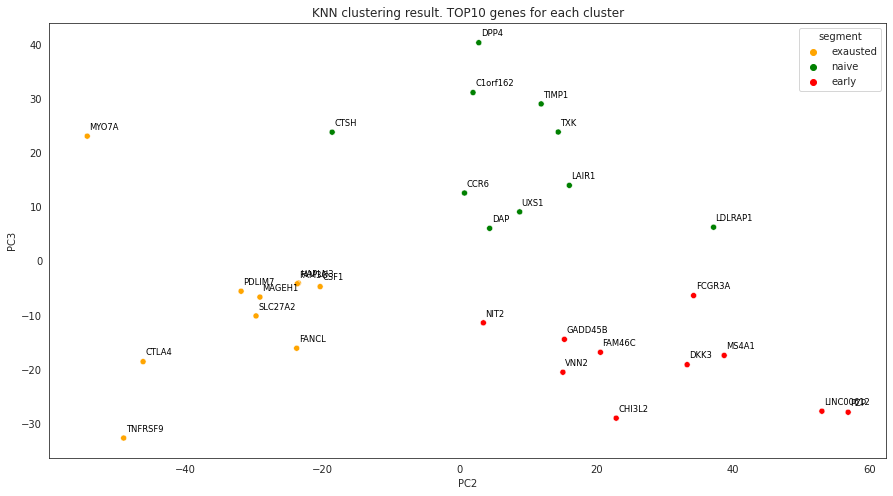

In [ ]:
sns.set_style("white")

f, ax = plt.subplots(figsize=(15, 8))
p1 = sns.scatterplot(x='PC2',y='PC3',data=final_res, hue='segment', legend='full',
                     palette=['orange','green','red'])
p1.set_title('KNN clustering result. TOP10 genes for each cluster')
plt.xlabel('PC2')
#- ' + str(var_pc2)[:4] + '%')
plt.ylabel('PC3')
#- ' + str(var_pc3)[:4] + '%')

for line in range(0,final_res.shape[0]):
 # if ((pca_df.PC2[line] > 45) or (pca_df.PC2[line] < -25)) and (pca_df.marker_main[line]!='none'):
     p1.text(final_res.PC2[line]+0.3, final_res.PC3[line]+1.2, final_res.gene[line], horizontalalignment='left', 
             size='small', color='black', weight='regular')
#plt.legend()
plt.show()



In [ ]:
import plotly.express as px
fig = px.scatter(final_res, x="PC2", y="PC3", color="segment", hover_name='gene', text='gene',
                 labels={
                     "PC2": 'PC2',
                     # - ' + str(var_pc3)[:4] + '%',
                     "PC3": 'PC3'
                     # - ' + str(var_pc4)[:4] + '%'
                 })
fig.show()


In [ ]:
#df_res_KNN.to_csv('df_res_KNN.csv')


,early,exausted,naive,t-r-m,gene
0,0.25,0.25,0.50,0.0,A1BG
1,0.25,0.25,0.50,0.0,AKT3
2,0.25,0.50,0.25,0.0,ACOT8
3,0.25,0.25,0.50,0.0,GNPDA1
4,0.00,0.50,0.50,0.0,LINC00892
...,...,...,...,...,...
2721,0.50,0.25,0.25,0.0,THOC1
2722,0.00,0.75,0.25,0.0,REC8
2723,0.25,0.50,0.25,0.0,RCE1
2724,0.50,0.00,0.50,0.0,DGCR2


In [ ]:
np.unique(y_pred)

array(['early', 'exausted', 'naive'], dtype=object)

### Modelling on the smaller dataset

####Variant 1 on the same dataset (with log "scaling" and the most variable genes chosen)

In [ ]:
gene_labels_fin = training_set['gene'].reset_index(drop=True).copy()
gene_markers_fin = training_set['marker'].reset_index(drop=True).copy()

X_nn = training_set.reset_index(drop=True)
X_nn = X_nn.iloc[:, :-2]
X_nn

,TTC100-0616A,TTC10-0616A,TTC101-0616A,TTC102-0616A,TTC103-0616A,TTC104-0616A,TTC1-0616A,TTC107-0616A,TTC108-0616A,TTC109-0616A,...,TTC59-20171219,TTC61-20171219,TTC6-20171219,TTC62-20171219,TTC63-20171219,TTC64-20171219,TTC7-20171219,TTC8-20171219,TTC9-20171219,TTY9-20171219
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,2.813525,0.000000,0.799087,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.464668,0.00000,6.502394,5.910972,0.000000,6.868884,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,10.407130,10.234698,11.062262,11.391432,10.237568,11.32721,10.568716,9.315399,10.392210,11.916607,...,11.898167,11.571577,6.102868,2.715893,11.690190,2.545968,13.781959,11.913061,11.258360,10.732159
3,0.000000,0.555816,0.000000,0.000000,2.163499,0.00000,0.757023,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.732778
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.748461,1.056584,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2267,0.879706,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.495695,0.000000
2268,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2269,0.000000,0.000000,0.000000,0.000000,4.882154,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2270,0.000000,9.274122,0.863938,0.000000,0.000000,0.00000,9.409624,0.773996,0.000000,0.000000,...,0.411426,10.144378,0.000000,0.505891,9.458878,0.443607,0.000000,7.995202,0.000000,6.286512


In [ ]:
#training_set = torch.FloatTensor(training_set)
train, valid = train_test_split(X_nn.to_numpy(dtype=np.float32), test_size=0.1, random_state=0)
train.shape, valid.shape

((2044, 2183), (228, 2183))

In [ ]:
nfeatures  = X_nn.shape[1]
print(nfeatures)
train_ds = TabularDataset(train)
valid_ds = TabularDataset(valid)
train_dl = DataLoader(train_ds, batch_size=64, shuffle=True)
valid_dl = DataLoader(valid_ds, batch_size=64, shuffle=False)
x, y = next(iter(train_dl))
x.shape, y.shape

2183


(torch.Size([64, 2183]), torch.Size([64, 2183]))

In [ ]:
model = CiteAutoencoder(nfeatures_rna=nfeatures, nfeatures_pro=0, hidden_rna=400, hidden_pro=0, z_dim=3)
model

CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=2183, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=3, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(3, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=3, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
        (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): LinBnDrop(
        (0): Linear(in_features=400, out_features=2183, bias=True)
      )
    )
  )
)

In [ ]:
lr = 1e-2
epochs = 15
model, losses = train_model(model, train_dl, valid_dl, lr=lr, epochs=epochs)


 67%|██████▋   | 10/15 [00:08<00:04,  1.16it/s]

Epoch 10: train loss 5.824098068207444; valid loss 5.801593286949291


100%|██████████| 15/15 [00:12<00:00,  1.17it/s]


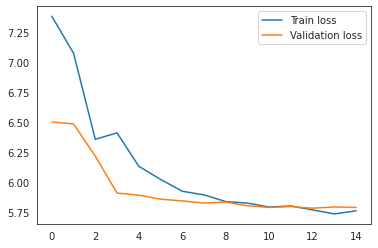

In [ ]:
fig =  plt.plot(figsize=(15,5))
plt.plot(losses['train'], label = 'Train loss')
plt.plot(losses['valid'], label='Validation loss')
plt.legend()
plt.show()

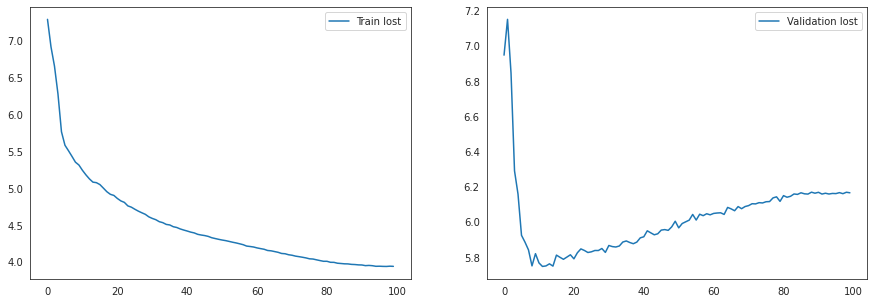

In [ ]:
fig, axes =  plt.subplots(1, 2, figsize=(15,5))
axes[0].plot(losses2['train'], label = 'Train lost')
axes[1].plot(losses2['valid'], label='Validation lost')
axes[0].legend()
axes[1].legend()
plt.show()

In [ ]:
test_ds = TabularDataset(X_nn.to_numpy(dtype=np.float32))
test_dl = DataLoader(test_ds, batch_size=64, shuffle=False)

encodings = get_encodings(model, test_dl)
encodings = encodings.cpu().numpy()
encodings.shape
columns = list(range(1, 4))
encodings_df = pd.DataFrame(data=encodings, columns=columns)
res = pd.concat([encodings_df, training_set.iloc[:, -2:].reset_index(drop=True)], axis=1)



In [ ]:
name_file= dataset_name +'_' + str(len(markers)) +'_NNmodel_'+ str(3) + '.csv'
res.to_csv(os.path.join(home_path, name_file))

#####Plot the result

In [ ]:
embedding = umap.UMAP(random_state=0).fit_transform(encodings)

In [ ]:
embedding.shape

(2268, 2)

In [ ]:
plot_emb_res=pd.concat([gene_labels_fin, gene_markers_fin], axis=1)
plot_emb_res["UMAP1"] = embedding[:, 0]
plot_emb_res["UMAP2"] = embedding[:, 1]
plot_emb_res.head()


,gene,marker,UMAP1,UMAP2
0,A1BG,none,1.791800,8.068158
1,AKT3,none,-0.939061,-1.013234
2,RPL19,AbundantGenes,9.422871,2.766324
3,ACOT8,none,7.488585,7.966295
4,GNPDA1,none,-2.007432,6.097127


#####UMAP printing (10)

In [ ]:
fig = px.scatter(plot_emb_res, x="UMAP1", y="UMAP2", color="marker",
                 color_discrete_sequence=['lightgray','black', 'darkgreen', 'purple', 'red', 'blue','lightgreen', 'cyan','darkgray', 'yellow'],
                    color_discrete_map= color_marker)
fig.show()

#### Variant 2 (100 f_out) dataset is the same

In [ ]:
model2 = CiteAutoencoder(nfeatures_rna=nfeatures, nfeatures_pro=0, hidden_rna=400, hidden_pro=0, z_dim=100)
model2

CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=2182, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=100, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=100, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
        (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): LinBnDrop(
        (0): Linear(in_features=400, out_features=2182, bias=True)
      )
    )
  )
)

In [ ]:
lr = 1e-2
epochs = 100
model2, losses2 = train_model(model2, train_dl, valid_dl, lr=lr, epochs=epochs)


 10%|█         | 10/100 [00:02<00:19,  4.61it/s]

Epoch 10: train loss 5.306741725073921; valid loss 5.81665349352187


 20%|██        | 20/100 [00:04<00:17,  4.59it/s]

Epoch 20: train loss 4.895441271849353; valid loss 5.810308643009352


 31%|███       | 31/100 [00:06<00:10,  6.73it/s]

Epoch 30: train loss 4.605605186693596; valid loss 5.823923746744792


 41%|████      | 41/100 [00:07<00:08,  7.02it/s]

Epoch 40: train loss 4.426715613663799; valid loss 5.90660982546599


 51%|█████     | 51/100 [00:09<00:06,  7.12it/s]

Epoch 50: train loss 4.301079339884748; valid loss 6.001108611839405


 61%|██████    | 61/100 [00:10<00:05,  6.98it/s]

Epoch 60: train loss 4.1970738615170875; valid loss 6.037458191747251


 71%|███████   | 71/100 [00:11<00:04,  7.10it/s]

Epoch 70: train loss 4.0925453866130175; valid loss 6.084564810213835


 81%|████████  | 81/100 [00:13<00:02,  7.11it/s]

Epoch 80: train loss 4.003746998912156; valid loss 6.113925788713538


 91%|█████████ | 91/100 [00:14<00:01,  7.13it/s]

Epoch 90: train loss 3.9551942252149486; valid loss 6.160380501678024


100%|██████████| 100/100 [00:16<00:00,  6.24it/s]

Epoch 100: train loss 3.9353678090644606; valid loss 6.162635706473088


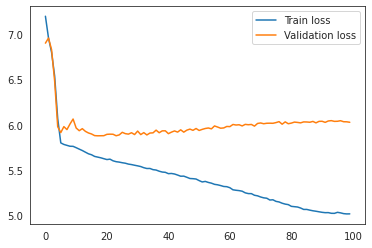

In [ ]:
fig =  plt.plot(figsize=(15,5))
plt.plot(losses['train'], label = 'Train loss')
plt.plot(losses['valid'], label='Validation loss')
plt.legend()
plt.show()

In [ ]:
test_ds2 = TabularDataset(X_nn.to_numpy(dtype=np.float32))
test_dl2 = DataLoader(test_ds2, batch_size=64, shuffle=False)

encodings2 = get_encodings(model2, test_dl2)
encodings2 = encodings2.cpu().numpy()
print(encodings2.shape)
columns = list(range(1, 101))
encodings_df2 = pd.DataFrame(data=encodings2, columns=columns)
res = pd.concat([encodings_df2, training_set.iloc[:, -2:].reset_index(drop=True)], axis=1)
res

(2751, 100)


,1,2,3,4,5,6,7,8,9,10,...,93,94,95,96,97,98,99,100,gene,marker
0,1.076598,1.160784,0.790934,-0.904014,-0.251390,0.274978,0.363238,-0.720981,-0.017489,0.222584,...,0.524965,1.994089,0.905119,0.045744,0.528371,0.899106,-1.511081,0.575976,A1BG,none
1,0.446960,-0.046998,0.887821,1.114964,-0.520420,-0.046047,-0.369267,0.481732,-0.105982,1.334116,...,-0.226712,1.543066,0.466708,0.083972,-0.171410,-0.310023,0.196104,0.028574,AKT3,none
2,0.219361,0.612139,0.660405,1.378080,-0.096069,-1.292986,0.128781,-0.091715,-1.170010,-0.066725,...,0.864707,-0.112289,-0.745371,2.156944,0.792366,0.648211,-0.207677,-0.467653,ACOT8,none
3,-0.616133,-1.133152,0.009940,0.067363,-1.866286,0.311299,-1.940016,-0.695559,-1.319439,0.201278,...,0.068492,-0.743945,0.130314,-0.582158,-1.088455,-1.549205,-2.113458,0.514227,GNPDA1,none
4,1.354744,0.751543,0.910507,0.755254,-1.772231,0.015506,0.004951,0.665096,-0.138107,1.100971,...,0.765816,-0.552003,2.561256,-1.267238,1.810173,1.932078,0.698935,0.087458,LINC00892,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2746,-1.000114,-0.479099,-0.172754,-0.329343,-1.287348,0.791688,-1.942865,-1.485861,-0.037137,-1.305768,...,0.519725,-0.889260,1.745140,1.968263,-0.252818,-1.553611,-2.017944,-0.837930,THOC1,none
2747,0.586380,-1.539468,0.283649,-0.170943,2.009249,-0.413542,-0.300907,0.068129,2.185394,-1.338489,...,2.805701,-1.574032,2.339068,-0.478826,-0.070860,0.188270,-1.572749,1.514415,REC8,none
2748,0.224805,-0.622405,-1.481596,0.062696,0.397632,1.706283,-0.006715,-1.042892,-0.782252,1.274281,...,0.166103,2.567152,-1.148923,1.065968,2.210473,1.300855,-0.011397,-1.092551,RCE1,none
2749,0.404882,-0.856367,-1.221089,-0.241968,-0.426915,-0.564899,1.327598,0.162815,0.486272,-0.290910,...,1.386344,0.573798,0.218342,-0.903355,0.910785,-0.491271,1.205148,-0.356726,DGCR2,none


In [ ]:
embedding2 = umap.UMAP(random_state=0).fit_transform(encodings2)

In [ ]:
embedding2.shape

(2751, 2)

In [ ]:
plot_emb_res2=pd.concat([gene_labels_fin, gene_markers_fin], axis=1)
plot_emb_res2["UMAP1"] = embedding2[:, 0]
plot_emb_res2["UMAP2"] = embedding2[:, 1]
plot_emb_res2.head()

,gene,marker,UMAP1,UMAP2
0,A1BG,none,13.142889,3.296788
1,AKT3,none,15.459809,2.833266
2,ACOT8,none,14.287865,1.261400
3,GNPDA1,none,11.431564,1.869970
4,LINC00892,none,14.536694,0.036017


##### printing UMAP-100 

In [ ]:
fig = px.scatter(plot_emb_res2, x="UMAP1", y="UMAP2", color="marker",
                 color_discrete_sequence=["lightgray", "gold", "green", "red", "blue"])
fig.show()

###Modelling on the whole dataset (no log)

In [ ]:
gene_labels_fin = data_NSCLC_filtered['symbol'].reset_index(drop=True).copy()
gene_markers_fin = data_NSCLC_filtered['marker_four'].reset_index(drop=True).copy()

X_nn = data_NSCLC_filtered.reset_index(drop=True)
X_nn = X_nn.iloc[:, 1:-1]
X_nn.shape



In [ ]:
train, valid = train_test_split(X_nn.to_numpy(dtype=np.float32), test_size=0.1, random_state=0)
train.shape, valid.shape

((19672, 2182), (2186, 2182))

In [ ]:
nfeatures  = X_nn.shape[1]
print(nfeatures)
train_ds = TabularDataset(train)
valid_ds = TabularDataset(valid)
train_dl = DataLoader(train_ds, batch_size=64, shuffle=True)
valid_dl = DataLoader(valid_ds, batch_size=64, shuffle=False)
x, y = next(iter(train_dl))
x.shape, y.shape

2182


(torch.Size([64, 2182]), torch.Size([64, 2182]))

In [ ]:
model3 = CiteAutoencoder(nfeatures_rna=nfeatures, nfeatures_pro=0, hidden_rna=400, hidden_pro=0, z_dim=100)
model3

CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=2182, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=100, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=100, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
        (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): LinBnDrop(
        (0): Linear(in_features=400, out_features=2182, bias=True)
      )
    )
  )
)

In [ ]:
lr = 1e-2
epochs = 100
model3, losses3 = train_model(model3, train_dl, valid_dl, lr=lr, epochs=epochs)


 10%|█         | 10/100 [00:12<01:40,  1.11s/it]

Epoch 10: train loss 280217.5766285838; valid loss 55835.398816331195


 20%|██        | 20/100 [00:23<01:23,  1.05s/it]

Epoch 20: train loss 259293.8535886984; valid loss 55859.96614821592


 30%|███       | 30/100 [00:33<01:13,  1.05s/it]

Epoch 30: train loss 247657.36318077406; valid loss 56510.06655992681


 40%|████      | 40/100 [00:44<01:03,  1.06s/it]

Epoch 40: train loss 243202.36166251526; valid loss 57405.85624428179


 50%|█████     | 50/100 [00:55<00:52,  1.05s/it]

Epoch 50: train loss 224583.13746338387; valid loss 52666.590233302835


 60%|██████    | 60/100 [01:05<00:41,  1.05s/it]

Epoch 60: train loss 179296.55864458368; valid loss 81072.96340347666


 70%|███████   | 70/100 [01:16<00:31,  1.06s/it]

Epoch 70: train loss 165178.92022925985; valid loss 66913.73790599268


 80%|████████  | 80/100 [01:26<00:21,  1.06s/it]

Epoch 80: train loss 135294.07495901536; valid loss 729813.3190187557


 90%|█████████ | 90/100 [01:37<00:10,  1.05s/it]

Epoch 90: train loss 120493.98751318498; valid loss 213876.3903819762


100%|██████████| 100/100 [01:47<00:00,  1.08s/it]

Epoch 100: train loss 121585.5402602684; valid loss 132771.83600182983


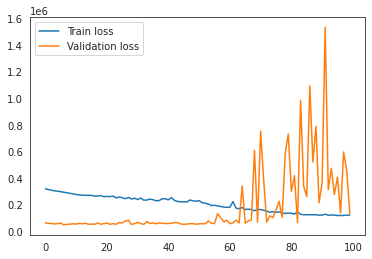

In [ ]:
fig =  plt.plot(figsize=(15,5))
plt.plot(losses3['train'], label = 'Train loss')
plt.plot(losses3['valid'], label='Validation loss')
plt.legend()
plt.show()

In [ ]:
test_ds = TabularDataset(X_nn.to_numpy(dtype=np.float32))
test_dl = DataLoader(test_ds, batch_size=64, shuffle=False)

encodings3 = get_encodings(model3, test_dl)
encodings3 = encodings3.cpu().numpy()
encodings3.shape
columns = list(range(1, 101))
encodings_df3 = pd.DataFrame(data=encodings3, columns=columns)
res3 = pd.concat([encodings_df3, gene_labels_fin.reset_index(drop=True), gene_markers_fin.reset_index(drop=True)], axis=1)

,1,2,3,4,5,6,7,8,9,10,...,93,94,95,96,97,98,99,100,symbol,marker_four
0,0.209053,-0.497365,-3.591390,0.568362,-0.857399,-0.371197,-0.716301,-0.024955,-0.206598,-1.684453,...,-1.675852,0.026706,-2.995634,-0.146873,-0.106221,-0.319709,-1.844411,-2.781212,A1BG,none
1,0.206324,-0.493412,-2.912850,0.562355,-0.857631,-0.287688,-0.715593,-0.026320,-0.207061,-1.684141,...,-0.793718,-0.121196,-2.444768,-0.166326,-0.104074,-0.320188,-1.839411,-2.282547,NAT2,none
2,0.230747,-0.498708,-3.727481,0.565645,-0.857324,-0.387064,-0.716448,-0.025145,-0.206615,-1.684586,...,-1.681599,-0.084211,-3.006145,-0.023986,0.056329,-0.319472,-1.855850,-2.792213,ADA,none
3,0.205745,-0.493222,-2.864483,0.561880,-0.857639,-0.294691,-0.715575,-0.026376,-0.207074,-1.684125,...,-0.819243,-0.133533,-2.361856,-0.166694,-0.104068,-0.320207,-1.839709,-2.198662,CDH2,none
4,0.204586,-0.499047,-3.732972,0.573340,-0.857247,-0.385404,-0.716746,-0.023892,-0.206311,-1.684592,...,-1.681515,0.150656,-3.006482,0.002646,-0.103059,-0.319451,-1.844681,-2.791450,AKT3,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21853,0.213412,-0.497192,-3.598097,0.566265,-0.857407,-0.385583,-0.716239,-0.025231,-0.206658,-1.684463,...,-1.674472,-0.066768,-2.996512,-0.165568,-0.053851,-0.319731,-1.847644,-2.784245,PTBP3,none
21854,0.208090,-0.493958,-2.896519,0.562574,-0.857643,-0.203459,-0.715593,-0.026302,-0.208242,-1.684160,...,-0.548784,-0.166113,-2.717504,-0.165821,0.093769,-0.320212,-1.838443,-2.659226,KCNE2,none
21855,0.213300,-0.502260,-3.737721,0.577941,-0.857092,-0.387243,-0.717364,-0.023151,-0.205957,-1.684832,...,-1.692048,0.238090,-3.020257,0.183288,0.188923,-0.319120,-1.849352,-2.805358,DGCR2,none
21856,0.210735,-0.500993,-3.736780,0.575319,-0.857130,-0.385851,-0.717127,-0.023405,-0.206061,-1.684725,...,-1.686716,0.176388,-3.015662,0.095178,-0.104644,-0.319272,-1.849860,-2.799473,CASP8AP2,none


In [ ]:
embedding3 = umap.UMAP(random_state=0).fit_transform(encodings3)
embedding3.shape

(21858, 2)

In [ ]:
plot_emb_res3=pd.concat([gene_labels_fin, gene_markers_fin], axis=1)
plot_emb_res3["UMAP1"] = embedding3[:, 0]
plot_emb_res3["UMAP2"] = embedding3[:, 1]
plot_emb_res3.head()

,symbol,marker_four,UMAP1,UMAP2
0,A1BG,none,12.914737,-1.799418
1,NAT2,none,10.171292,11.970407
2,ADA,none,10.089325,1.199447
3,CDH2,none,-0.049991,11.648690
4,AKT3,none,10.015018,-4.666229


####UMAP printing result

In [ ]:
fig = px.scatter(plot_emb_res3, x="UMAP1", y="UMAP2", color="marker_four",
                 color_discrete_sequence=["lightgray", "gold", "green", "red", "blue"],)
fig.show()

###Modeling without LOG but on the most variative genes

In [ ]:
# here data_NSCLC_filtered is already with added markers (PLEASE BE AWARE TO ADD THEM WHEN RUNNING FROM SCRATCH)
genes_var2 = data_NSCLC_filtered[['symbol', 'marker_four']].copy()
XX = data_NSCLC_filtered.iloc[:, 1:-1].copy()
genes_var2['Mean'] = XX.mean(axis=1,skipna=True, numeric_only=True)
genes_var2['Std'] = XX.std(axis=1,skipna=True, numeric_only=True)
print('mean:', genes_var2.Mean.mean())
print('std:', genes_var2.Std.mean())
print('std/mean:', genes_var2.Std.mean()/genes_var2.Std.mean())
print(data_NSCLC_filtered.shape)

mean: 41.91217230303858
std: 95.38574427258425
std/mean: 1.0
(21858, 2184)


In [ ]:
genes_var2.shape, XX.shape
XX['gene'] = genes_var2['symbol']
XX['marker'] = genes_var2['marker_four']
XX

,TTC100-0616A,TTC10-0616A,TTC101-0616A,TTC102-0616A,TTC103-0616A,TTC104-0616A,TTC1-0616A,TTC107-0616A,TTC108-0616A,TTC109-0616A,...,TTC61-20171219,TTC6-20171219,TTC62-20171219,TTC63-20171219,TTC64-20171219,TTC7-20171219,TTC8-20171219,TTC9-20171219,gene,marker
0,0.0,0.00,0.00,0.00,0.00,0.00,6.03,0.00,0.74,0.00,...,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,A1BG,none
1,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,1.35,0.0,0.00,0.00,NAT2,none
2,0.0,0.00,5.20,1142.74,1.82,438.12,0.00,0.00,1.94,0.00,...,0.00,0.00,0.00,8041.18,0.00,0.0,5752.31,1732.26,ADA,none
3,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,CDH2,none
4,0.0,0.00,0.00,0.00,0.38,0.00,89.66,59.17,0.00,115.88,...,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,AKT3,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23454,0.0,72.27,0.97,0.37,201.24,0.42,285.69,0.84,0.00,0.00,...,0.00,0.00,0.00,0.00,0.22,0.0,0.00,0.00,PTBP3,none
23455,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,2.94,0.00,0.00,0.00,0.0,0.00,0.00,KCNE2,none
23456,0.0,618.14,0.82,0.00,0.00,0.00,679.11,0.71,0.00,0.00,...,1130.78,0.00,0.42,702.73,0.36,0.0,254.15,0.00,DGCR2,none
23457,85.1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,690.30,0.00,...,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,CASP8AP2,none


In [ ]:
training_set_whole = XX[(genes_var2.Mean>41.9)&((genes_var2.Std/genes_var.Mean)>1)]
print(training_set_whole.shape)
#and now we have to add genes from X that are markers 

count2=0
for key in markers_four.keys():
  for each in markers_four[key]:
    if len(training_set_whole.loc[(training_set_whole['gene'] == each)]) == 0:
      # if there is no such marker in the final dataset
      print('Found', each)
      training_set_whole=training_set_whole.append(XX.loc[(XX['gene'] == each)])      
      count2+=1
    else:
      print('Already exists')
print(count2)

print('Final check')
cnt=0
for key in markers_four.keys():
  for each in markers_four[key]:
    if len(training_set_whole.loc[(training_set_whole['gene'] == each)]) > 0:
      cnt+=1
print('Total number of markers should be 140 and it equals:', cnt)
print(training_set_whole.shape)

(3916, 2184)


In [ ]:
gene_labels_fin_w2 = training_set_whole['gene'].reset_index(drop=True).copy()
gene_markers_fin_w2 = training_set_whole['marker'].reset_index(drop=True).copy()

X_nn_w2 = training_set_whole.reset_index(drop=True).copy()
X_nn_w2 = X_nn_w2.iloc[:, :-2]
print(X_nn_w2.shape)
X_nn_w2.head()


In [ ]:
train, valid = train_test_split(X_nn_w2.to_numpy(dtype=np.float32), test_size=0.1, random_state=0)
train.shape, valid.shape

((3524, 2182), (392, 2182))

In [ ]:
nfeatures  = X_nn_w2.shape[1]
print(nfeatures)
train_ds = TabularDataset(train)
valid_ds = TabularDataset(valid)
train_dl = DataLoader(train_ds, batch_size=64, shuffle=True)
valid_dl = DataLoader(valid_ds, batch_size=64, shuffle=False)
x, y = next(iter(train_dl))
x.shape, y.shape

2182


(torch.Size([64, 2182]), torch.Size([64, 2182]))

In [ ]:
model_w = CiteAutoencoder(nfeatures_rna=nfeatures, nfeatures_pro=0, hidden_rna=400, hidden_pro=0, z_dim=100)
model_w

CiteAutoencoder(
  (encoder): Encoder(
    (encoder_rna): LinBnDrop(
      (0): Linear(in_features=2182, out_features=400, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.1, inplace=False)
    )
    (encoder): LinBnDrop(
      (0): Linear(in_features=400, out_features=100, bias=False)
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): LinBnDrop(
        (0): Linear(in_features=100, out_features=400, bias=False)
        (1): LeakyReLU(negative_slope=0.01)
        (2): BatchNorm1d(400, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): LinBnDrop(
        (0): Linear(in_features=400, out_features=2182, bias=True)
      )
    )
  )
)

In [ ]:
lr = 1e-2
epochs = 100
model_w, losses_w = train_model(model_w, train_dl, valid_dl, lr=lr, epochs=epochs)


 10%|█         | 10/100 [00:03<00:31,  2.88it/s]

Epoch 10: train loss 1593456.1375212825; valid loss 528830.200255102


 20%|██        | 20/100 [00:06<00:24,  3.31it/s]

Epoch 20: train loss 1465484.437163025; valid loss 350891.2369260204


 30%|███       | 30/100 [00:10<00:23,  2.94it/s]

Epoch 30: train loss 1402130.4734676504; valid loss 422554.4902742347


 40%|████      | 40/100 [00:13<00:18,  3.28it/s]

Epoch 40: train loss 1405319.6953036322; valid loss 463514.9357461735


 51%|█████     | 51/100 [00:16<00:10,  4.78it/s]

Epoch 50: train loss 1305920.243083144; valid loss 507569.97177933675


 61%|██████    | 61/100 [00:18<00:07,  5.08it/s]

Epoch 60: train loss 1217269.1231377695; valid loss 426201.6178252551


 71%|███████   | 71/100 [00:20<00:05,  5.09it/s]

Epoch 70: train loss 1192493.5285896708; valid loss 556890.2307079082


 80%|████████  | 80/100 [00:22<00:03,  5.06it/s]

Epoch 80: train loss 1109600.6558598184; valid loss 396406.6737882653


 91%|█████████ | 91/100 [00:24<00:01,  4.98it/s]

Epoch 90: train loss 1071605.284477866; valid loss 428314.6277104592


100%|██████████| 100/100 [00:26<00:00,  3.84it/s]

Epoch 100: train loss 1068611.5752695801; valid loss 408415.44435586734


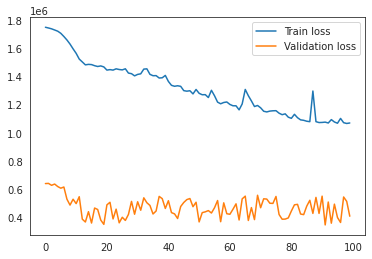

In [ ]:
fig =  plt.plot(figsize=(15,5))
plt.plot(losses_w['train'], label = 'Train loss')
plt.plot(losses_w['valid'], label='Validation loss')
plt.legend()
plt.show()

In [ ]:
test_ds = TabularDataset(X_nn_w2.to_numpy(dtype=np.float32))
test_dl = DataLoader(test_ds, batch_size=64, shuffle=False)

encodings_w = get_encodings(model_w, test_dl)
encodings_w = encodings_w.cpu().numpy()
encodings_w.shape
columns = list(range(1, 101))
encodings_df_w = pd.DataFrame(data=encodings_w, columns=columns)
res_w = pd.concat([encodings_df_w, training_set_whole.iloc[:, -2:].reset_index(drop=True)], axis=1)

,TTC100-0616A,TTC10-0616A,TTC101-0616A,TTC102-0616A,TTC103-0616A,TTC104-0616A,TTC1-0616A,TTC107-0616A,TTC108-0616A,TTC109-0616A,...,TTC58-20171219,TTC59-20171219,TTC61-20171219,TTC6-20171219,TTC62-20171219,TTC63-20171219,TTC64-20171219,TTC7-20171219,TTC8-20171219,TTC9-20171219
0,0.00,0.00,5.20,1142.74,1.82,438.12,0.00,0.00,1.94,0.00,...,0.00,0.00,0.0,0.00,0.00,8041.18,0.0,0.0,5752.31,1732.26
1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,827.42,...,0.00,0.00,0.0,0.00,0.00,357.25,0.0,0.0,0.00,0.00
2,32.16,232.98,0.00,0.00,137.65,29.02,1.75,0.00,82.58,137.47,...,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.0,19.16,0.32
3,0.00,0.00,0.00,4.96,0.00,0.00,0.00,0.00,220.70,0.00,...,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.00
4,219.44,5.84,0.00,0.00,248.92,0.00,4.73,0.00,0.00,555.18,...,1858.95,21.25,0.0,0.00,0.87,9.15,0.0,0.0,0.00,1156.07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3911,51.59,375.66,31.11,60.32,223.44,0.00,200.08,1024.35,136.29,291.92,...,0.00,0.00,0.0,299.95,0.00,0.00,0.0,0.0,0.00,253.41
3912,0.56,0.00,0.00,0.00,0.00,0.00,0.51,1.62,0.00,0.00,...,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.0,0.00,244.41
3913,0.78,732.00,0.00,0.00,784.25,249.10,0.00,0.00,49.70,320.14,...,0.00,0.00,0.0,0.00,0.00,15.34,0.0,0.0,0.00,0.00
3914,0.00,0.22,0.58,0.22,0.20,0.00,0.00,0.00,0.00,0.40,...,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.00


In [ ]:
embedding_w = umap.UMAP(random_state=0).fit_transform(encodings_w)

In [ ]:
embedding_w.shape

(3916, 2)

In [ ]:
plot_emb_res_w=pd.concat([gene_labels_fin_w2, gene_markers_fin_w2], axis=1)
plot_emb_res_w["UMAP1"] = embedding_w[:, 0]
plot_emb_res_w["UMAP2"] = embedding_w[:, 1]
plot_emb_res_w.head()

,gene,marker,UMAP1,UMAP2
0,ADA,none,-3.594731,0.220413
1,MED6,none,8.934153,-1.019510
2,ABI1,none,-2.667313,-1.249884
3,SNHG8,none,-3.064571,1.936298
4,TANK,none,-3.309433,5.901010


#####UMAP printing (10)

In [ ]:
fig = px.scatter(plot_emb_res_w, x="UMAP1", y="UMAP2", color="marker",
                 color_discrete_sequence=["lightgray", "gold", "green", "red", "blue"],)
fig.show()

In [ ]:
data_crc1_filtered.set_index('GENE', inplace=True)

data_crc1_filtered.head()
cell_labels = data_crc1_filtered.columns.astype(str).str[0:3]
cell_labels.unique()
X = data_NSCLC_filtered.iloc[:, 1:]

,GENE,P_N_P0305_00203,P_P_P0305_00238,P_P_P0305_00338,P_P_P0305_00343,P_P_P0305_00381,P_P_P0305_00403,P_P_P0305_00423,P_P_P0305_00426,P_P_P0305_00434,...,P_T_P1228_11127,P_T_P1228_11134,P_T_P1228_11139,P_T_P1228_11140,P_T_P1228_11147,P_T_P1228_11149,P_T_P1228_11154,P_T_P1228_11159,P_T_P1228_11160,P_T_P1228_11164
0,A1BG,0.000000,0.000000,0.000000,0.000000,6.046341,0.000000,2.841568,0.000000,0.000000,...,3.779999,0.000000,3.036606,0.714044,2.571589,2.654251,7.613060,1.387740,1.379757,2.371221
1,NAT2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,ADA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.268954,0.000000,7.984929,...,8.972923,0.000000,1.298088,9.492697,9.292145,1.620724,9.462386,0.000000,0.000000,1.996455
3,AKT3,0.000000,0.000000,0.000000,0.000000,5.891033,0.000000,0.000000,4.552699,0.000000,...,1.674505,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.951299,0.000000,0.000000
4,MED6,0.000000,9.350343,5.662385,0.000000,0.000000,7.974259,9.721712,0.000000,0.000000,...,0.000000,0.000000,1.167620,2.352912,1.571851,2.805180,3.347336,1.546635,3.210139,2.081364
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15174,MT-ND4L,13.076714,13.179317,13.259971,10.730654,12.610513,14.000528,13.038460,13.085280,12.707849,...,5.689220,11.517553,13.064168,12.695036,12.498113,13.291626,12.013526,12.006022,12.643084,12.385827
15175,MT-ND4,10.372532,11.349097,9.548583,8.086341,11.074328,10.744243,10.775367,10.179460,10.883753,...,3.788079,9.810863,10.798099,11.073072,10.282034,10.912370,10.574577,9.664307,11.200854,11.292123
15176,MT-ND5,8.769806,11.498177,10.838464,11.480999,11.346172,9.487013,11.468558,10.670472,9.437524,...,4.154143,11.787589,10.244493,11.266690,11.051232,12.205324,11.087298,10.796409,11.255318,10.734157
15177,MT-ND6,5.808088,10.404977,9.342033,7.878935,9.752131,8.799607,9.928518,6.757174,8.573388,...,3.552341,10.624039,9.500084,10.586572,10.338038,11.006558,5.147328,9.726233,7.866442,9.536954


In [ ]:
df = data_crc1_filtered.T
df['cell_type'] = df.index.astype(str).str[0:3]
df['cell_type'].unique()

array(['GEN', 'P_N', 'P_P', 'P_T'], dtype=object)

In [ ]:
l = data_crc1.columns.astype(str).str[0:3]

In [ ]:
l.unique()

Index(['GEN', 'N_T', 'P_N', 'P_P', 'P_T', 'N_N', 'N_P'], dtype='object')

In [ ]:
labels_crc1['cell_type'] = labels_crc1[0].astype(str).str[0:3]
df = labels_crc1[labels_crc1[1] == 'CD8']
df.cell_type.value_counts()

P_T    1179
P_N     746
P_P     548
Name: cell_type, dtype: int64

In [ ]:
labels_crc1.shape, data_crc1.shape

((5624, 3), (15179, 10469))